In [1]:
import re
import math
import pickle
import requests
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from time import time
import IPython.display as Disp
from wordcloud import WordCloud
from sklearn.metrics.pairwise import cosine_similarity
from gensim import corpora, models, similarities
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from underthesea import word_tokenize
from operator import itemgetter
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', None)

In [2]:
df = pd.read_csv('2k_data_Sep.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Feedback ID      2000 non-null   float64
 1   Lookup Text      2000 non-null   object 
 2   Question Text    2000 non-null   object 
 3   Feedback Type    2000 non-null   object 
 4   Feedback Result  2000 non-null   object 
 5   Human Feedback   2000 non-null   object 
 6   Lookup Image     2000 non-null   object 
 7   Question Image   2000 non-null   object 
dtypes: float64(1), object(7)
memory usage: 125.1+ KB


In [3]:
def clean_function(text):  
    #lowercase
    text = text.lower()
    
#     #xoá ký tự đặc biệt, ký tự không phải alphanumeric 
#     text = re.sub("[^a-z0-9àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",' ', text)
    text = re.sub("[\àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",'', text)    
#     #xoá leading zero
#     text = [e.lstrip('0') for e in text.split(' ')]
#     text = (' ').join(text)
    
    #replace extra spaces with single space
    text = re.sub(' +',' ',text)
    
    #xoá khoảng trắng ở đầu và cuối mỗi câu
    text = text.strip()
    
    #word tokenzie
    text = word_tokenize(text, format='text')
    return text

In [4]:
df['index_org'] = df.index

df['clean_lookup'] = df['Lookup Text'].map(lambda x: clean_function(x))
df['clean_question'] = df['Question Text'].map(lambda x: clean_function(x))

df['char_count_lookup'] = df['clean_lookup'].str.len()
df['word_count_lookup'] = df['clean_lookup'].str.split().str.len()
df['average_word_length_lookup'] = df['char_count_lookup'] / df['word_count_lookup']

df['char_count_question'] = df['clean_question'].str.len()
df['word_count_question'] = df['clean_question'].str.split().str.len()
df['average_word_length_question'] = df['char_count_question'] / df['word_count_question']

In [5]:
check_dup = df[['Lookup Text', 'Question Text']][df[['Lookup Text', 'Question Text']].duplicated()]
df = df.drop(check_dup.index)
df = df.reset_index(drop = True)
df.shape

(1962, 17)

In [6]:
mask1 = df['Human Feedback'] == 'NOT MATCH'
mask2 = df['Human Feedback'] == 'MATCH'

df_neg = df[mask1].reset_index(drop = True)
df_pos = df[mask2].reset_index(drop = True)

print(df_neg.shape)
print(df_pos.shape)

(966, 17)
(996, 17)


In [7]:
df_neg['diff_word'] = abs(df_neg['word_count_question'] - df_neg['word_count_lookup'])
df_pos['diff_word'] = abs(df_pos['word_count_question'] - df_pos['word_count_lookup'])

my_bins = [-np.inf, 5, 10, 15, 20, np.inf]
my_labels = ['Very low', 'Low', 'Medium', 'High', 'Very high']

df_neg['diff_bin'] = pd.cut(df_neg['diff_word'], bins=my_bins, labels=my_labels)
df_pos['diff_bin'] = pd.cut(df_pos['diff_word'], bins=my_bins, labels=my_labels)

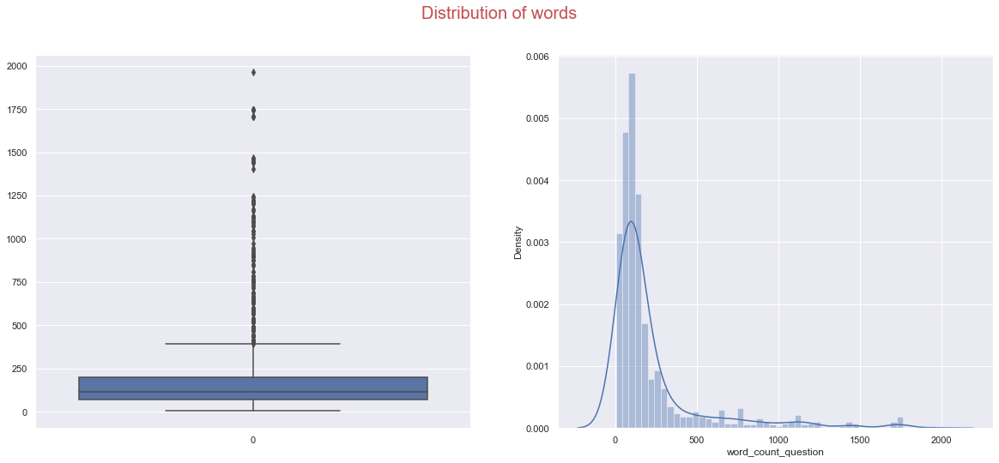

In [8]:
sb.set_theme()
plt.figure(figsize=(20, 8))
plt.subplot(121)
sb.boxplot(data = df_neg['word_count_question'], orient = 'v')
plt.subplot(122)
sb.distplot(df_neg['word_count_question'])
plt.suptitle('Distribution of words', fontsize = 20, color = 'r');

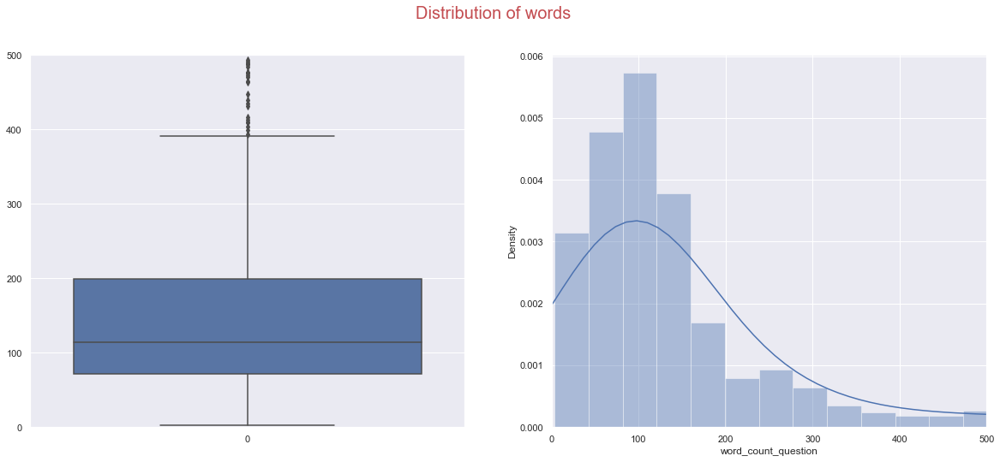

In [9]:
sb.set_theme()
plt.figure(figsize=(20, 8))
plt.subplot(121)
sb.boxplot(data = df_neg['word_count_question'], orient = 'v')
plt.ylim([0, 500])
plt.subplot(122)
sb.distplot(df_neg['word_count_question'])
plt.xlim([0, 500])
plt.suptitle('Distribution of words', fontsize = 20, color = 'r');

In [10]:
demo = df_neg.loc[df_neg['word_count_question'] <= 8]
demo

,Feedback ID,Lookup Text,Question Text,Feedback Type,Feedback Result,Human Feedback,Lookup Image,Question Image,index_org,clean_lookup,clean_question,char_count_lookup,word_count_lookup,average_word_length_lookup,char_count_question,word_count_question,average_word_length_question,diff_word,diff_bin
83,4933.0,a) \( 427 \times 75 \),a) \( 427 \times 308 \),POSITIVE,NOT_MATCH,NOT MATCH,https://s3.icankid.io/uploads/question/39f643a0-2de3-11ed-8671-9785b1571c36,https://s3.icankid.io/uploads/question/7a3af100-28dd-11ed-8671-9785b1571c36,180,a ) \ ( 427_\_times 75_\ ),a ) \ ( 427_\_times 308_\ ),26,7,3.714286,27,7,3.857143,0,Very low
216,5774.0,a) \( A=5 x-x^{2} \)\nb) \( B=x-x^{2} \)\nc) \( C=4 x-x^{2}+3 \),#ERROR!,NEGATIVE,SKIP,NOT MATCH,https://s3.icankid.io/uploads/question/fb45c0f0-31ce-11ed-8671-9785b1571c36,https://s3.icankid.io/uploads/question/88fb71a0-07d2-11ed-abd5-4dcb92c2b90f,489,a ) \ ( a = 5 x-x ^ { 2 }_\ ) b ) \ ( b = x-x ^ { 2 }_\ ) c ) \ ( c = 4 x-x ^ { 2 } + 3 \ ),# error !,91,41,2.219512,9,3,3.000000,38,Very high
672,8348.0,Điền số thích hợp vào ô trống ở bảng sau:,a) Điền số thích hợp vào ô trống,POSITIVE,SKIP,NOT MATCH,https://s3.icankid.io/uploads/question/effaf600-37c5-11ed-afcb-abad28552b30,https://s3.icankid.io/uploads/question/f6ad9770-22b5-11ed-8671-9785b1571c36,1439,in s thch hp vo trng bng sau :,a ) in s thch hp vo trng,30,9,3.333333,24,8,3.000000,1,Very low


In [11]:
def display_image(url_render):
    import requests
    import IPython.display as Disp
    img1 = Disp.Image(requests.get(url_render).content)
    display(img1)

Pairs: 83


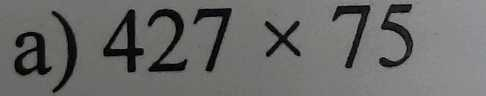

a) \( 427 \times 75 \)


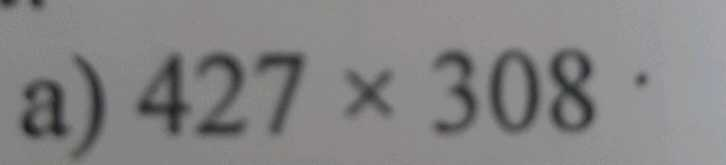

a) \( 427 \times 308 \)
Pairs: 216


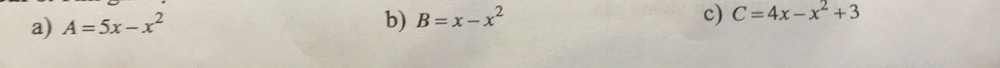

a) \( A=5 x-x^{2} \)
b) \( B=x-x^{2} \)
c) \( C=4 x-x^{2}+3 \)


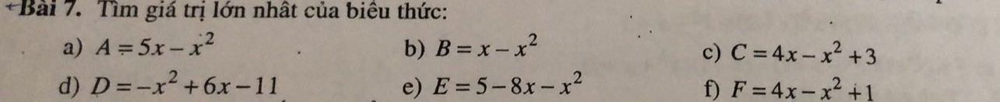

#ERROR!
Pairs: 672


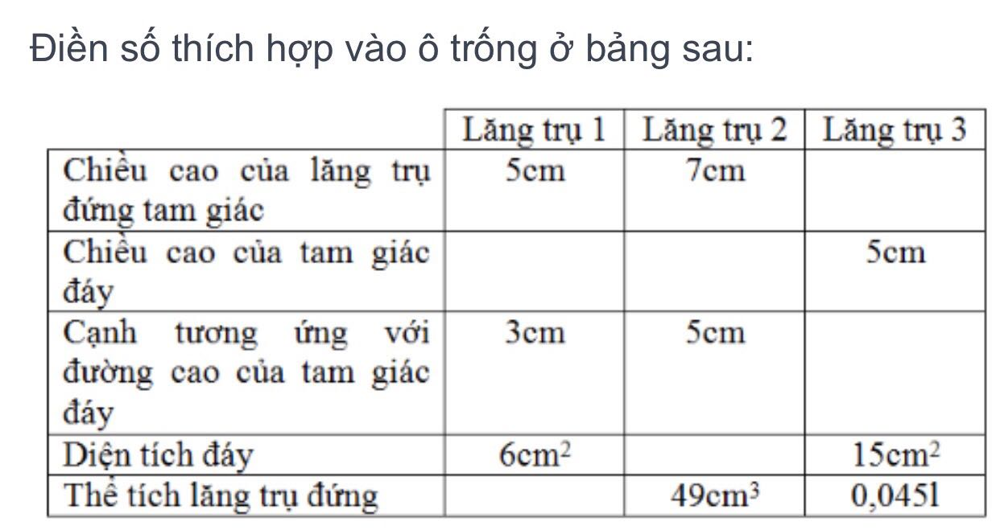

Điền số thích hợp vào ô trống ở bảng sau:


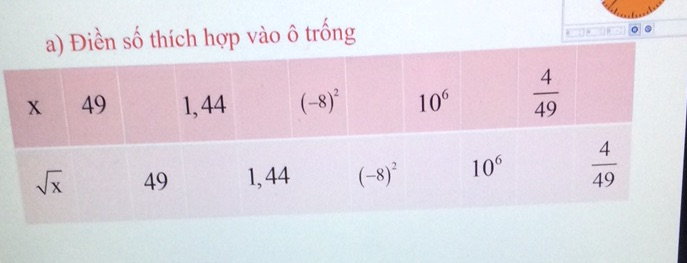

a) Điền số thích hợp vào ô trống


In [12]:
for idx in demo.index:
    print('Pairs:', idx)
    display_image(df_neg.iloc[idx]['Lookup Image'])
    print(df_neg.iloc[idx]['Lookup Text'])
    display_image(df_neg.iloc[idx]['Question Image'])
    print(df_neg.iloc[idx]['Question Text'])

In [13]:
post_url = 'https://data-checking.herokuapp.com/data-checking'
def request_API(post_url, payload):
    r = requests.post(post_url, payload)
    return r

In [14]:
url_test = 'https://s3.icankid.io/uploads/question/628caf10-1e99-11ed-8671-9785b1571c36'

In [15]:
a = request_API(post_url, df_pos.iloc[0]['Lookup Image'])
a.text

'"Can not read image, please try again!"'

In [16]:
df['diff_word'] = abs(df['word_count_question'] - df['word_count_lookup'])

my_bins = [-np.inf, 5, 10, 15, 20, np.inf]
my_labels = ['Very low', 'Low', 'Medium', 'High', 'Very high']

df['diff_bin'] = pd.cut(df['diff_word'], bins=my_bins, labels=my_labels)

In [17]:
with open('vietnamese-stopwords.txt', 'r', encoding='utf-8') as file:
    vn_stop_words = file.read()
vn_stop_words = vn_stop_words.split('\n') 

# combine Vietnamese stopwords and English stopwords
stop_words = ENGLISH_STOP_WORDS.union(vn_stop_words)

In [65]:
tf = TfidfVectorizer(analyzer = 'word', stop_words = stop_words, max_features = 3000)
tfidf_matrix = tf.fit_transform(df['clean_question'])
tfidf_matrix = pd.DataFrame(tfidf_matrix.toarray(),
                            columns = tf.get_feature_names())
tfidf_matrix.shape

(1962, 2900)

In [66]:
sums_weight = tfidf_matrix.sum().sort_values(ascending = False)
sums_weight.head(5)

frac      222.343818
sqrt      141.233568
_right     82.653759
_left      82.174167
a_         78.245784
dtype: float64

In [67]:
def cosine_search_all(queries, tf, tfidf_matrix, data, top_result = 5, check_time = True):
    t0 = time()
    results = pd.DataFrame(columns = ['lookup_text', 'question_text', 'sim_score', 
                                      'cosine_word_count_question', 'cosine_diff_bin', 'cosine_image'])
    for q in queries:
        query = clean_function(q)
        query_tf = tf.transform([query])
        query_tf = pd.DataFrame(query_tf.toarray(),
                                columns = tf.get_feature_names())
        cosine_sim = cosine_similarity(query_tf, tfidf_matrix).flatten()
        related_index = cosine_sim.argsort()[-top_result:][::-1]
        cosine_sim = sorted(cosine_sim, reverse = True)
        similarities_score = cosine_sim[:top_result]
        result = pd.DataFrame({'lookup_text': q,
                               'question_text': data.iloc[related_index, :]['Question Text'].values,
                               'sim_score': similarities_score,
                               'cosine_word_count_question': data.iloc[related_index, :]['word_count_question'].values,
                               'cosine_diff_bin': data.iloc[related_index, :]['diff_bin'].values,
                               'cosine_image': data.iloc[related_index, :]['Question Image'].values}).head(1)
        results = pd.concat([results, result], ignore_index = True)
    times = time() - t0
    if check_time:
        if times < 60:
            print('Cosine search took {:.2f}s.'.format(times))
        else:
            print('Cosine search took {:.2f} minutes.'.format(times / 60))
    return results

In [84]:
q = df['Lookup Text'].values[0]
q

'b) \\( \\left(\\frac{-4}{15}-\\frac{18}{19}\\right)-\\left(\\frac{20}{19}-\\frac{11}{15}\\right) \\)'

In [85]:
query = clean_function(q)
query

'b ) \\ ( \\_left ( \\ frac { - 4 } { 15 } - \\ frac { 18 }_{ 19 }_\\_right ) - \\_left ( \\ frac { 20 }_{ 19 } - \\ frac { 11 } { 15 }_\\_right ) \\ )'

In [100]:
query_tf = tf.transform([query])
query_tf.toarray()

array([[0., 0., 0., ..., 0., 0., 0.]])

In [101]:
query_tf = pd.DataFrame(query_tf.toarray(),
                        columns = tf.get_feature_names())
query_tf

,00,000,0004,000_,001,001_,004,004_,00_,01,...,రi,ล_,ไbi,๑_,ḥp,ḷi,ḿt,ḿy,ṃt,ṣau
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [112]:
tfidf_matrix.iloc[[0]]

,00,000,0004,000_,001,001_,004,004_,00_,01,...,రi,ล_,ไbi,๑_,ḥp,ḷi,ḿt,ḿy,ṃt,ṣau
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [115]:
cosine_sim = cosine_similarity(query_tf, tfidf_matrix.iloc[[0]]).flatten()
cosine_sim

array([0.85608346])

In [96]:
cosine_sim.shape

(1962,)

In [68]:
df_results = cosine_search_all(df['Lookup Text'], tf, tfidf_matrix, df)

Cosine search took 1.43 minutes.


In [69]:
df['search_result'] = df_results['question_text']
df['score'] = df_results['sim_score']
df['cosine_word_count_question'] = df_results['cosine_word_count_question']
df['cosine_diff_bin'] = df_results['cosine_diff_bin']
df['cosine_image'] = df_results['cosine_image']

In [70]:
mask1 = df['Human Feedback'] == 'MATCH'
mask2 = df['Question Text'] == df['search_result']
mask3 = df['Lookup Text'] == df['search_result']

df_match = df[mask1 & (mask2 | mask3)]
df_match.shape

(920, 24)

In [71]:
not_index = [x for x in df.index if x not in df_match.index]
len(not_index)

1042

In [72]:
df_not = df.iloc[not_index, :]
df_not.shape

(1042, 24)

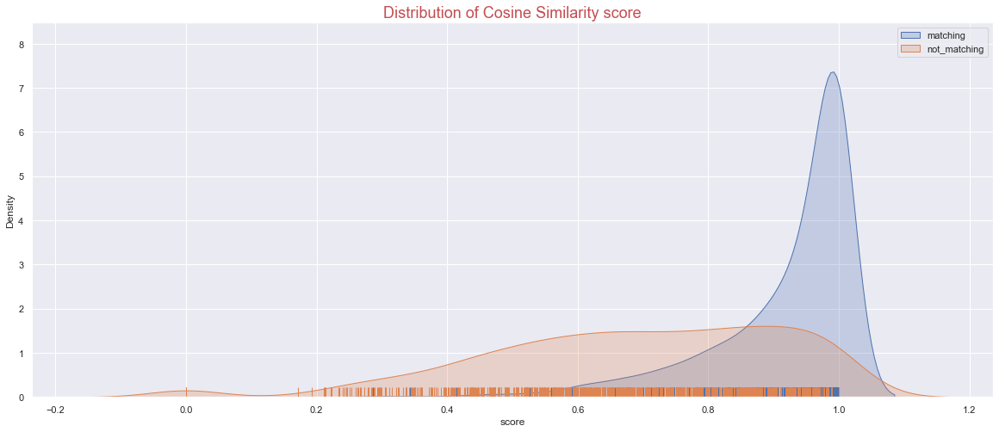

In [73]:
plt.figure(figsize=(20, 8))
sb.distplot(df_match.score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_not.score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.title('Distribution of Cosine Similarity score', fontsize = 18, color = 'r');

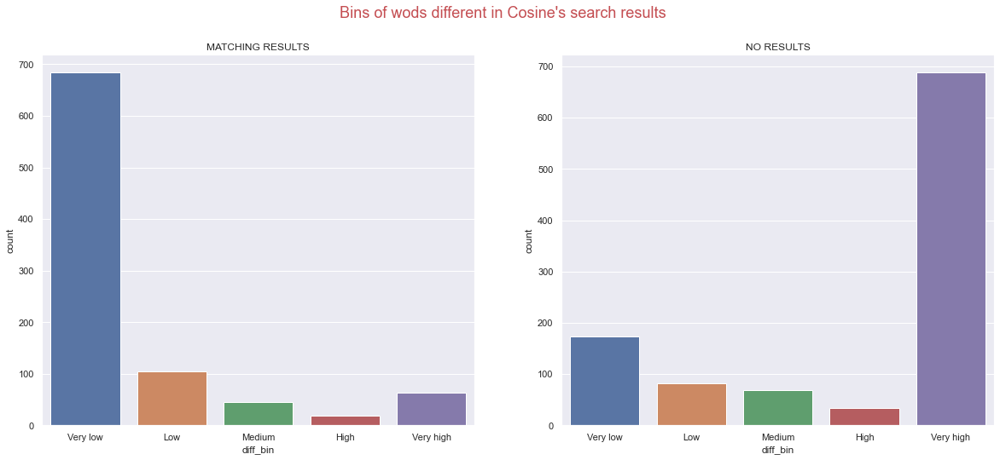

In [40]:
plt.figure(figsize=(20, 8))
plt.subplot(121)
sb.countplot(df_match['diff_bin'])
plt.title('MATCHING RESULTS')
plt.subplot(122)
sb.countplot(df_not['diff_bin'])
plt.title('NO RESULTS')
plt.suptitle("Bins of wods different in Cosine's search results", fontsize = 18, color = 'r');

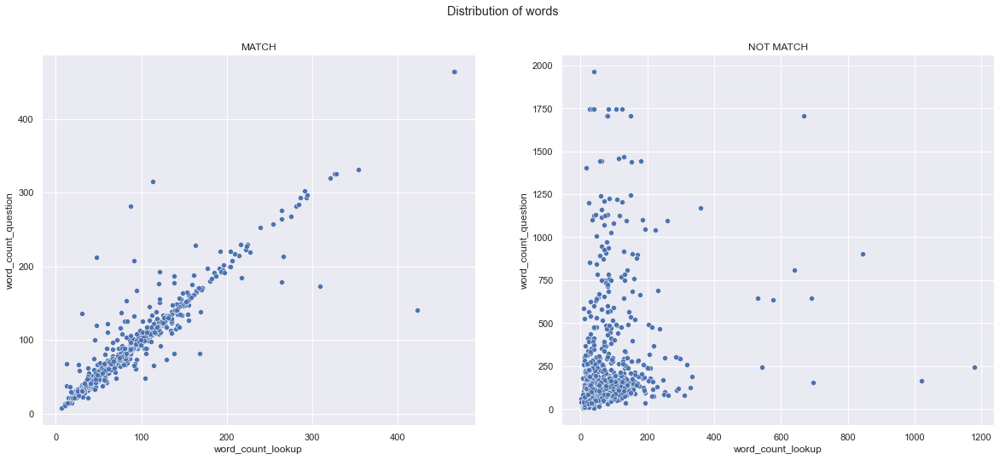

In [41]:
plt.figure(figsize=(20, 8))
plt.subplot(121)
sb.scatterplot(data = df_match, x = df_match['word_count_lookup'], y = df_match['word_count_question'])
plt.title('MATCH')
plt.subplot(122)
sb.scatterplot(data = df_not, x = df_not['word_count_lookup'], y = df_not['word_count_question'])
plt.title('NOT MATCH')
plt.suptitle('Distribution of words');

In [74]:
df_not = df_not.sort_values(by = 'score', ascending = False)

PAIRS: 1 - Cosine score: 1.0000000000000004
-- Number of words: 23


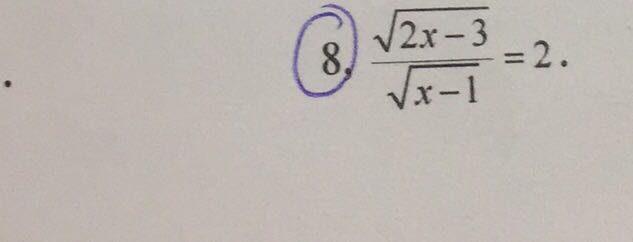

-- Number of words: 18


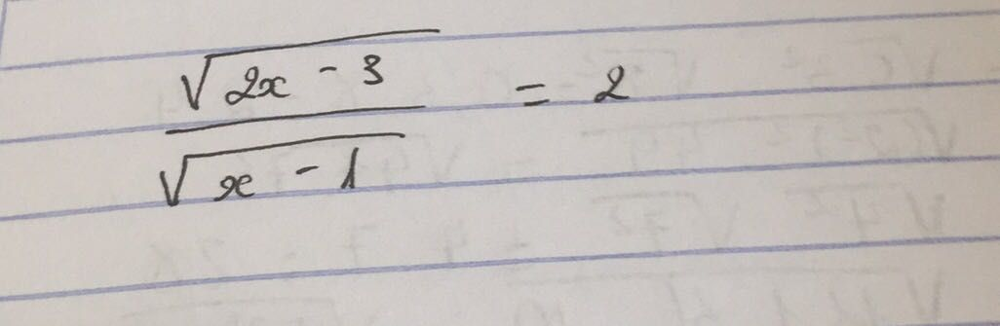

-- Number of words: 18


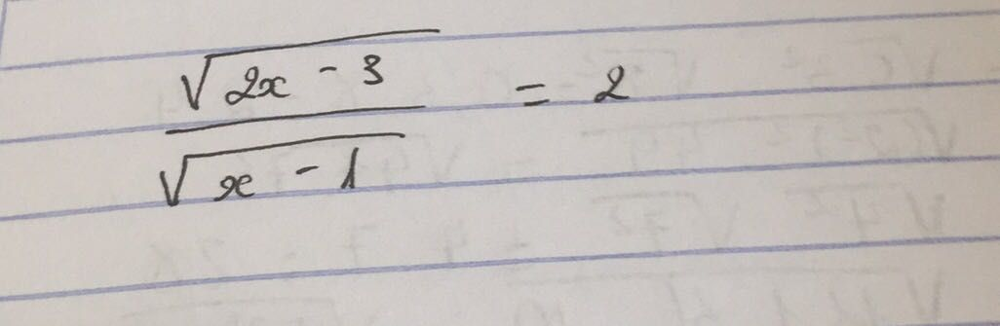

************

PAIRS: 2 - Cosine score: 1.0000000000000004
-- Number of words: 28


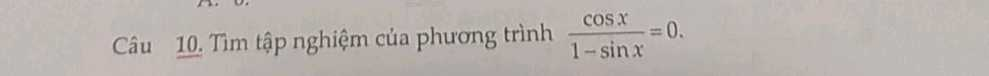

-- Number of words: 28


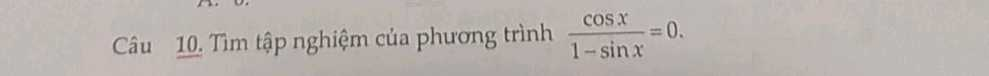

-- Number of words: 28


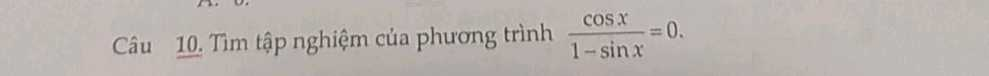

************

PAIRS: 3 - Cosine score: 1.0000000000000002
-- Number of words: 21


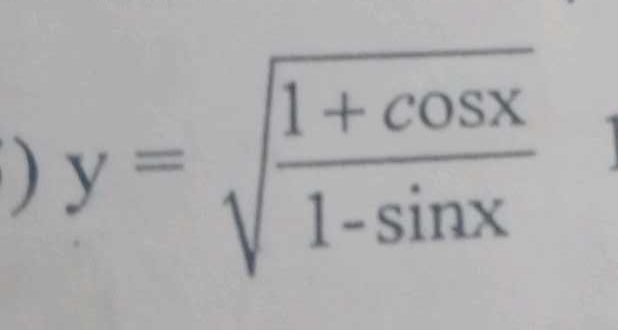

-- Number of words: 103


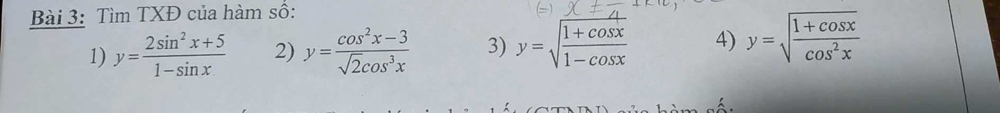

-- Number of words: 21


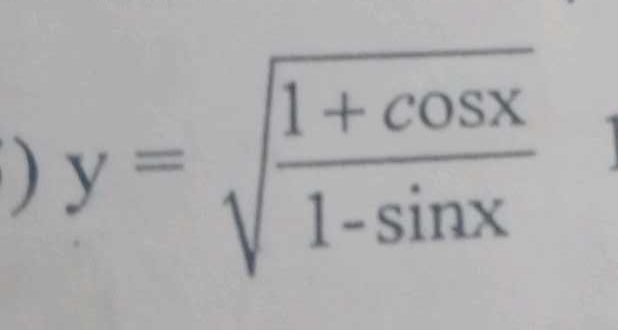

************

PAIRS: 4 - Cosine score: 1.0000000000000002
-- Number of words: 53


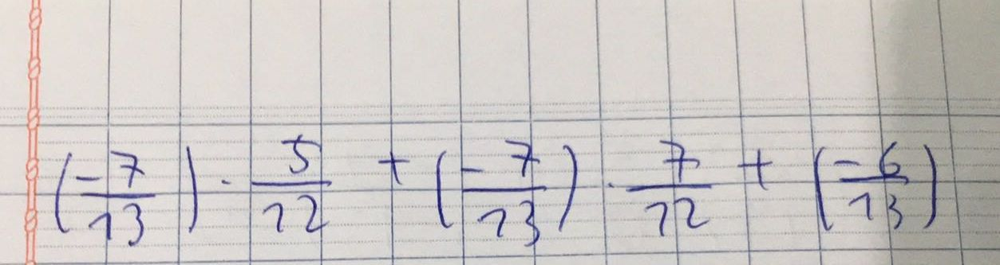

-- Number of words: 297


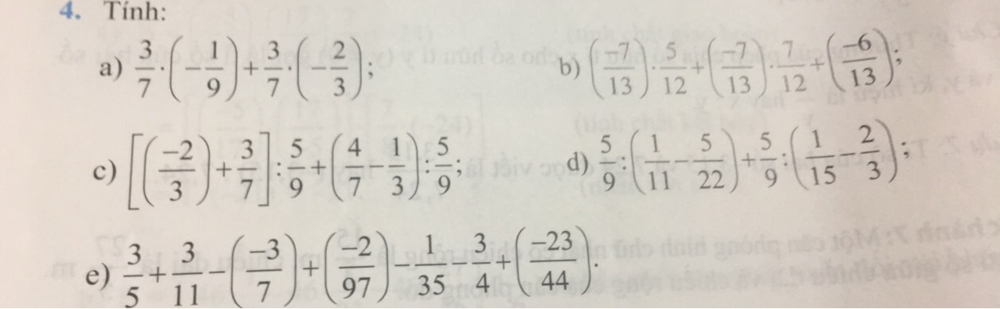

-- Number of words: 53


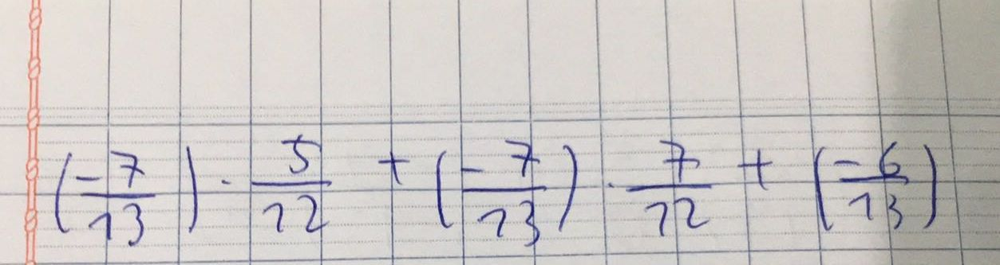

************

PAIRS: 5 - Cosine score: 1.0000000000000002
-- Number of words: 50


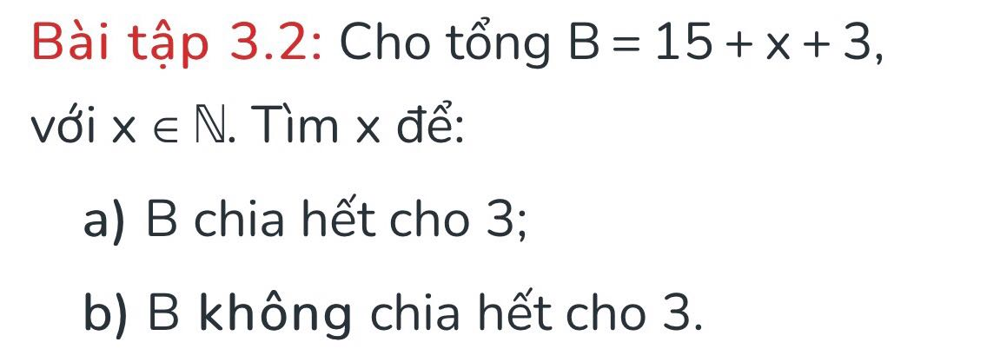

-- Number of words: 54


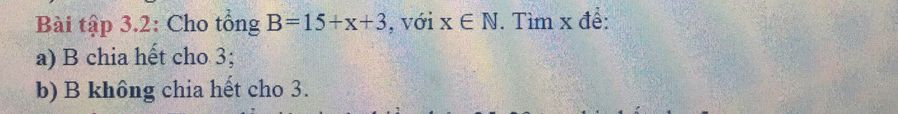

-- Number of words: 54


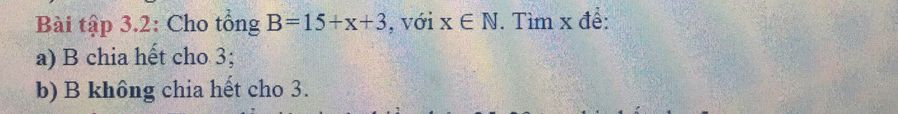

************

PAIRS: 6 - Cosine score: 1.0000000000000002
-- Number of words: 94


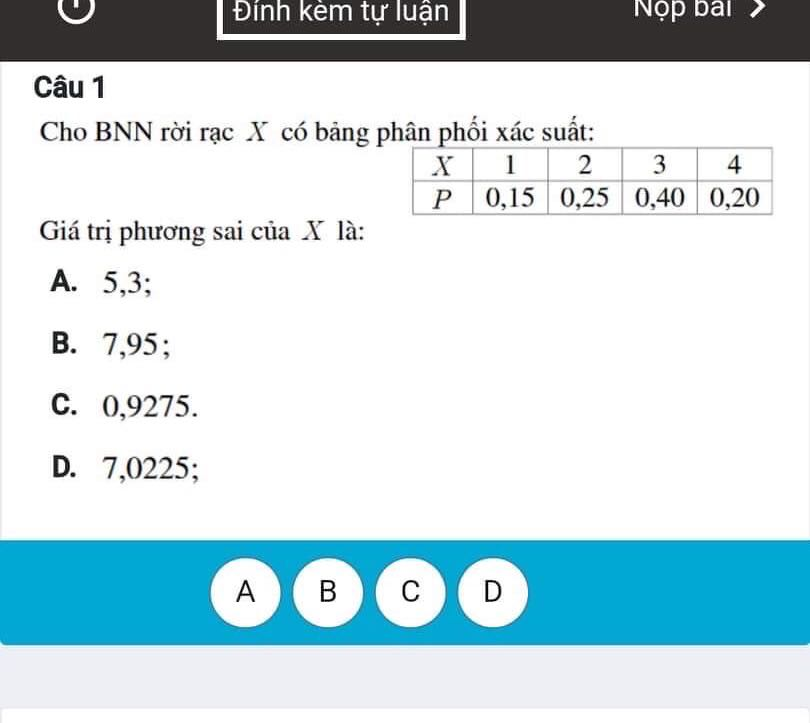

-- Number of words: 141


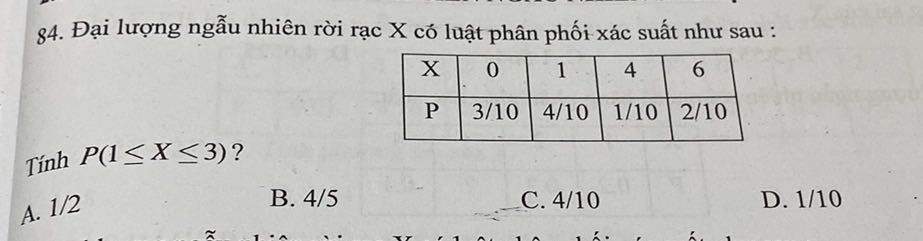

-- Number of words: 94


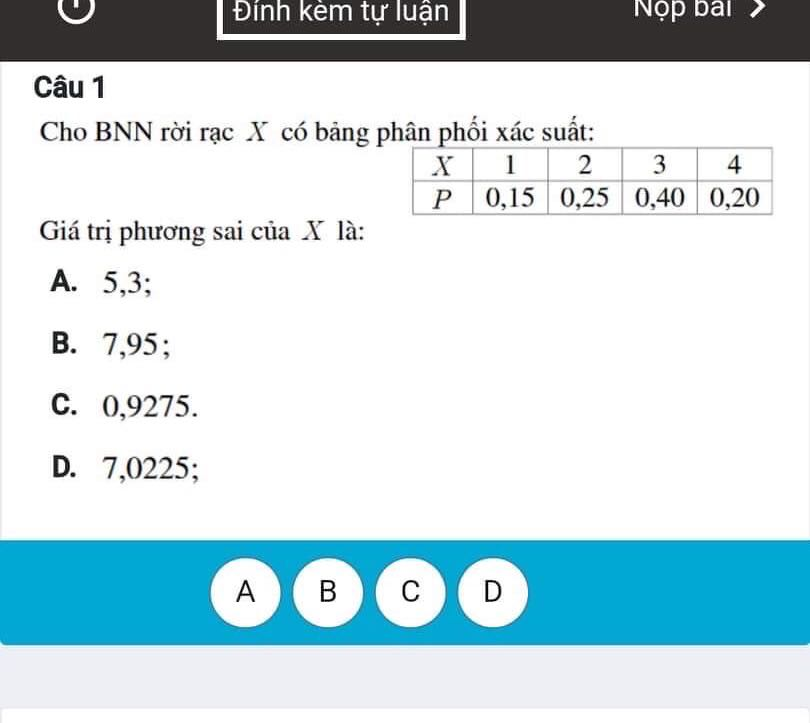

************

PAIRS: 7 - Cosine score: 1.0000000000000002
-- Number of words: 140


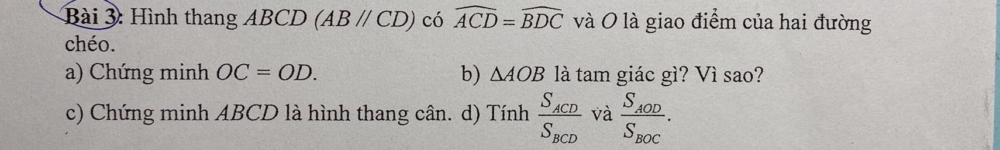

-- Number of words: 140


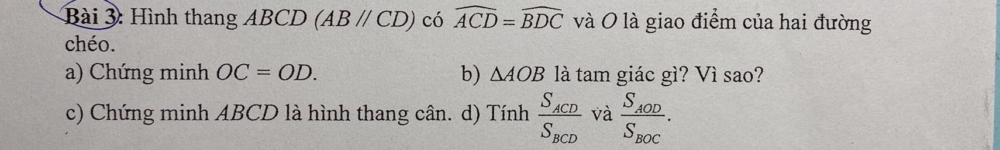

-- Number of words: 140


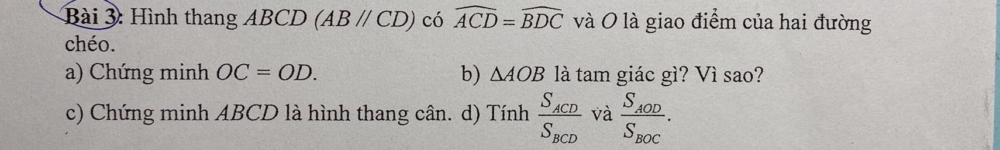

************

PAIRS: 8 - Cosine score: 1.0000000000000002
-- Number of words: 29


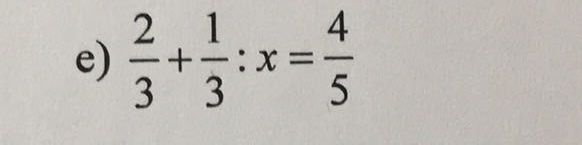

-- Number of words: 125


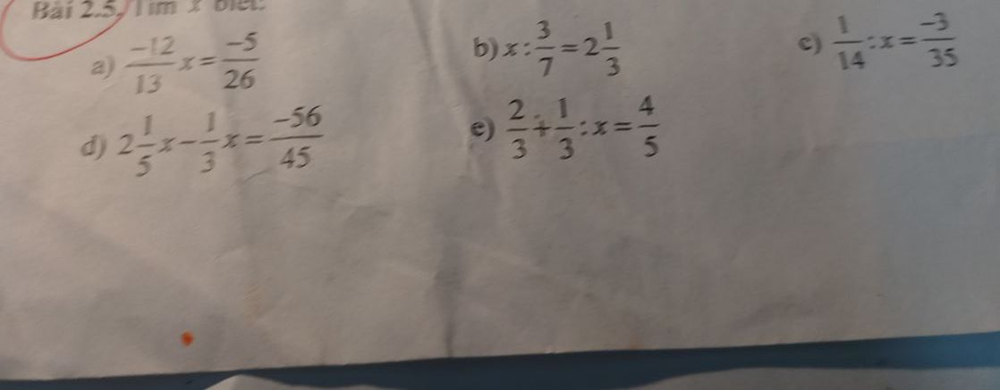

-- Number of words: 26


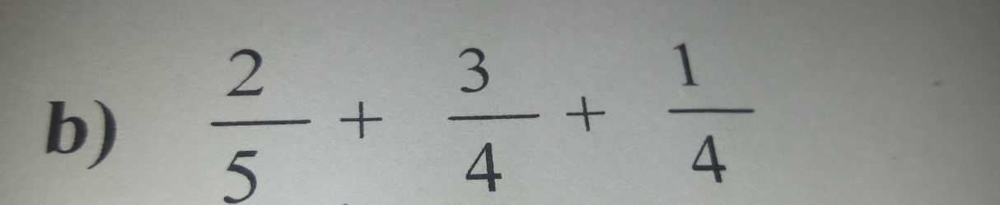

************

PAIRS: 9 - Cosine score: 1.0000000000000002
-- Number of words: 53


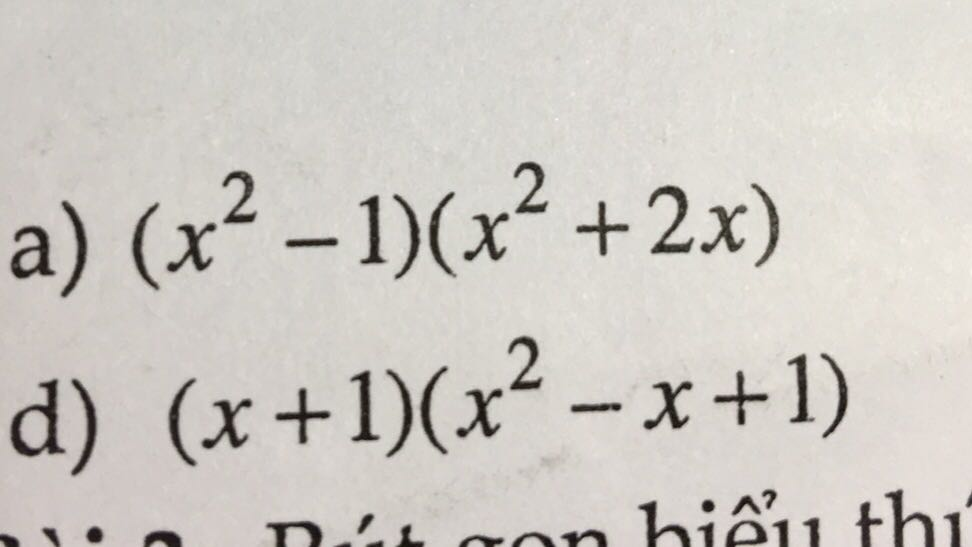

-- Number of words: 112


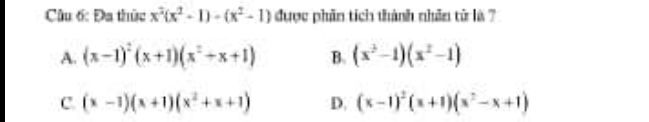

-- Number of words: 53


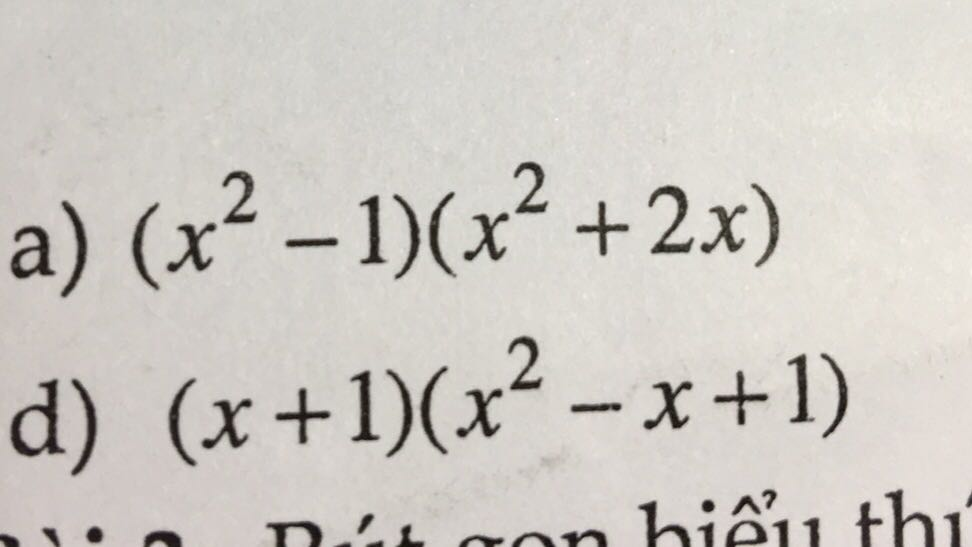

************

PAIRS: 10 - Cosine score: 1.0000000000000002
-- Number of words: 53


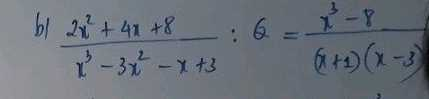

-- Number of words: 106


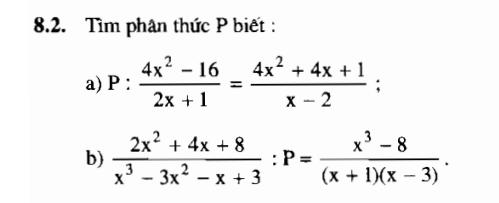

-- Number of words: 21


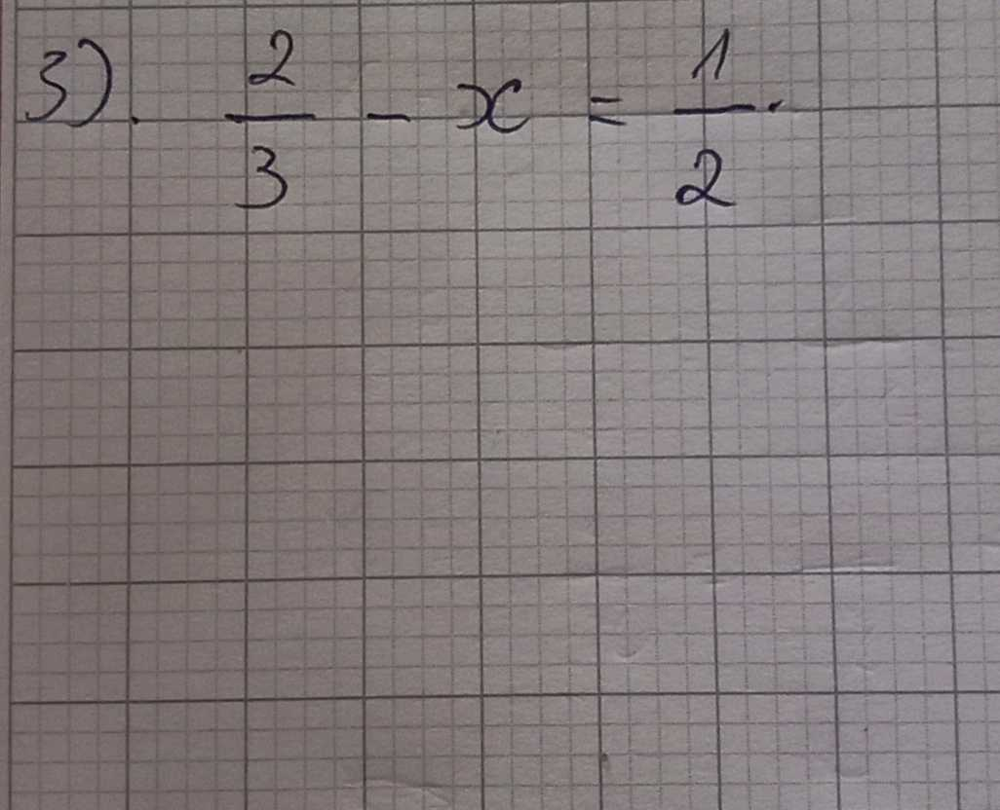

************

PAIRS: 11 - Cosine score: 1.0000000000000002
-- Number of words: 25


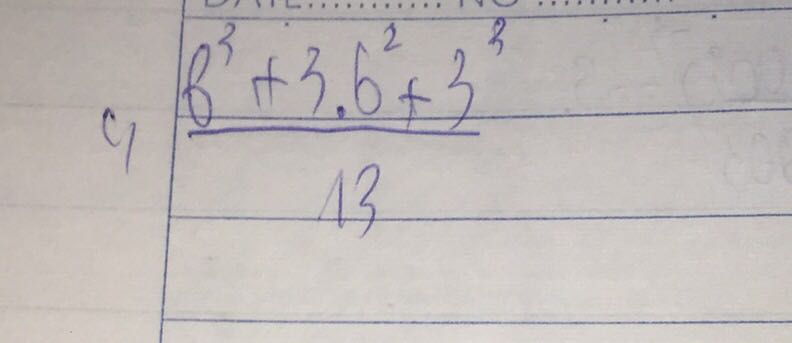

-- Number of words: 108


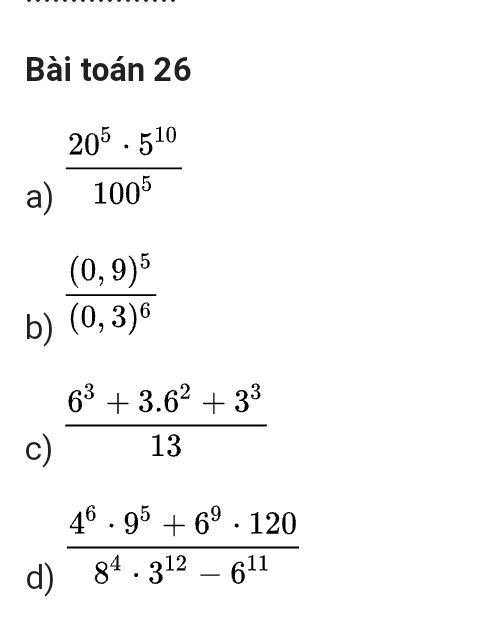

-- Number of words: 25


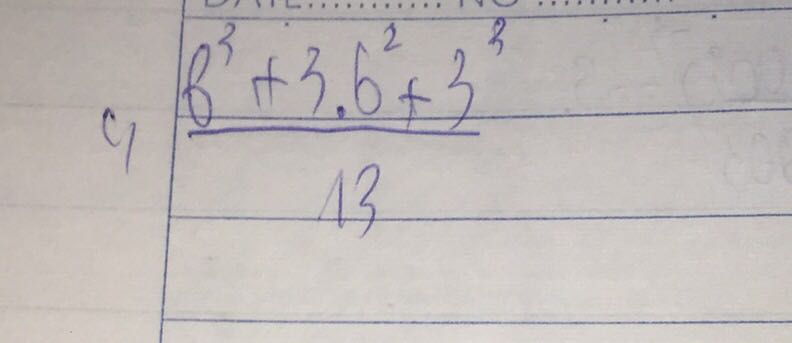

************

PAIRS: 12 - Cosine score: 1.0000000000000002
-- Number of words: 85


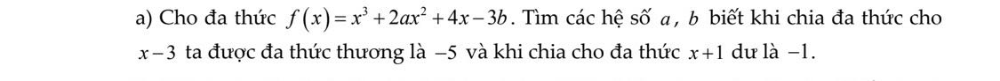

-- Number of words: 85


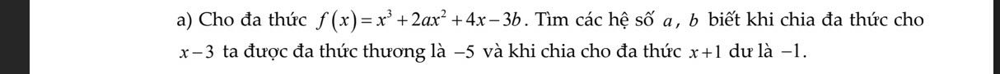

-- Number of words: 85


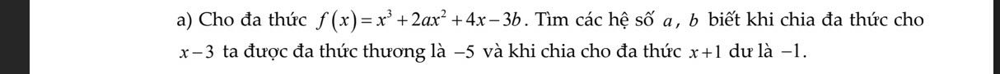

************

PAIRS: 13 - Cosine score: 1.0000000000000002
-- Number of words: 44


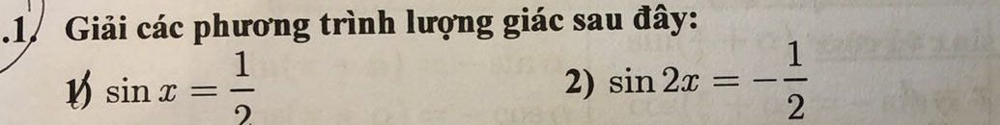

-- Number of words: 138


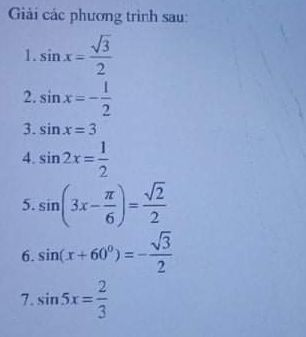

-- Number of words: 44


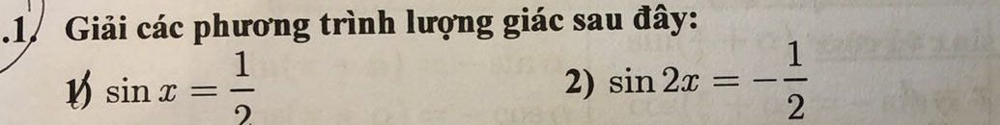

************

PAIRS: 14 - Cosine score: 1.0000000000000002
-- Number of words: 32


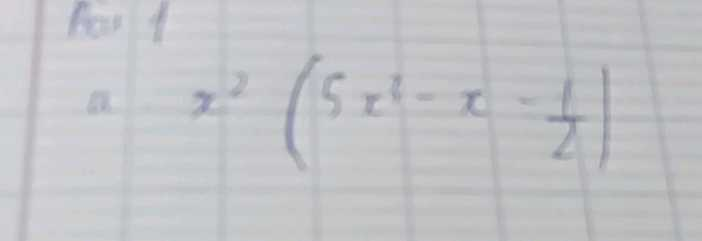

-- Number of words: 32


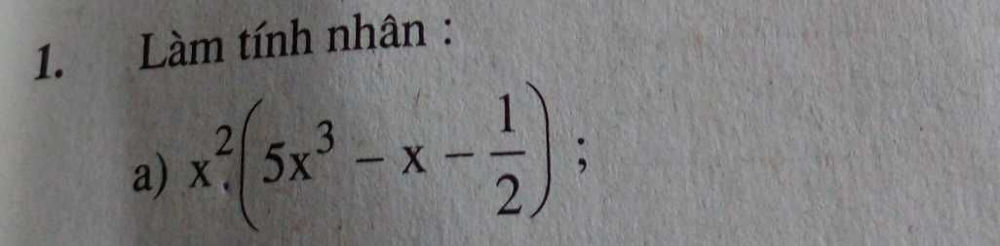

-- Number of words: 21


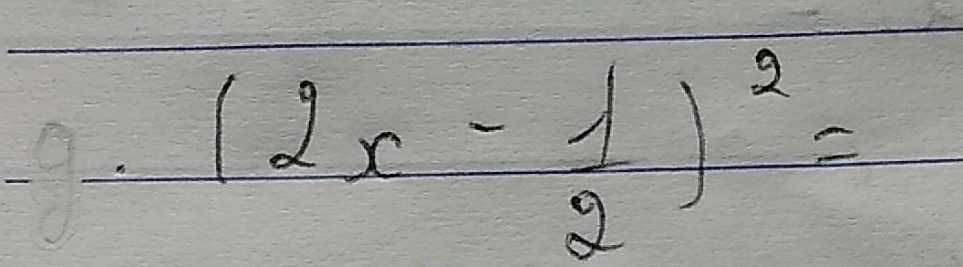

************

PAIRS: 15 - Cosine score: 1.0000000000000002
-- Number of words: 53


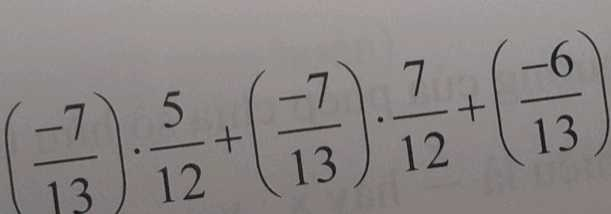

-- Number of words: 53


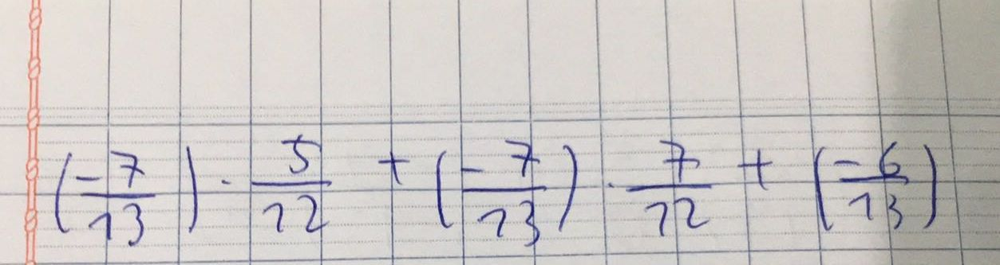

-- Number of words: 53


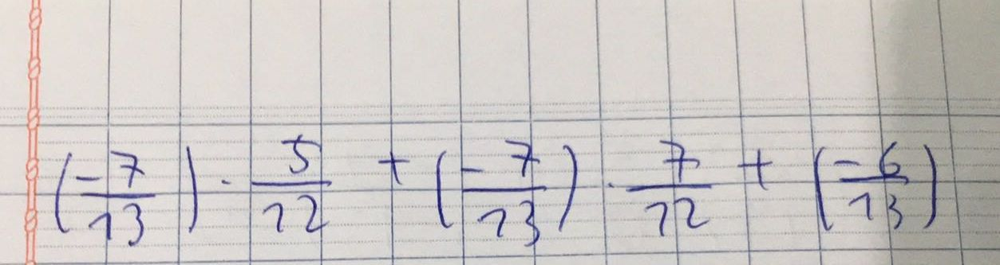

************

PAIRS: 16 - Cosine score: 1.0000000000000002
-- Number of words: 79


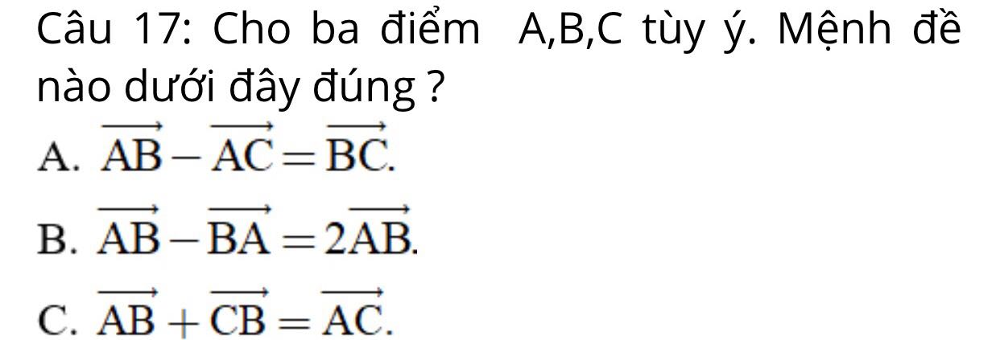

-- Number of words: 79


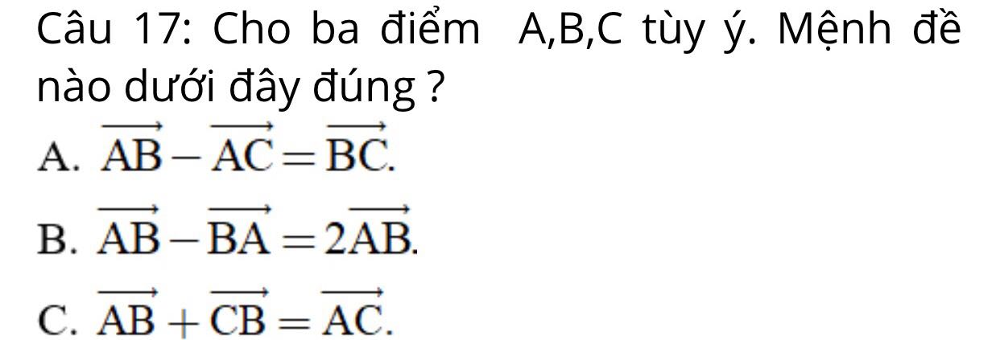

-- Number of words: 79


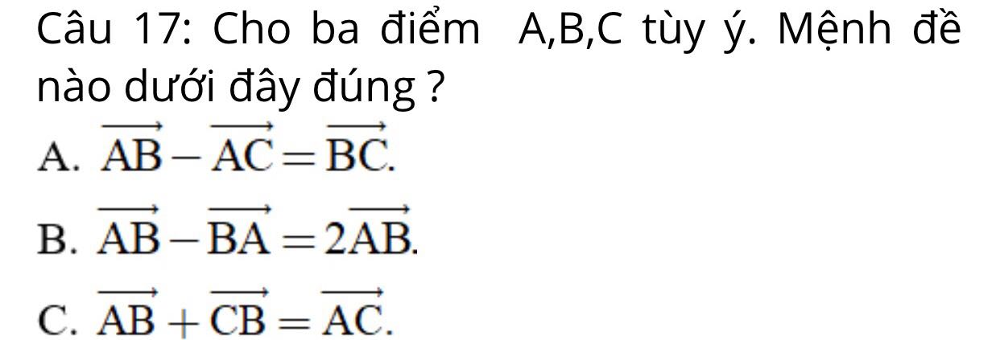

************

PAIRS: 17 - Cosine score: 1.0000000000000002
-- Number of words: 154


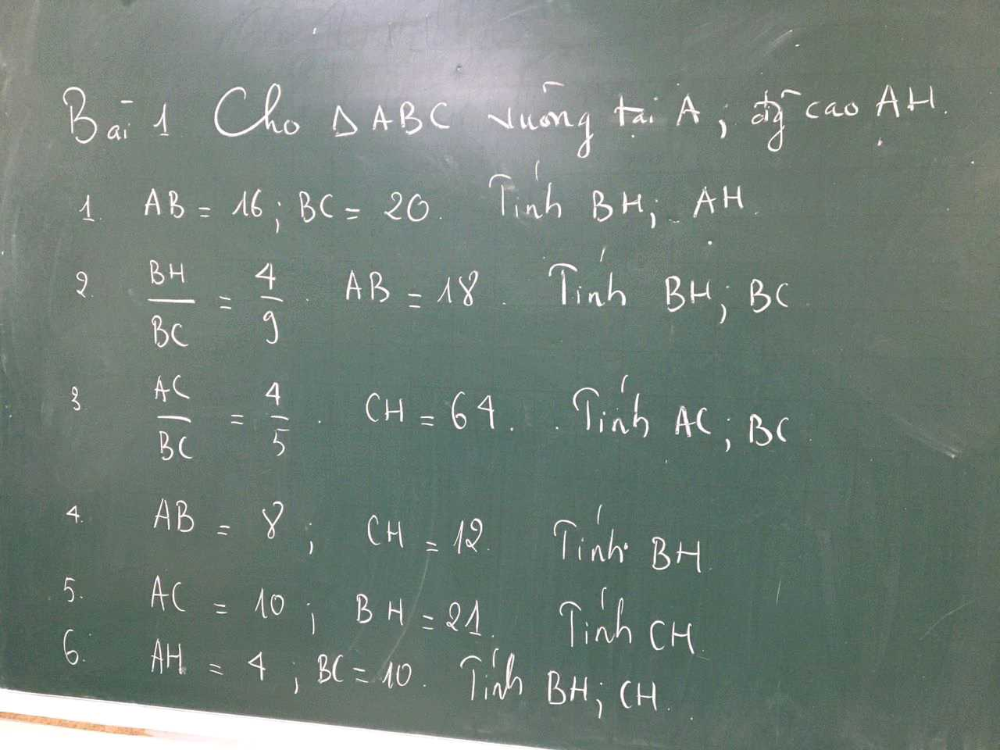

-- Number of words: 142


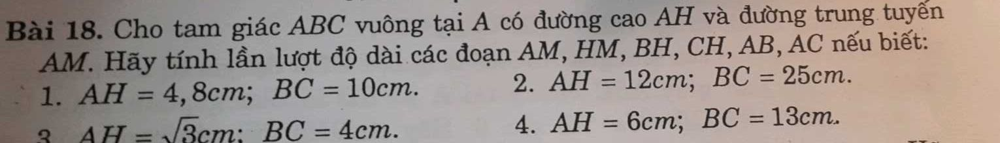

-- Number of words: 154


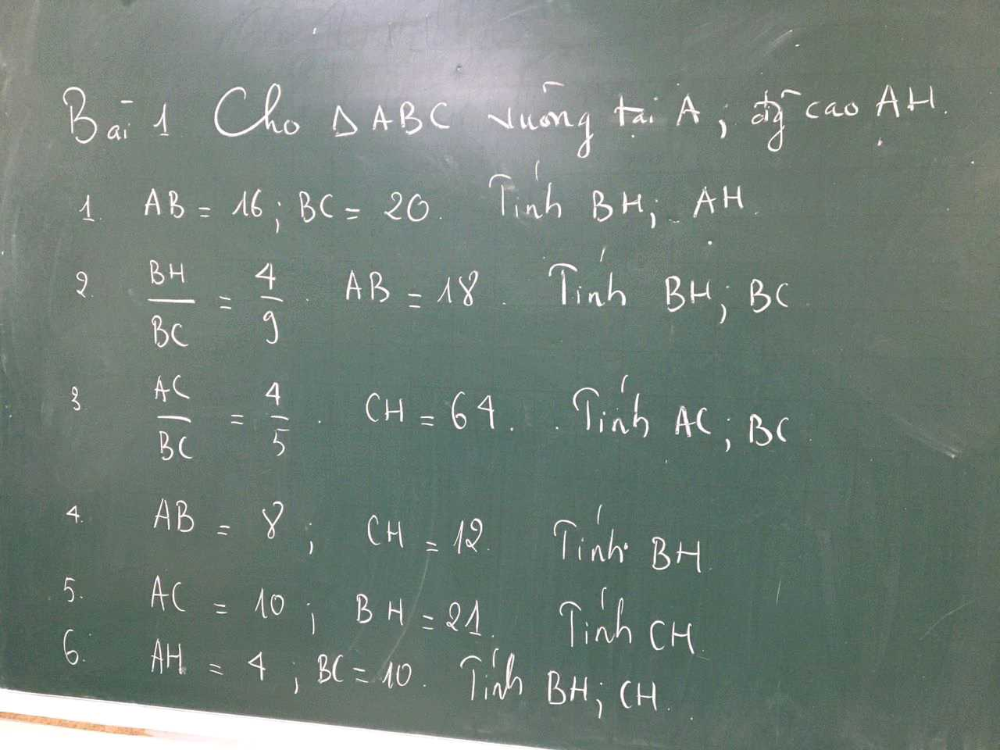

************

PAIRS: 18 - Cosine score: 1.0000000000000002
-- Number of words: 19


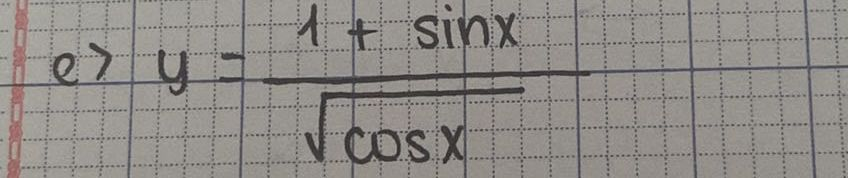

-- Number of words: 94


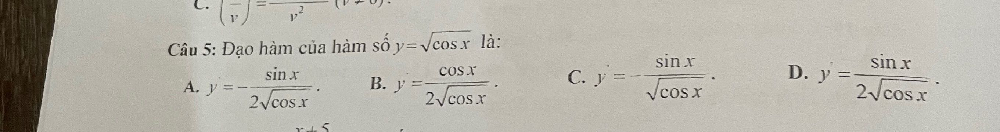

-- Number of words: 21


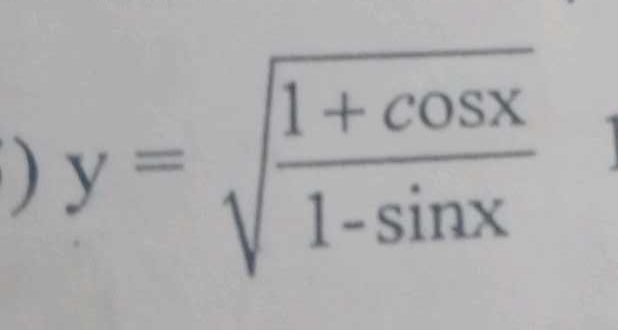

************

PAIRS: 19 - Cosine score: 1.0000000000000002
-- Number of words: 20


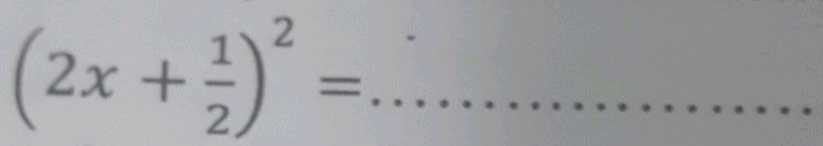

-- Number of words: 21


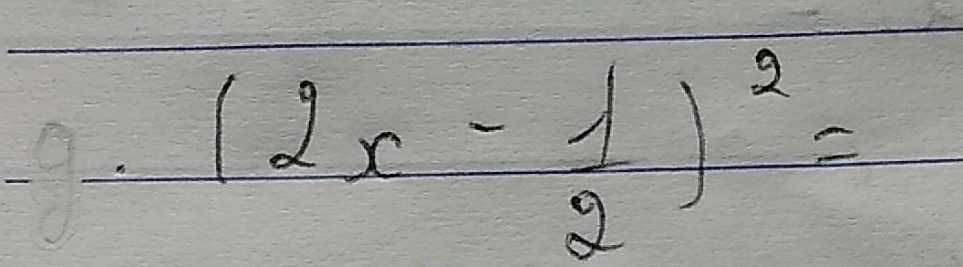

-- Number of words: 21


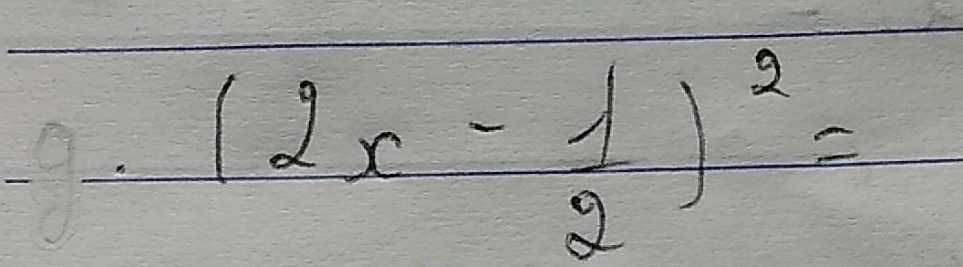

************

PAIRS: 20 - Cosine score: 1.0000000000000002
-- Number of words: 36


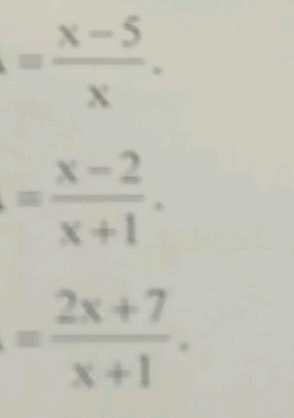

-- Number of words: 82


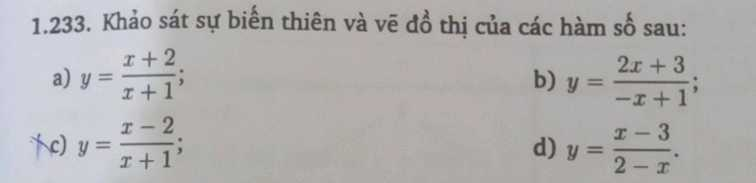

-- Number of words: 26


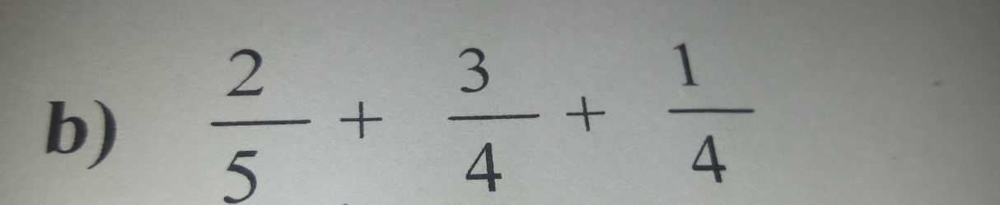

************

PAIRS: 21 - Cosine score: 1.0000000000000002
-- Number of words: 59


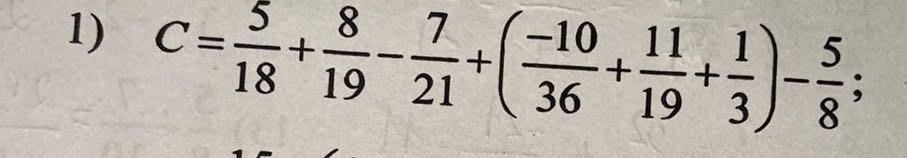

-- Number of words: 59


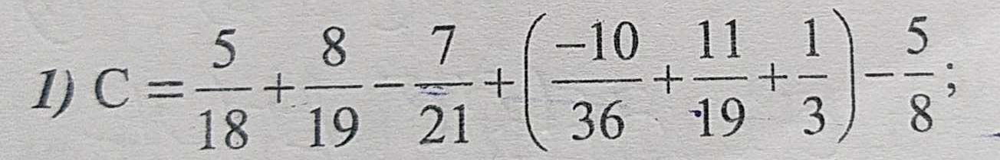

-- Number of words: 59


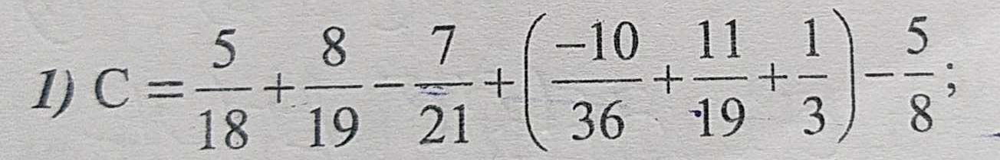

************

PAIRS: 22 - Cosine score: 1.0000000000000002
-- Number of words: 16


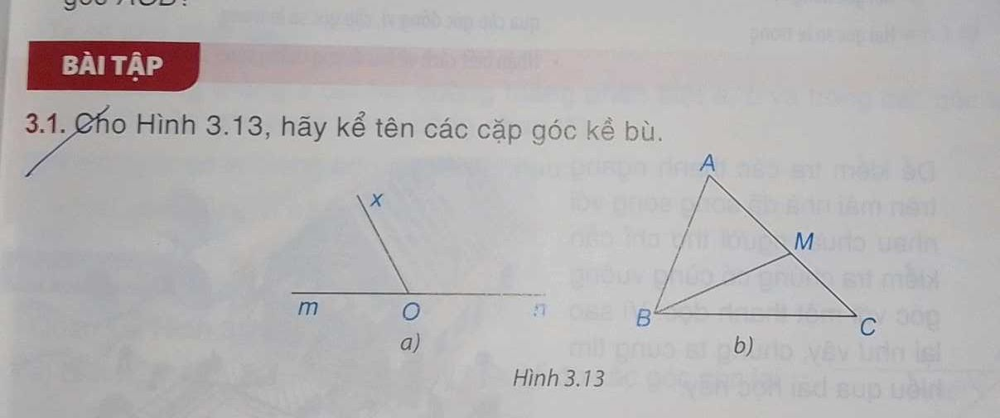

-- Number of words: 22


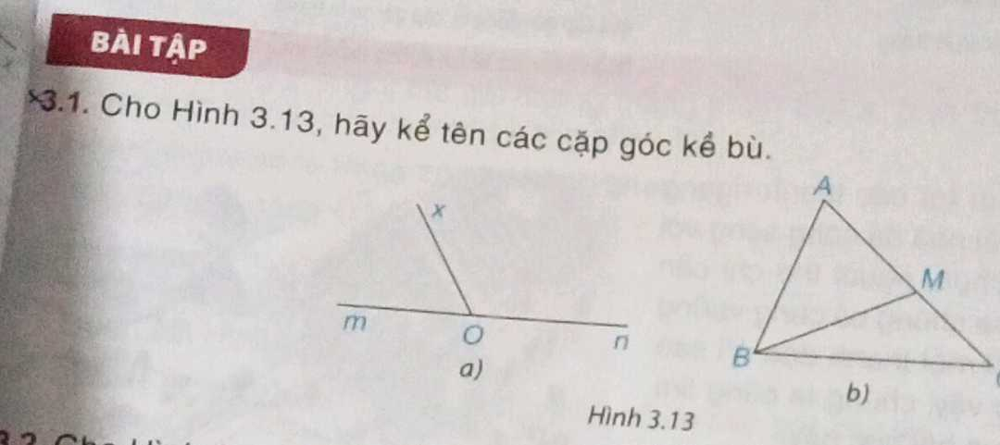

-- Number of words: 15


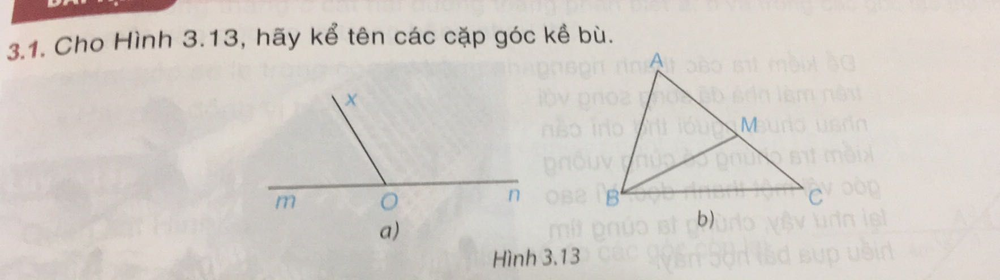

************

PAIRS: 23 - Cosine score: 1.0
-- Number of words: 75


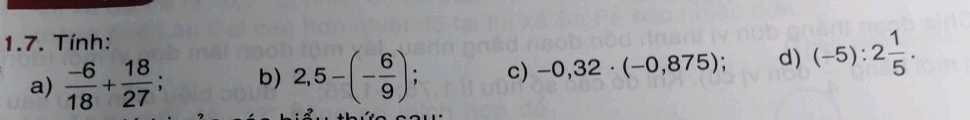

-- Number of words: 74


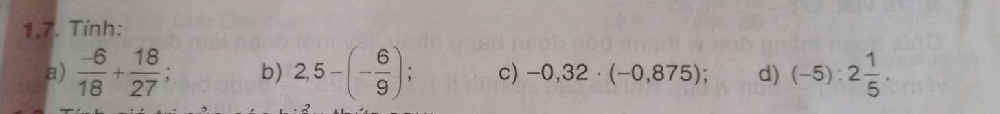

-- Number of words: 74


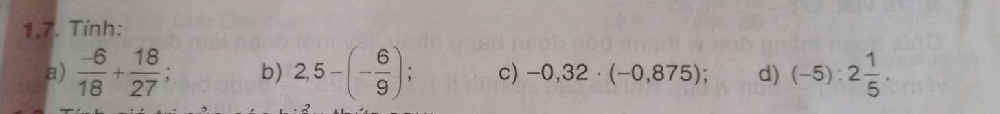

************

PAIRS: 24 - Cosine score: 1.0
-- Number of words: 34


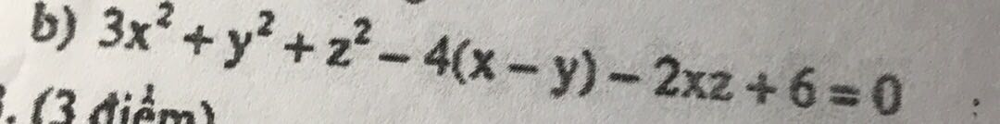

-- Number of words: 119


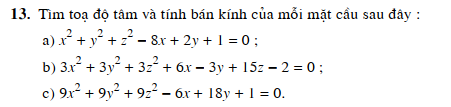

-- Number of words: 26


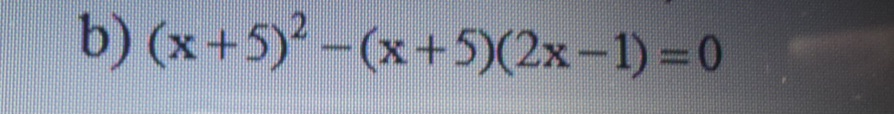

************

PAIRS: 25 - Cosine score: 1.0
-- Number of words: 16


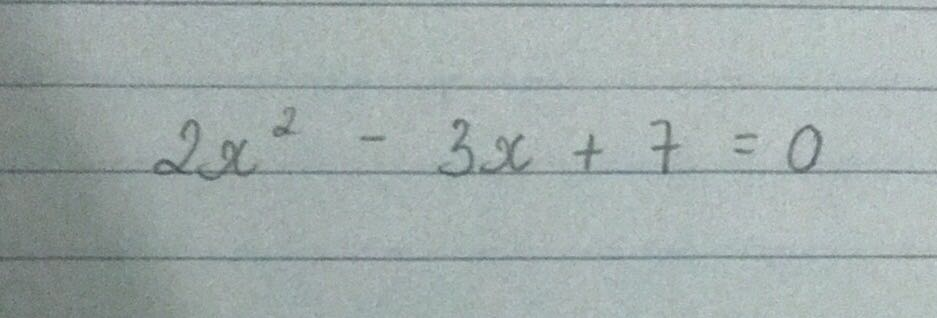

-- Number of words: 20


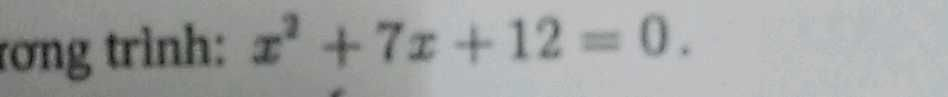

-- Number of words: 26


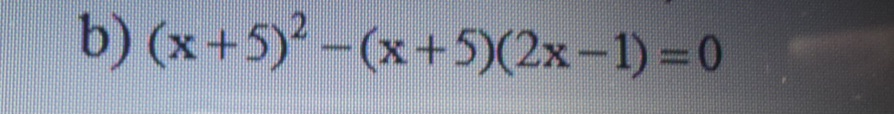

************

PAIRS: 26 - Cosine score: 1.0
-- Number of words: 14


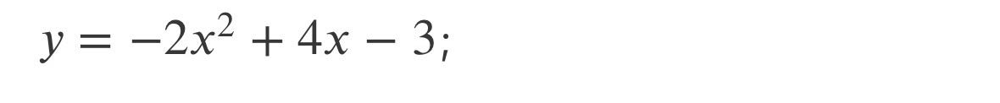

-- Number of words: 22


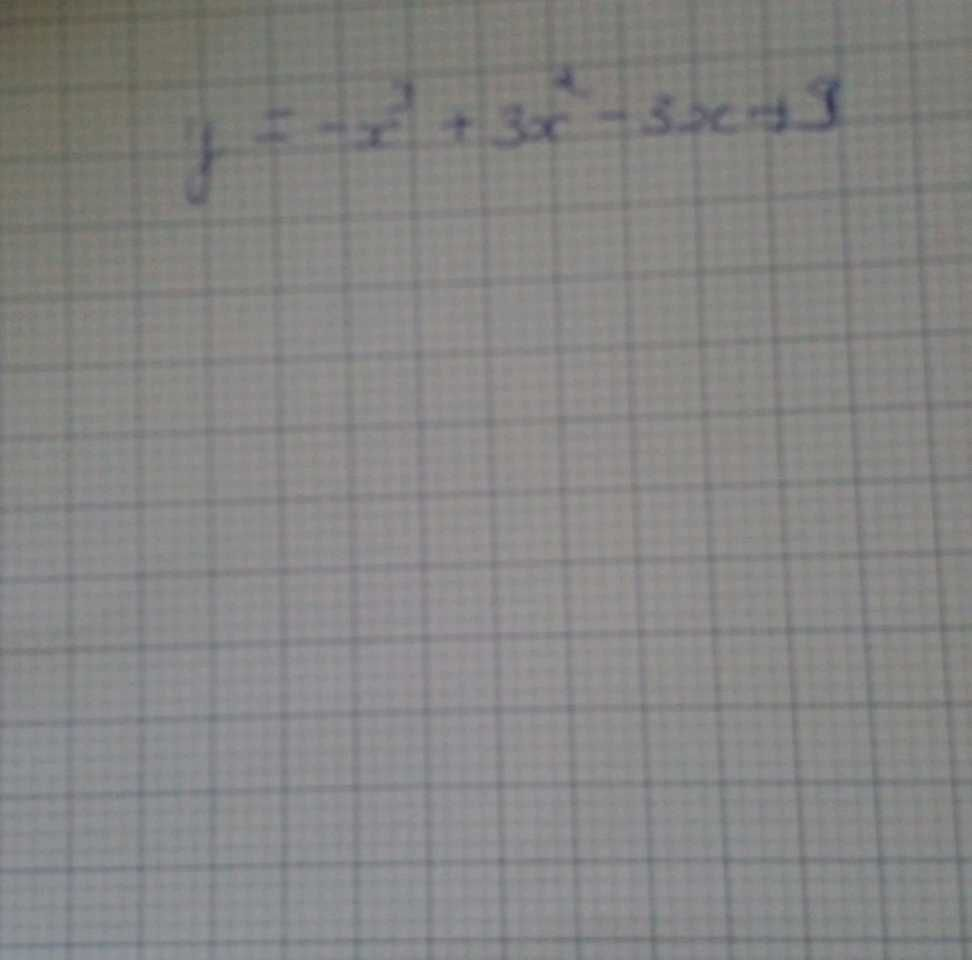

-- Number of words: 22


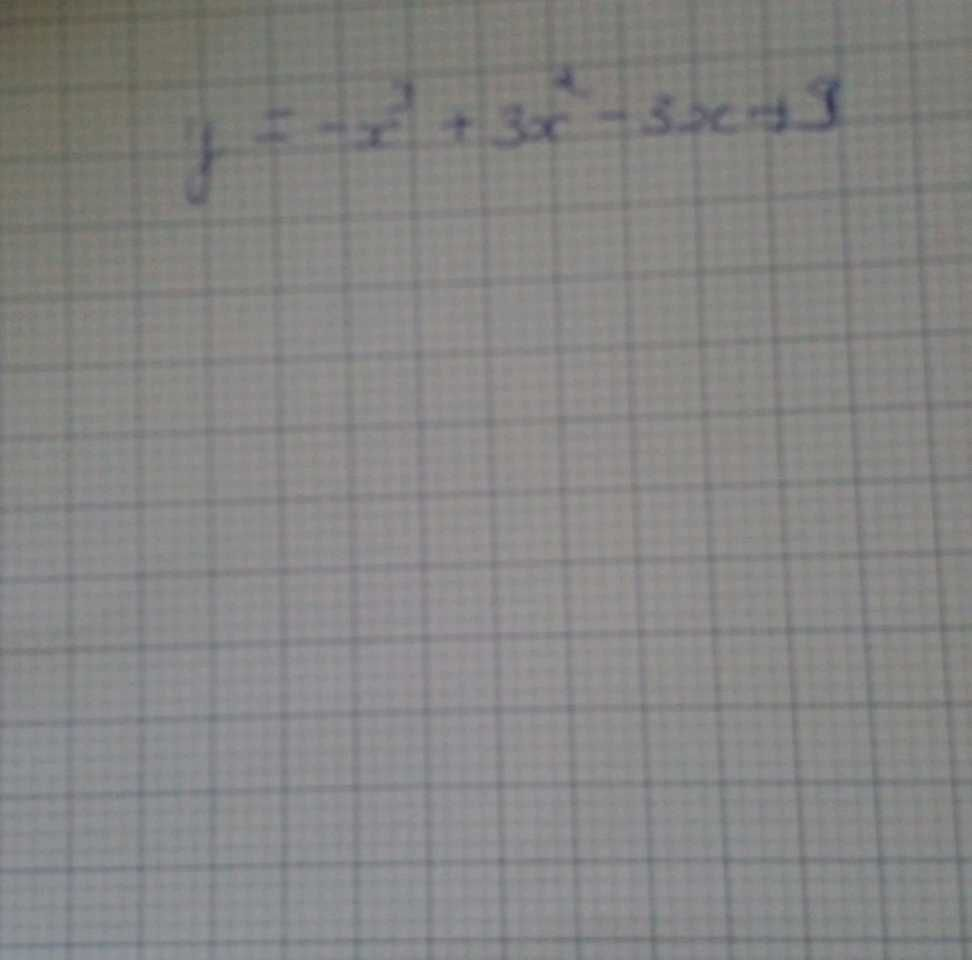

************

PAIRS: 27 - Cosine score: 1.0
-- Number of words: 19


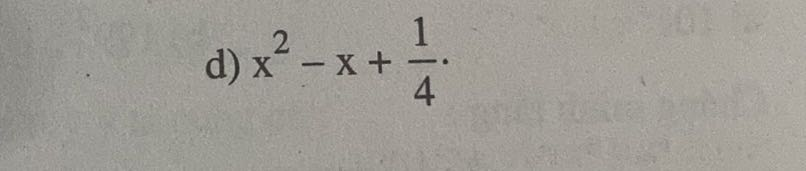

-- Number of words: 19


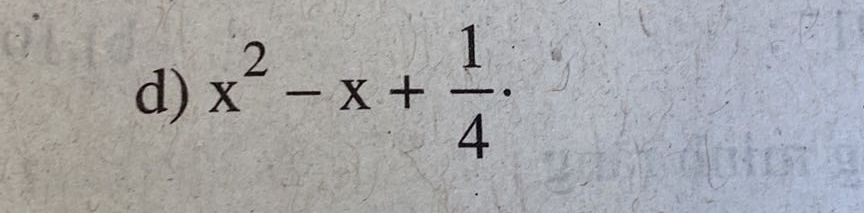

-- Number of words: 22


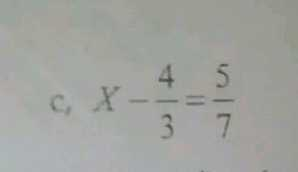

************

PAIRS: 28 - Cosine score: 1.0
-- Number of words: 47


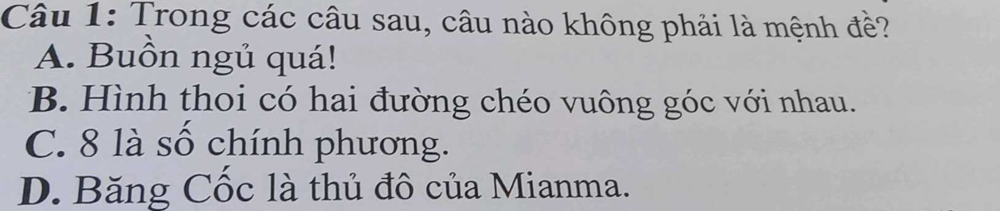

-- Number of words: 84


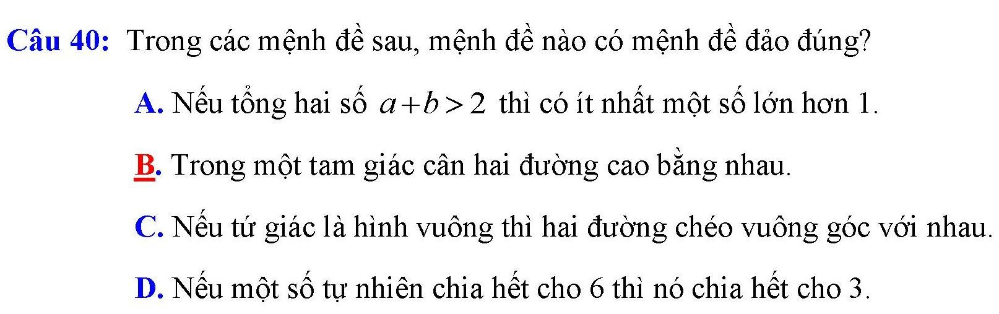

-- Number of words: 47


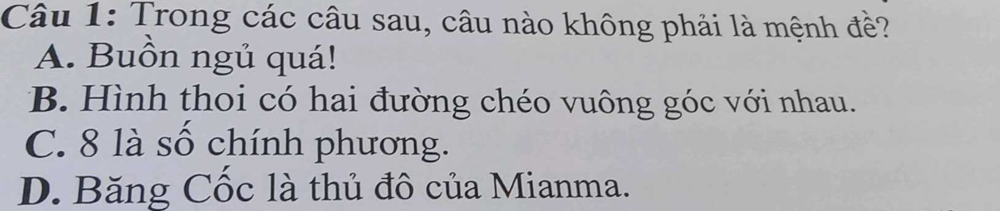

************

PAIRS: 29 - Cosine score: 1.0
-- Number of words: 13


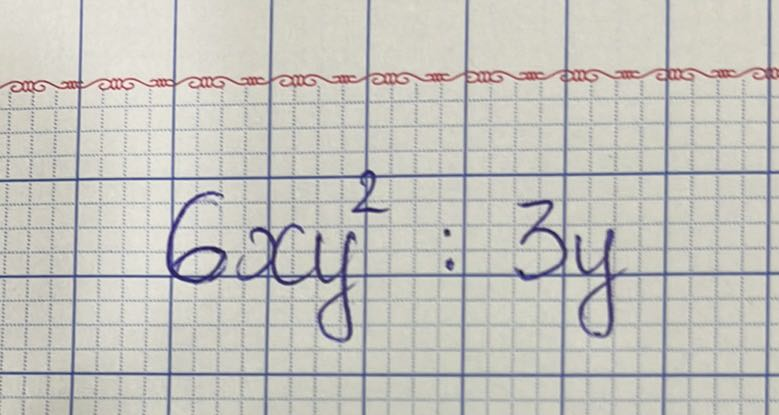

-- Number of words: 126


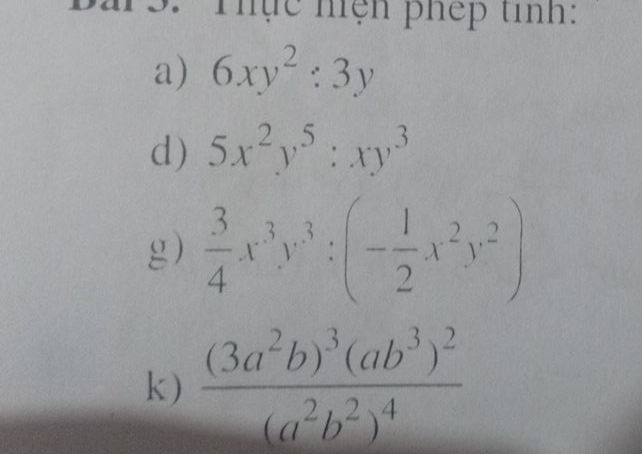

-- Number of words: 22


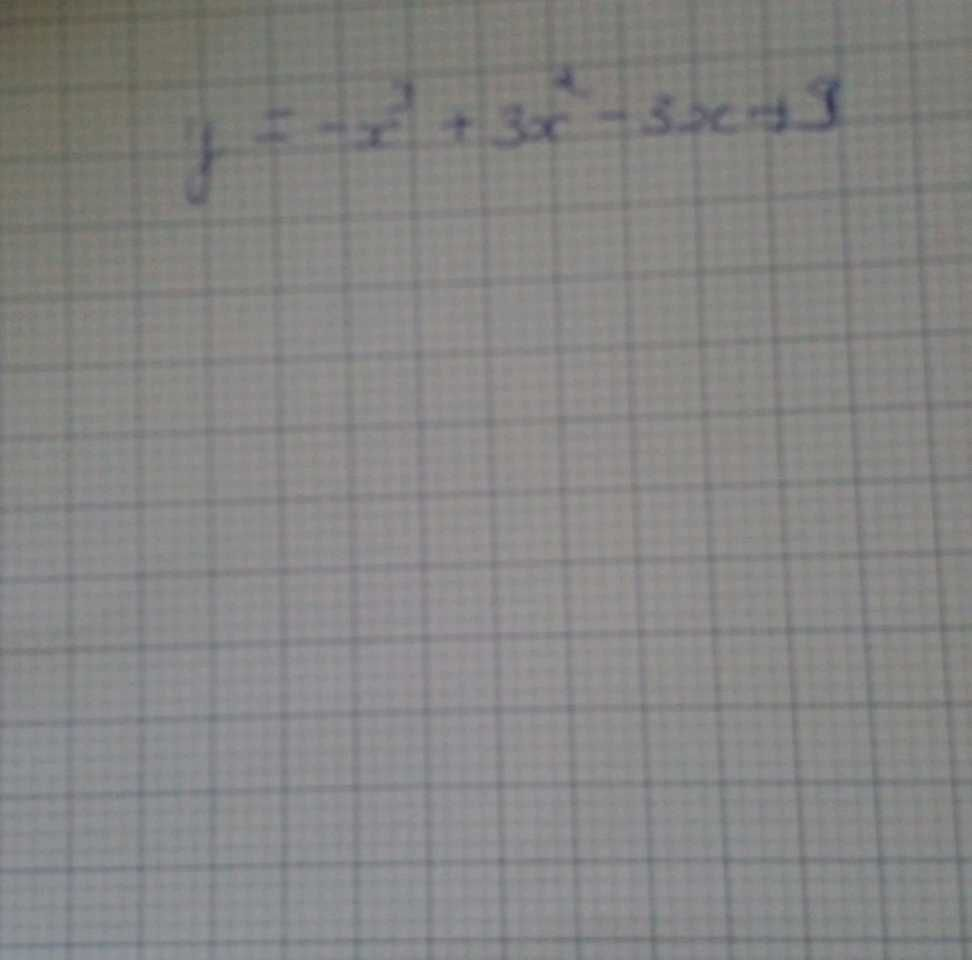

************

PAIRS: 30 - Cosine score: 1.0
-- Number of words: 25


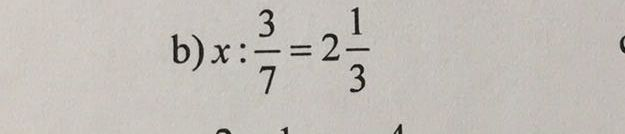

-- Number of words: 125


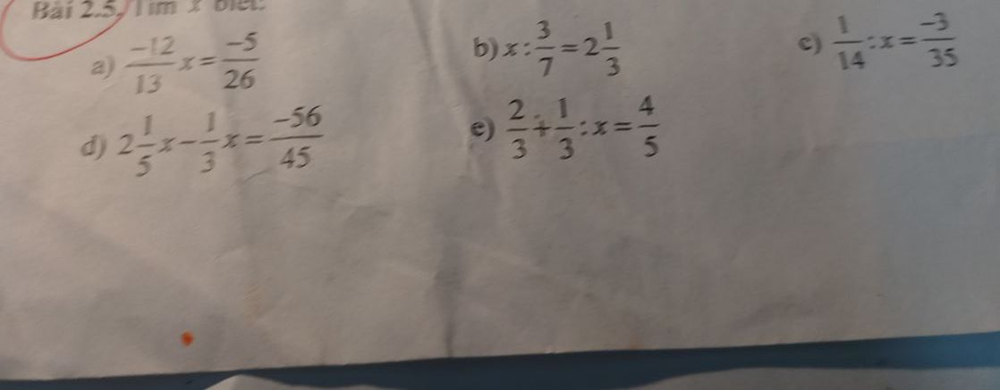

-- Number of words: 22


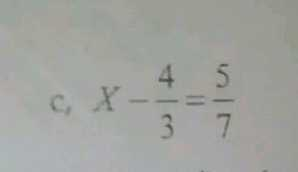

************

PAIRS: 31 - Cosine score: 1.0
-- Number of words: 34


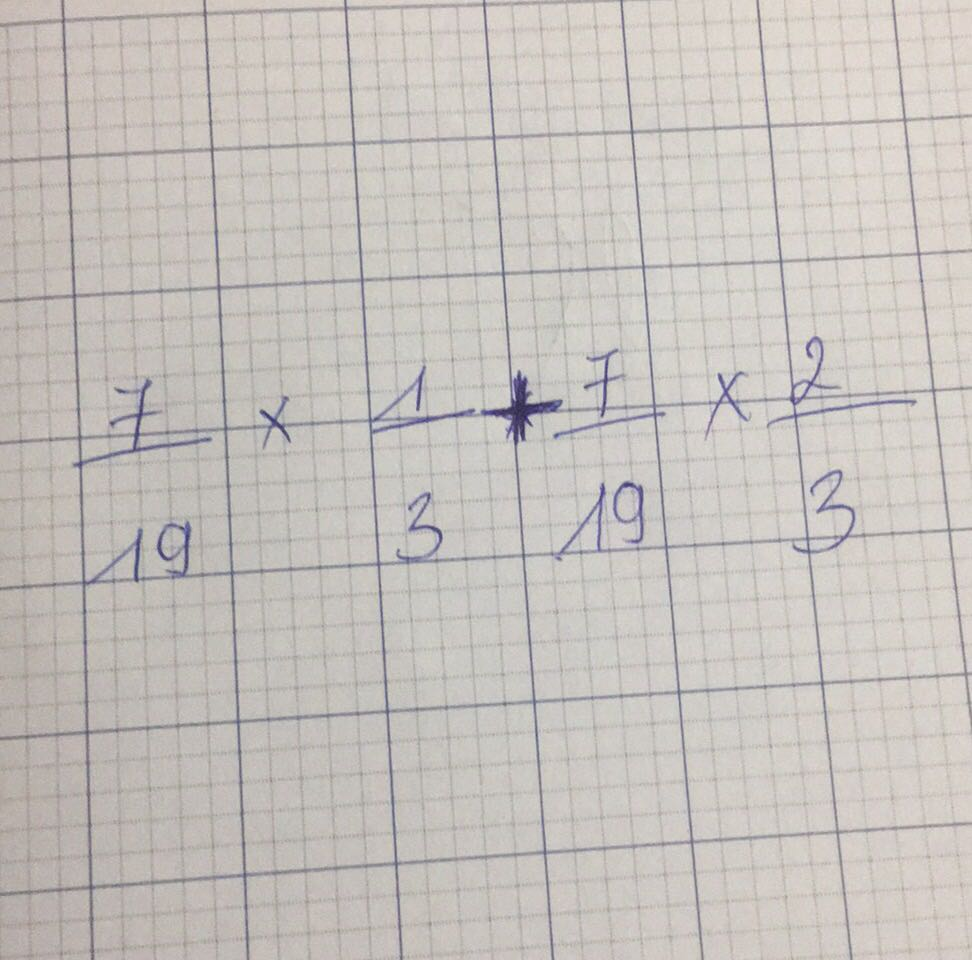

-- Number of words: 34


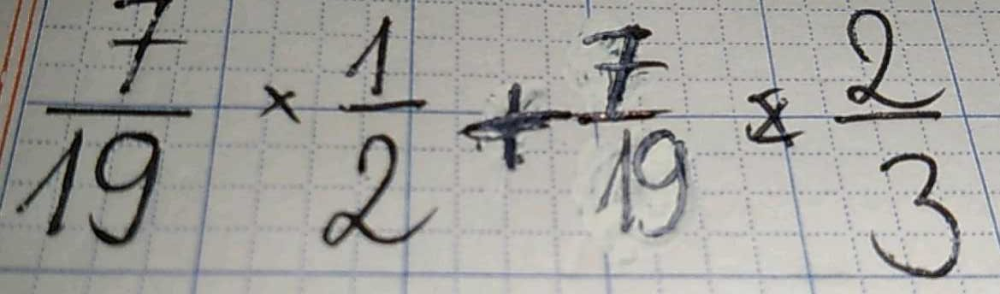

-- Number of words: 34


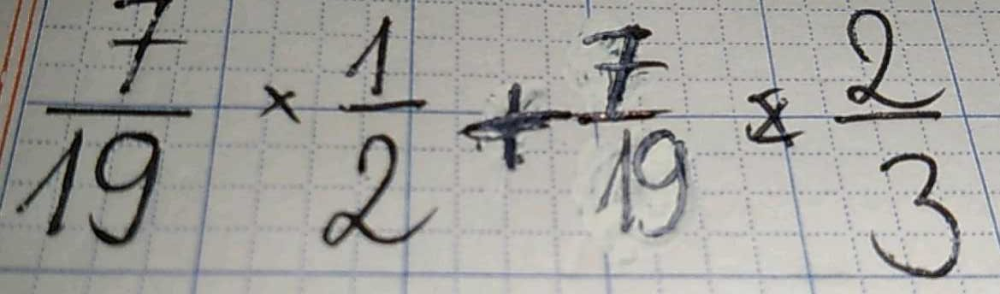

************

PAIRS: 32 - Cosine score: 1.0
-- Number of words: 41


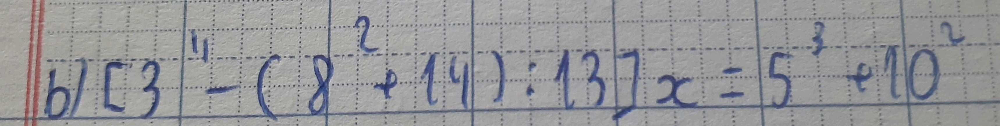

-- Number of words: 41


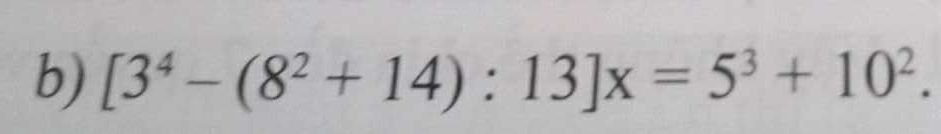

-- Number of words: 41


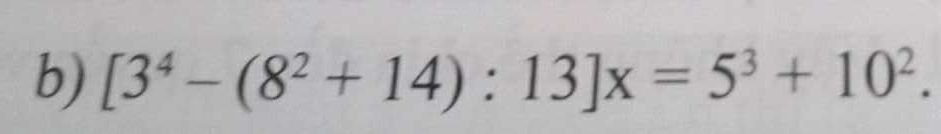

************

PAIRS: 33 - Cosine score: 1.0
-- Number of words: 109


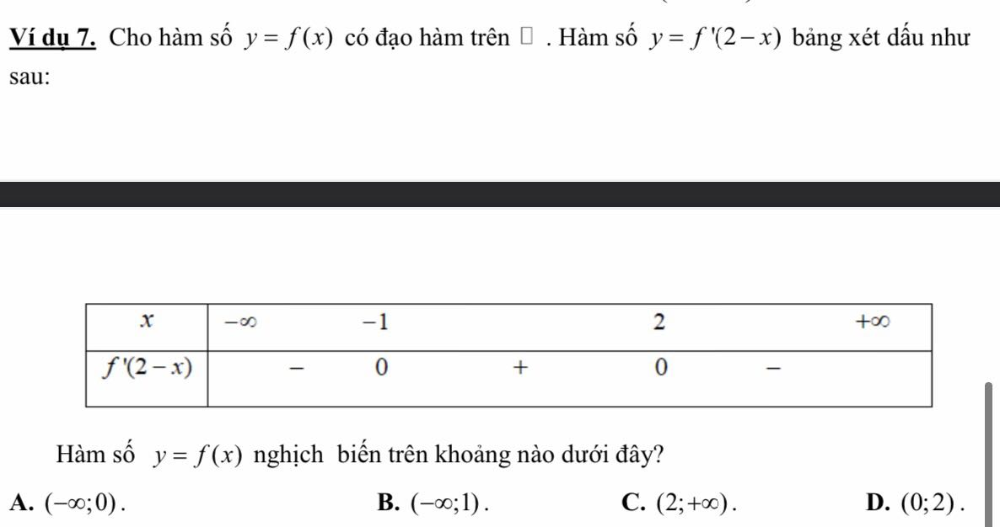

-- Number of words: 488


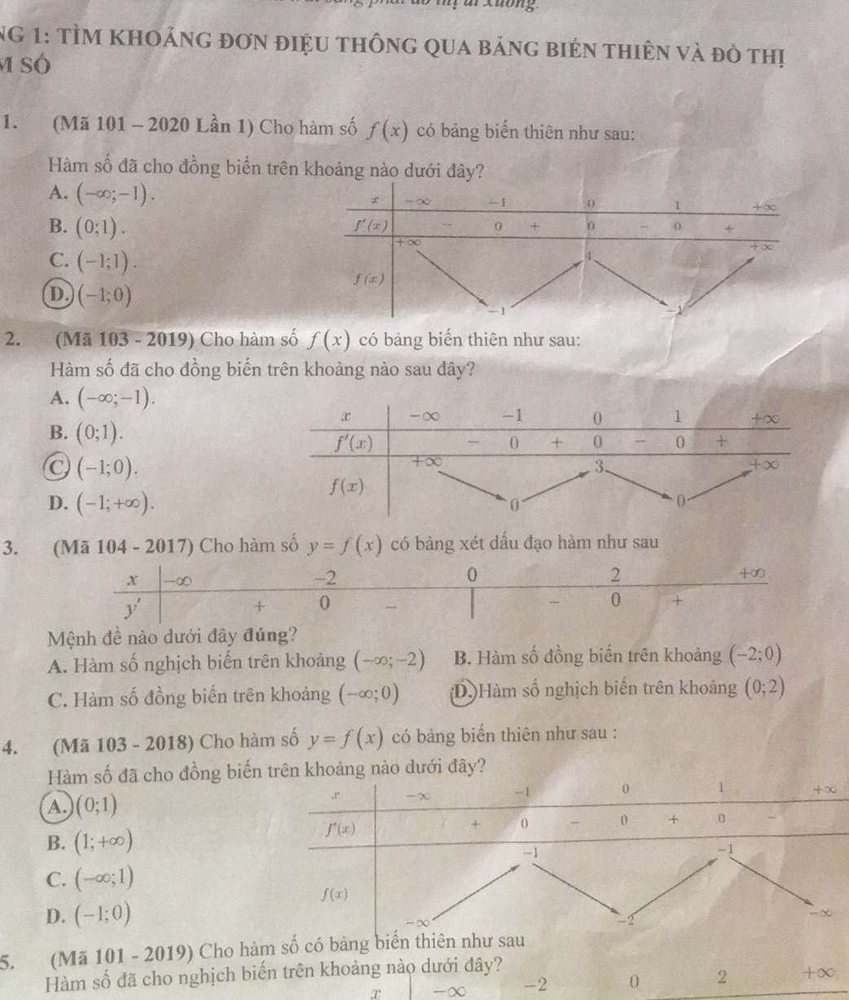

-- Number of words: 109


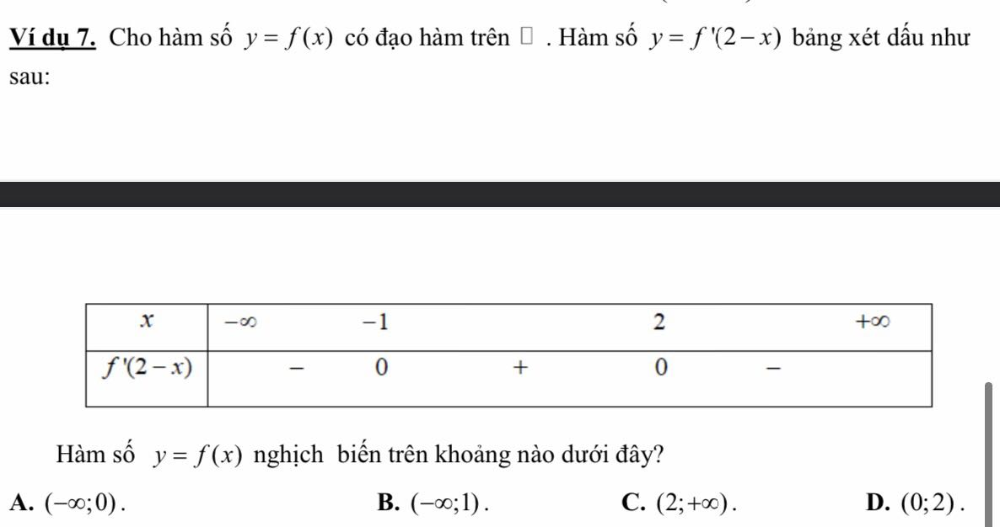

************

PAIRS: 34 - Cosine score: 1.0
-- Number of words: 19


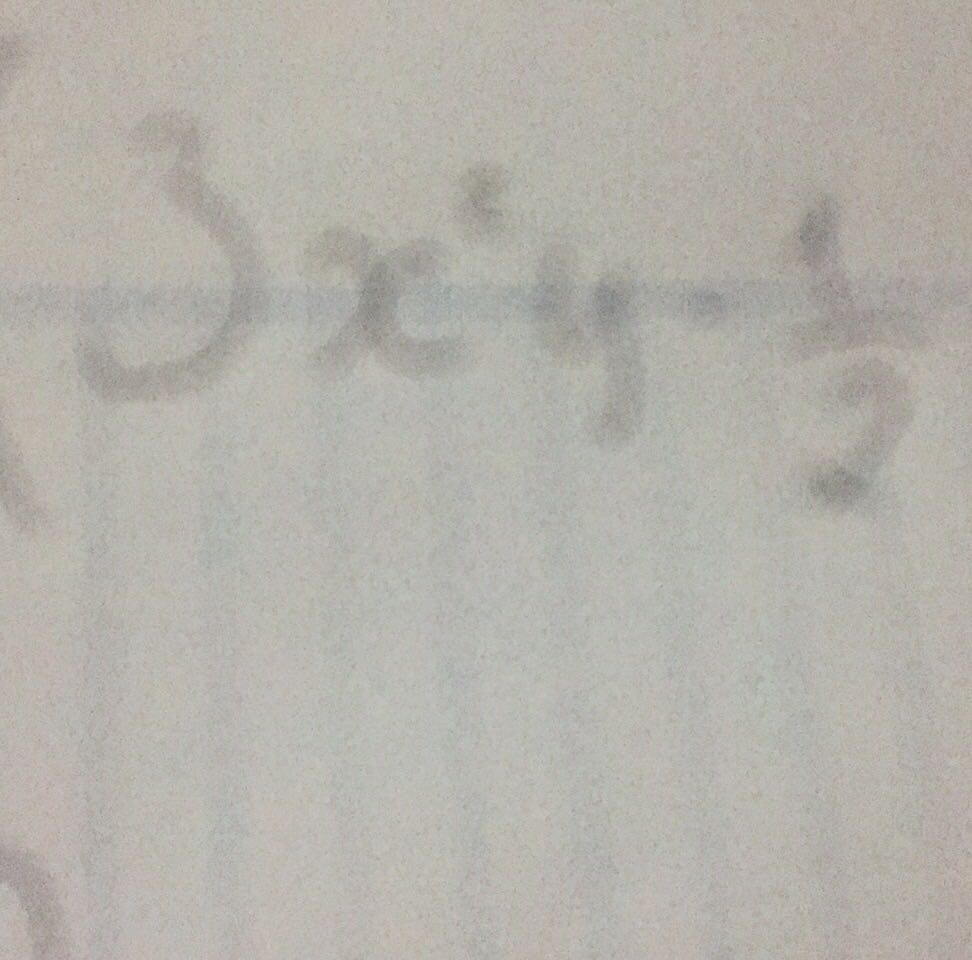

-- Number of words: 16


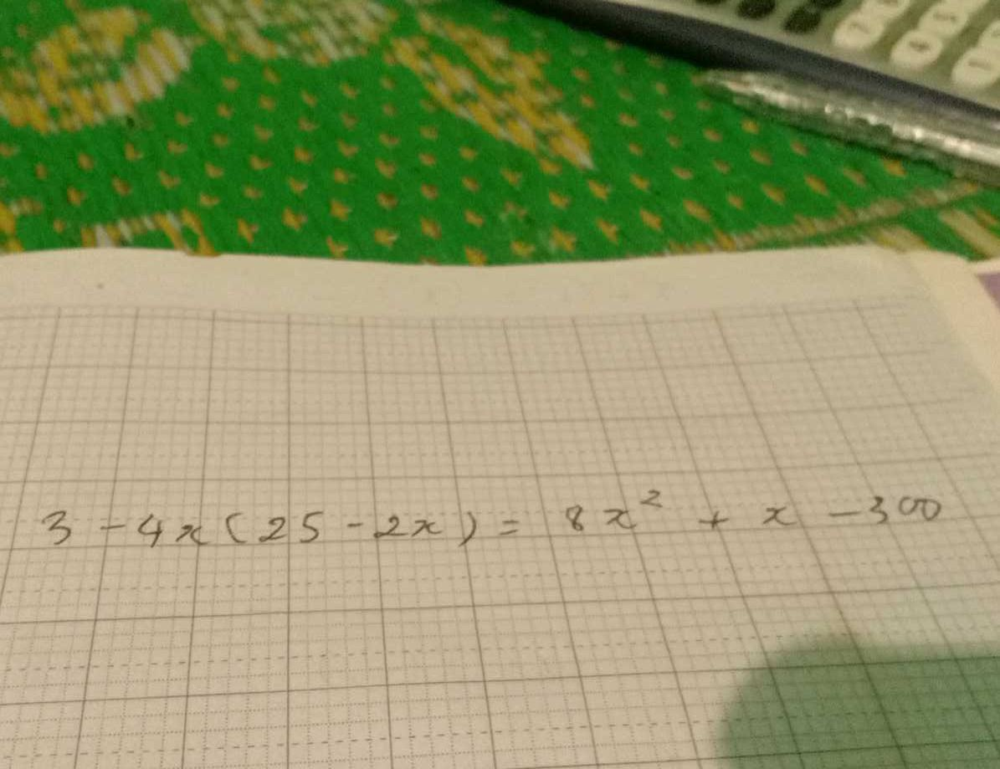

-- Number of words: 22


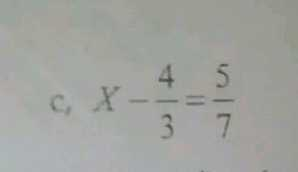

************

PAIRS: 35 - Cosine score: 1.0
-- Number of words: 17


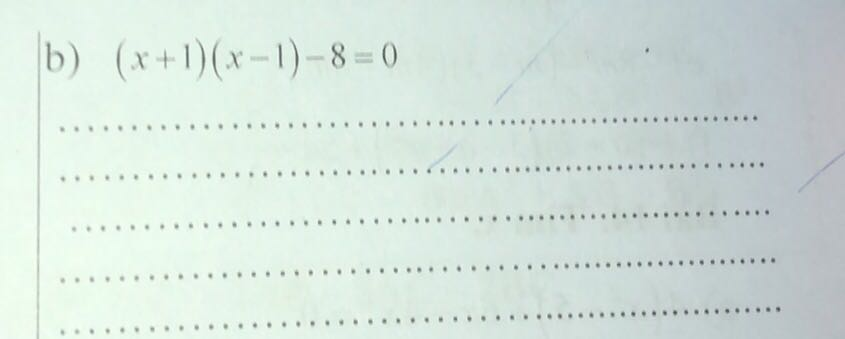

-- Number of words: 26


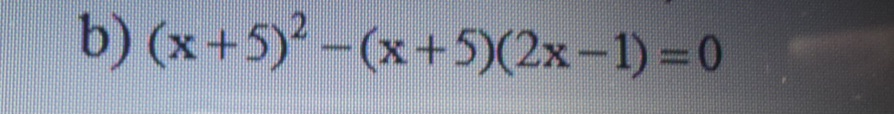

-- Number of words: 26


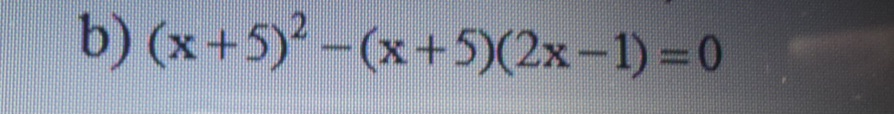

************

PAIRS: 36 - Cosine score: 1.0
-- Number of words: 15


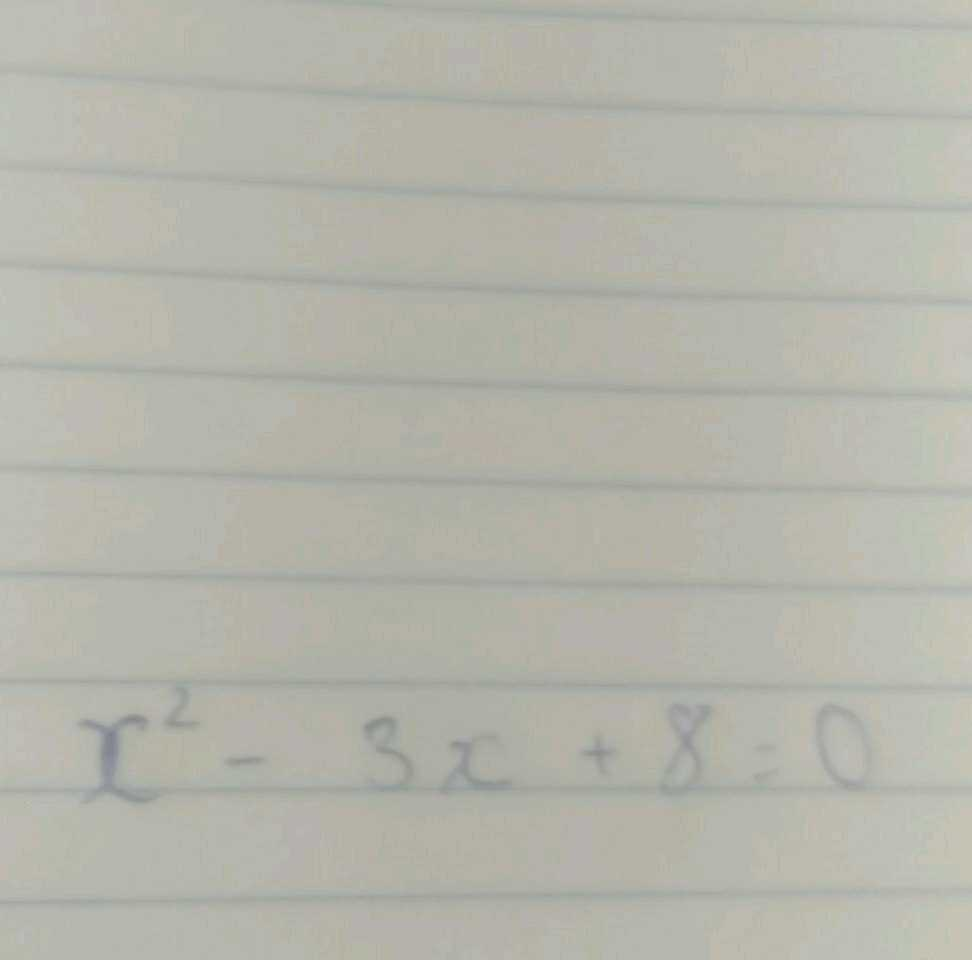

-- Number of words: 24


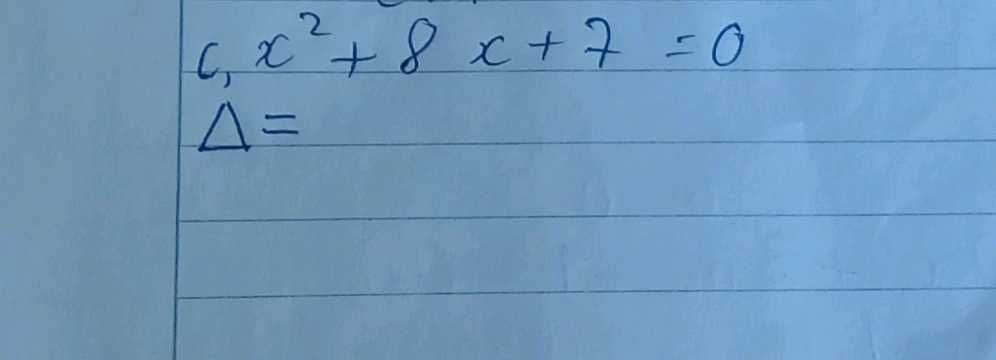

-- Number of words: 26


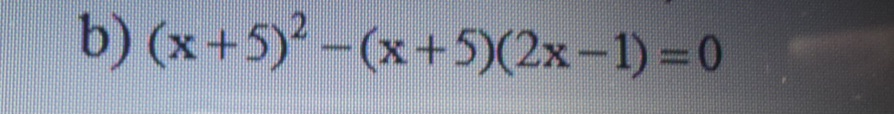

************

PAIRS: 37 - Cosine score: 1.0
-- Number of words: 71


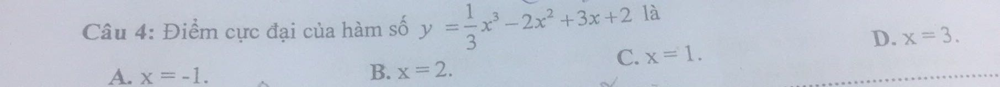

-- Number of words: 93


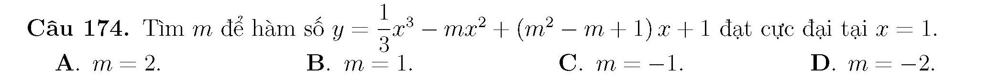

-- Number of words: 71


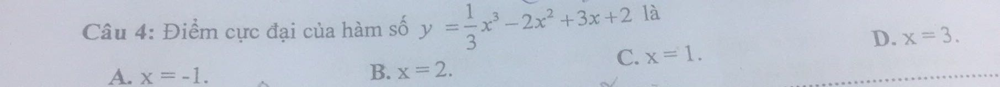

************

PAIRS: 38 - Cosine score: 1.0
-- Number of words: 26


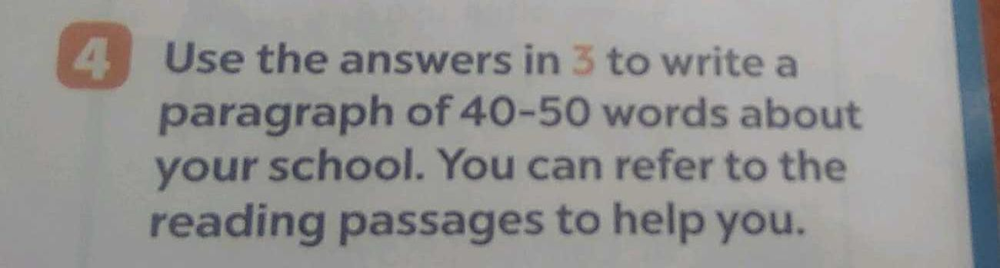

-- Number of words: 25


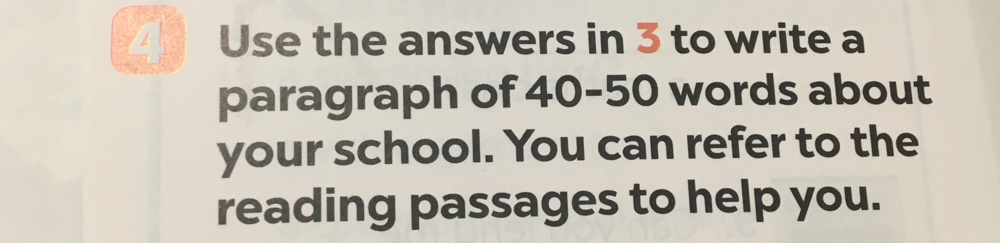

-- Number of words: 25


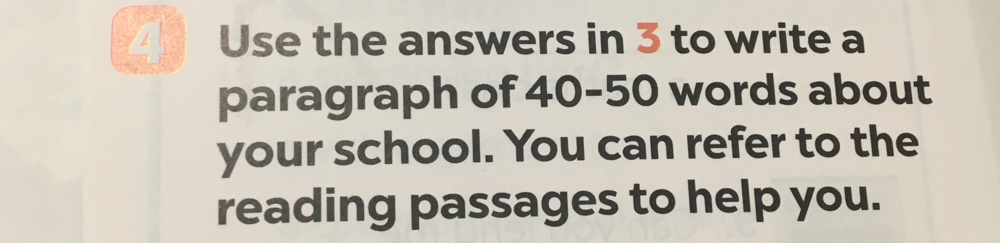

************

PAIRS: 39 - Cosine score: 1.0
-- Number of words: 22


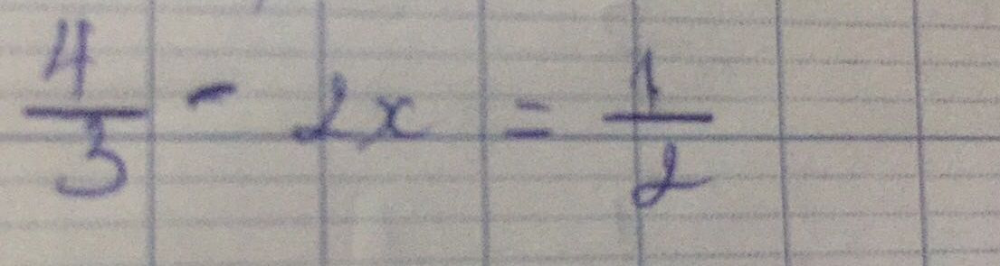

-- Number of words: 193


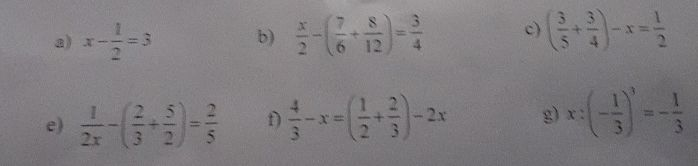

-- Number of words: 22


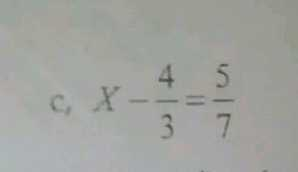

************

PAIRS: 40 - Cosine score: 1.0
-- Number of words: 111


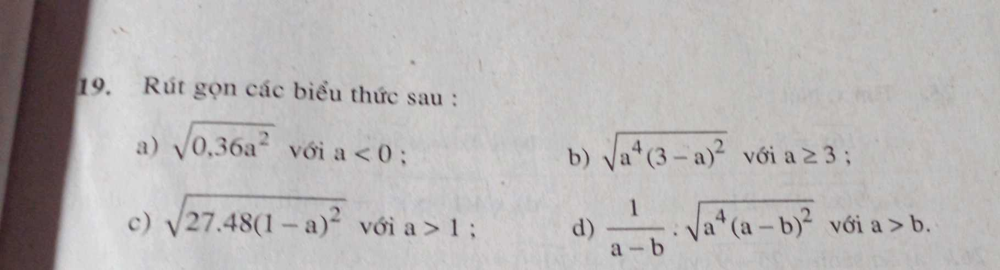

-- Number of words: 84


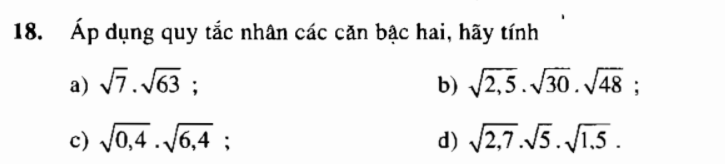

-- Number of words: 112


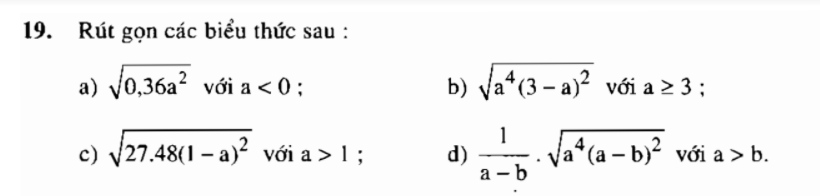

************

PAIRS: 41 - Cosine score: 1.0
-- Number of words: 35


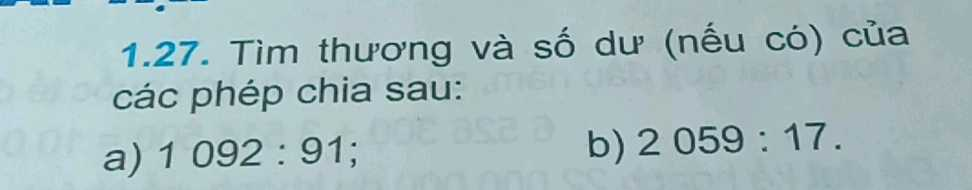

-- Number of words: 37


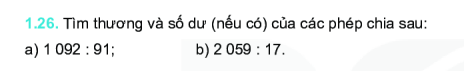

-- Number of words: 36


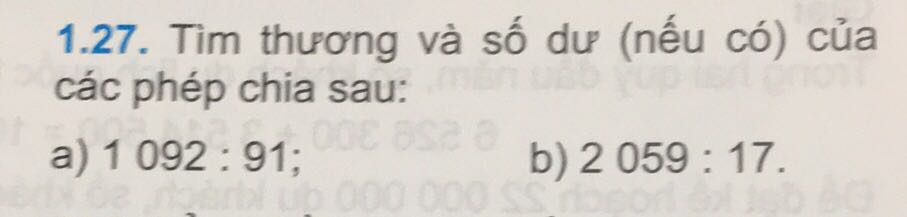

************

PAIRS: 42 - Cosine score: 1.0
-- Number of words: 27


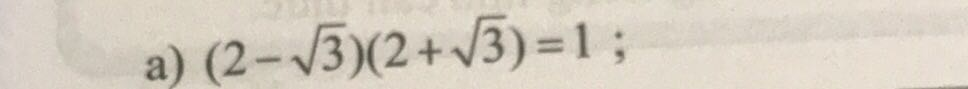

-- Number of words: 73


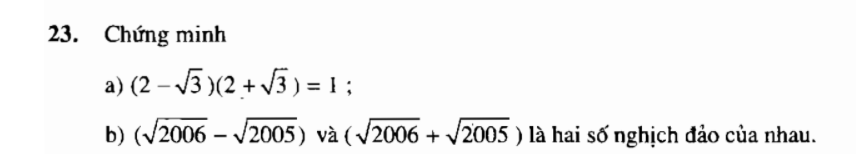

-- Number of words: 20


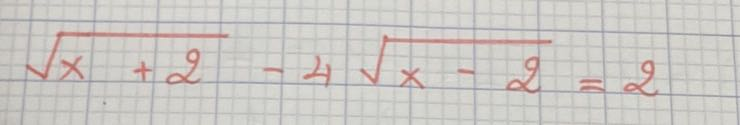

************

PAIRS: 43 - Cosine score: 1.0
-- Number of words: 66


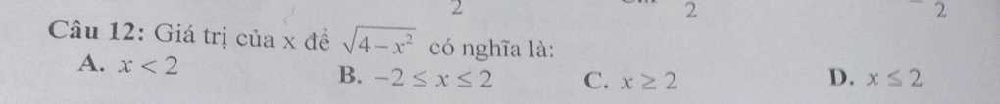

-- Number of words: 136


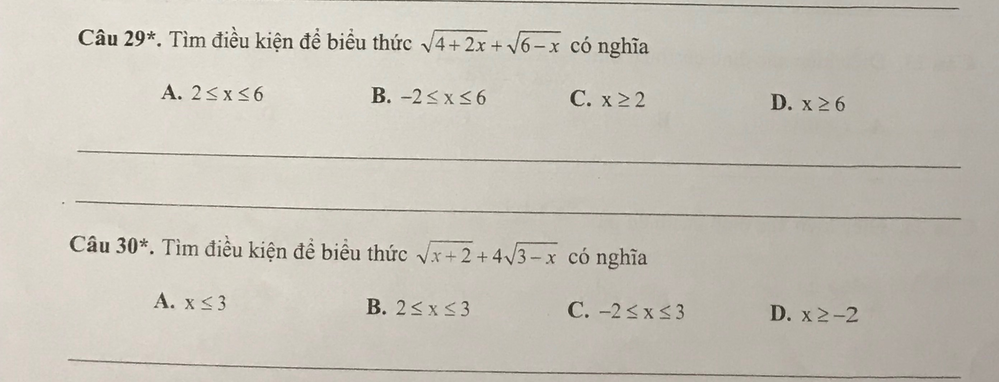

-- Number of words: 66


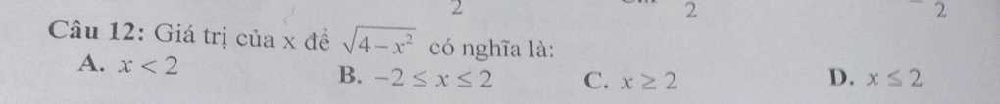

************

PAIRS: 44 - Cosine score: 1.0
-- Number of words: 16


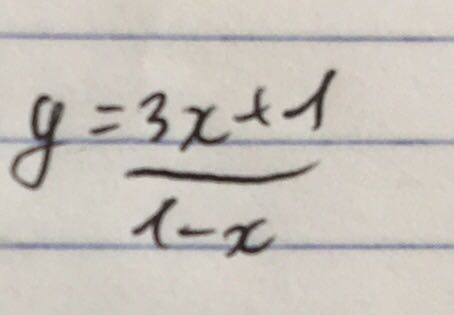

-- Number of words: 30


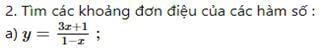

-- Number of words: 28


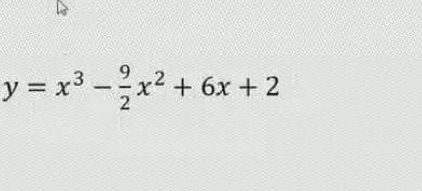

************

PAIRS: 45 - Cosine score: 1.0
-- Number of words: 47


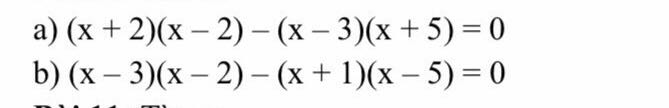

-- Number of words: 53


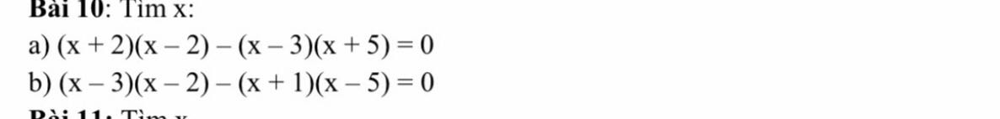

-- Number of words: 26


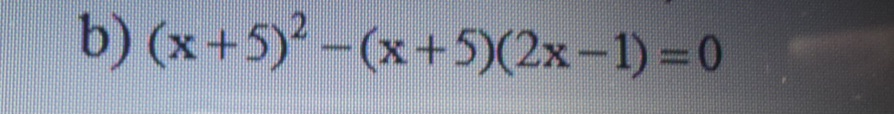

************

PAIRS: 46 - Cosine score: 1.0
-- Number of words: 14


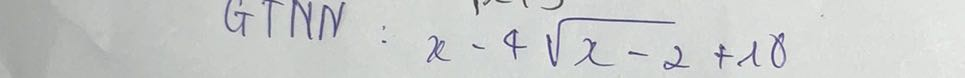

-- Number of words: 20


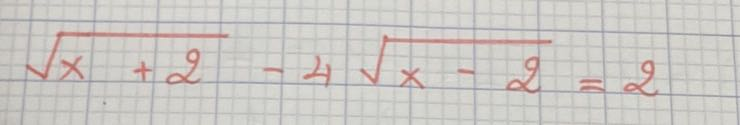

-- Number of words: 14


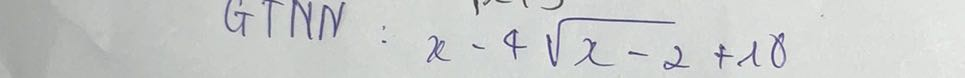

************

PAIRS: 47 - Cosine score: 1.0
-- Number of words: 29


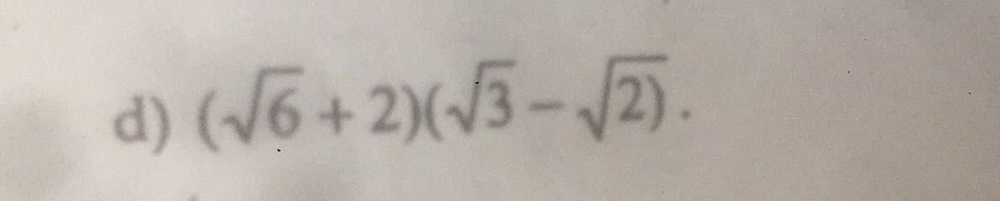

-- Number of words: 27


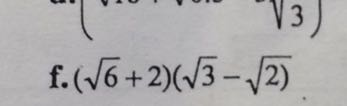

-- Number of words: 20


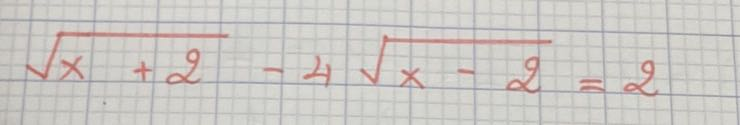

************

PAIRS: 48 - Cosine score: 1.0
-- Number of words: 16


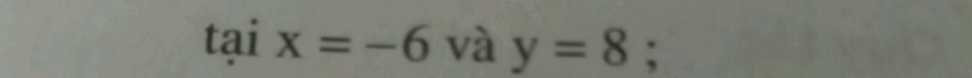

-- Number of words: 33


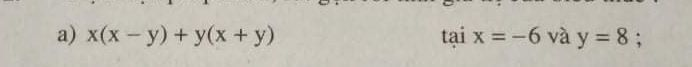

-- Number of words: 33


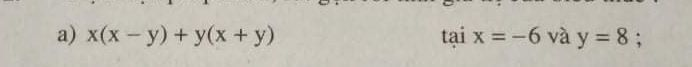

************

PAIRS: 49 - Cosine score: 1.0
-- Number of words: 28


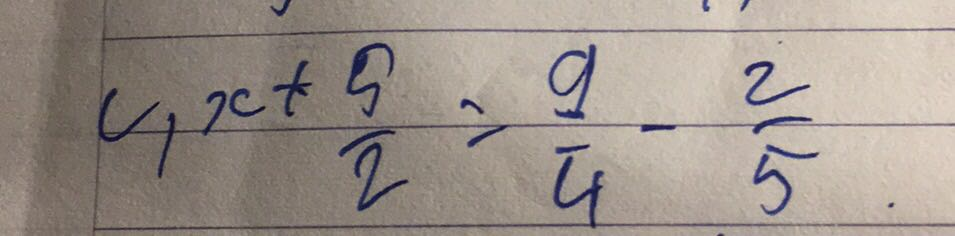

-- Number of words: 132


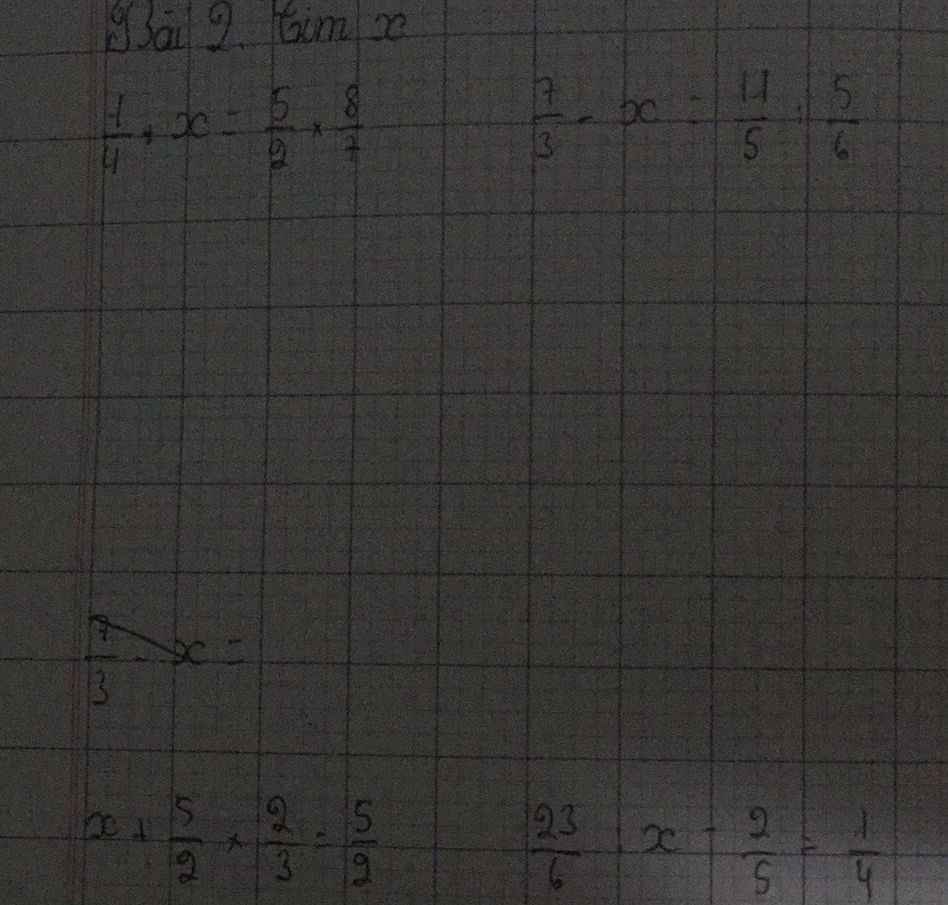

-- Number of words: 22


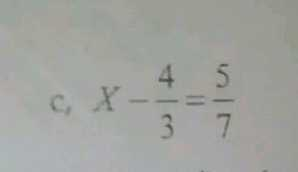

************

PAIRS: 50 - Cosine score: 1.0
-- Number of words: 21


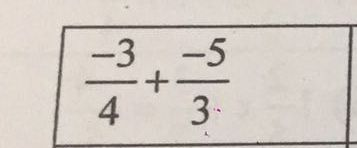

-- Number of words: 175


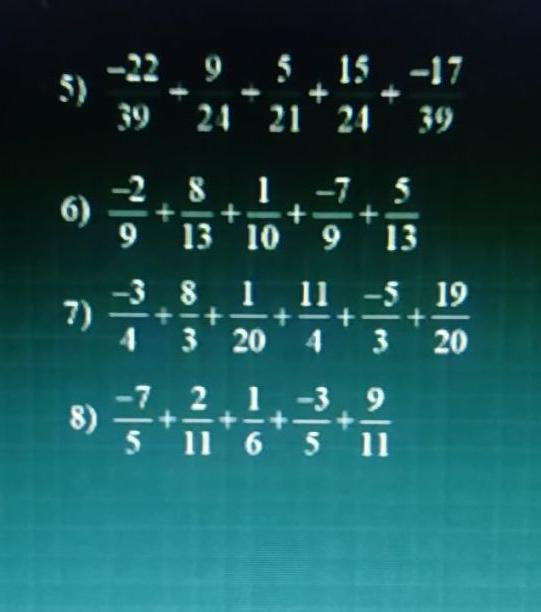

-- Number of words: 22


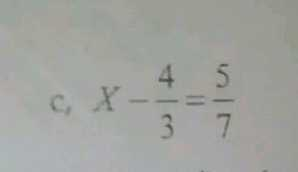

************

PAIRS: 51 - Cosine score: 1.0
-- Number of words: 34


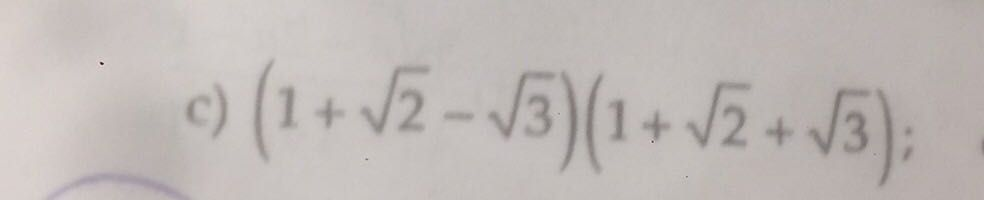

-- Number of words: 34


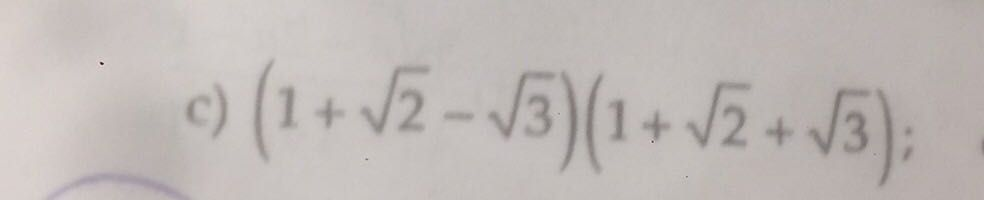

-- Number of words: 20


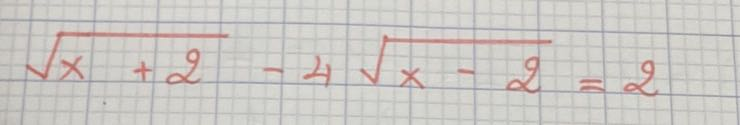

************



In [77]:
idx = 0
end = 50
for url1, url2 in zip(df_not['Question Image'].values, df_not['cosine_image'].values):
    print('PAIRS: {} - Cosine score: {}'.format(idx + 1, df_not['score'].values[idx]))
    print('-- Number of words:', df_not['word_count_lookup'].values[idx])
    img0 = Disp.Image(requests.get(df_not['Lookup Image'].values[idx]).content)
    display(img0)
    print('-- Number of words:', df_not['word_count_question'].values[idx])
    img1 = Disp.Image(requests.get(url1).content)
    display(img1)
    print('-- Number of words:', df_not['cosine_word_count_question'].values[idx])
    img2 = Disp.Image(requests.get(url2).content)
    display(img2)
    print('************')
    print()
    idx += 1
    if idx > end:
        break

In [82]:
df_a = df_not.loc[df_not['score'] >= 1]
df_a = df_a.sort_values('score', ascending = False)

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


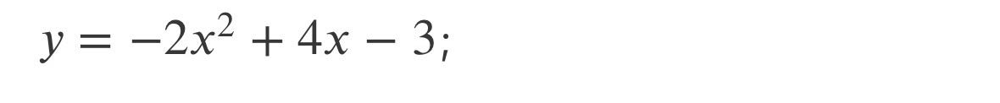

-- Number of words: 22


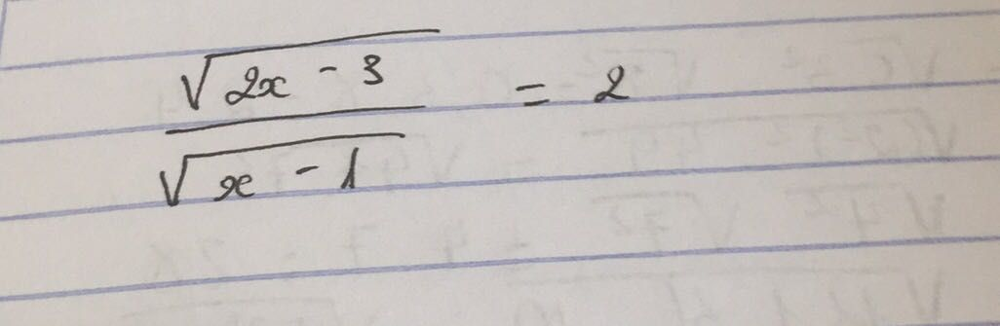

-- Number of words: 22


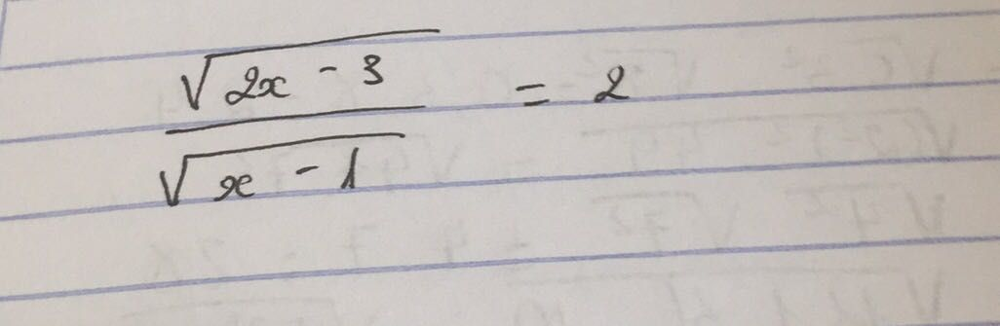

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


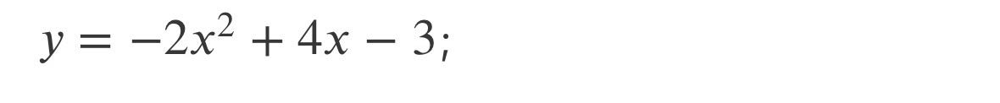

-- Number of words: 22


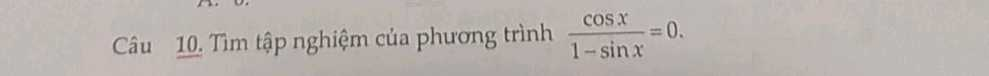

-- Number of words: 22


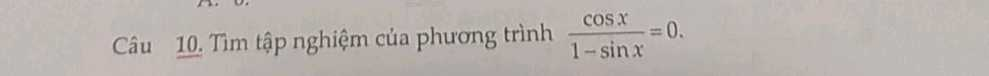

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


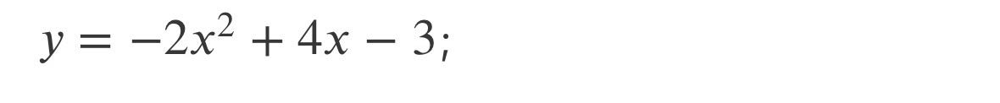

-- Number of words: 22


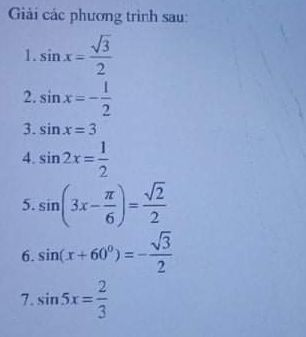

-- Number of words: 22


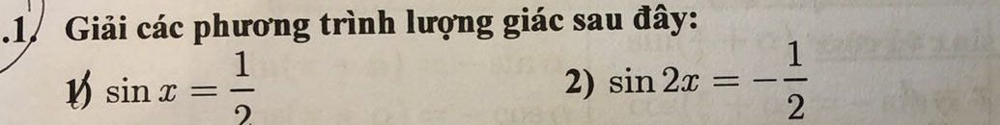

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


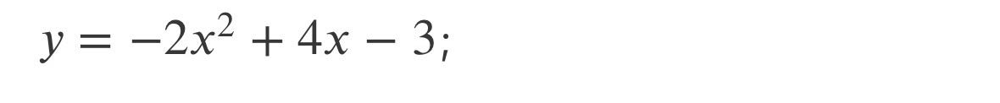

-- Number of words: 22


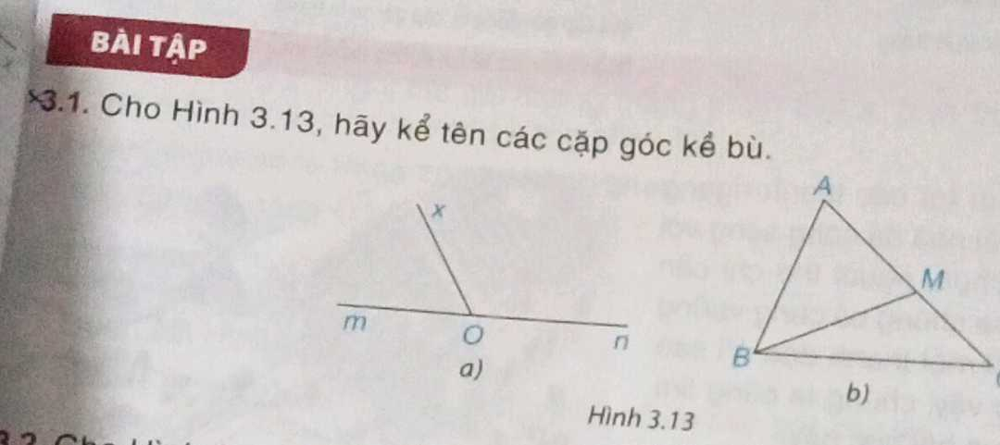

-- Number of words: 22


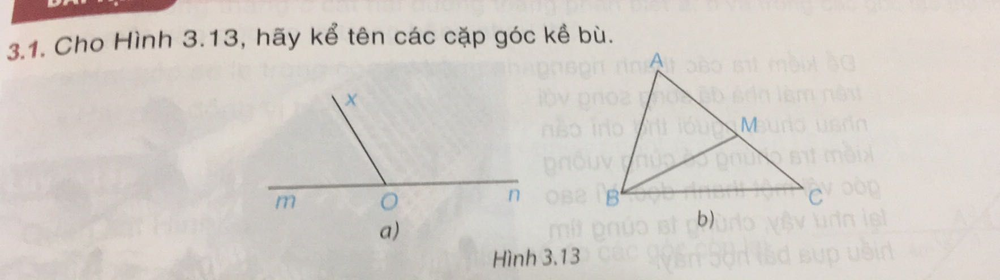

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


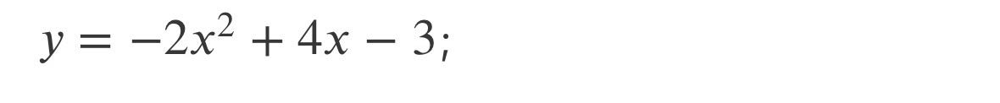

-- Number of words: 22


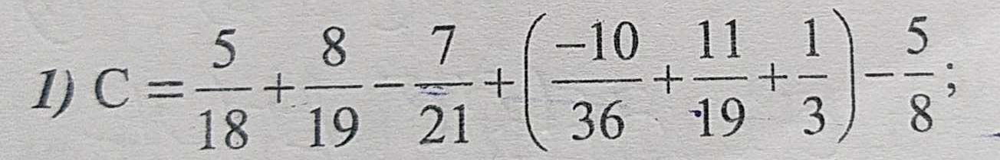

-- Number of words: 22


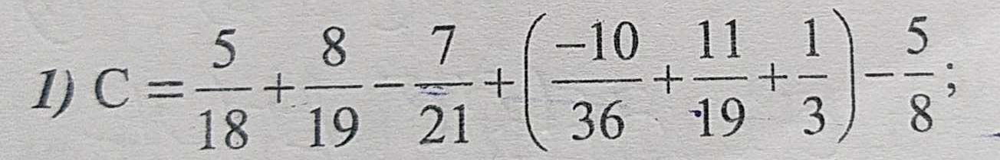

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


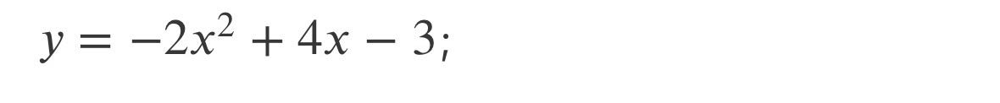

-- Number of words: 22


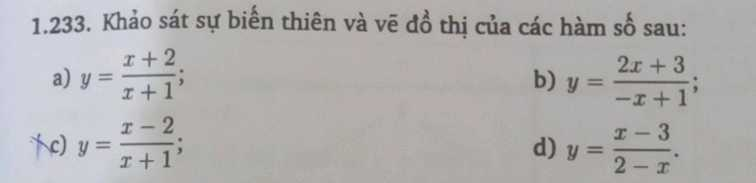

-- Number of words: 22


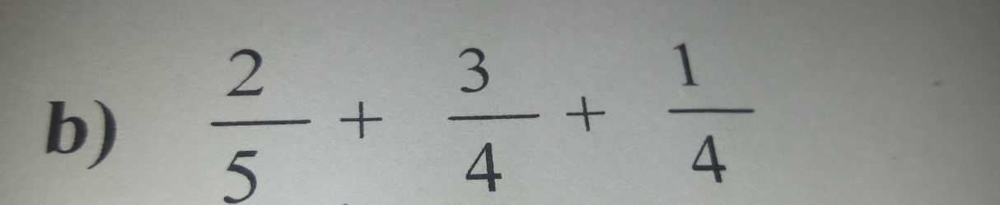

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


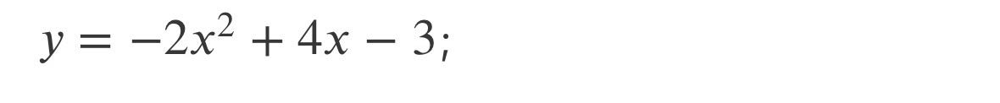

-- Number of words: 22


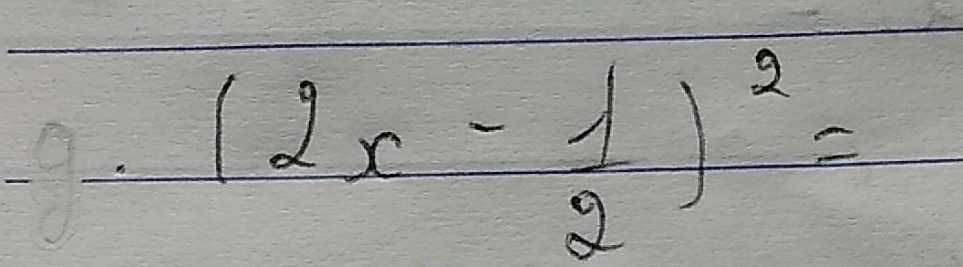

-- Number of words: 22


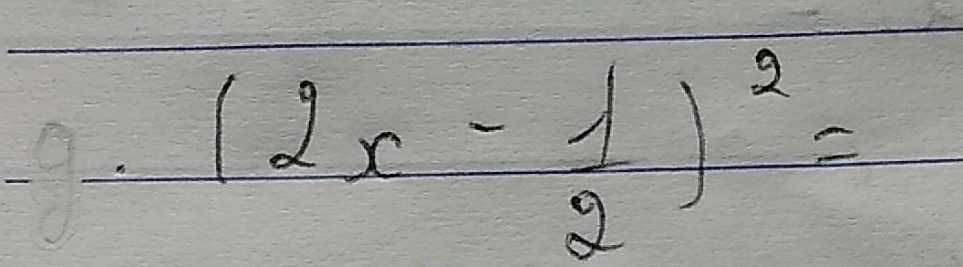

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


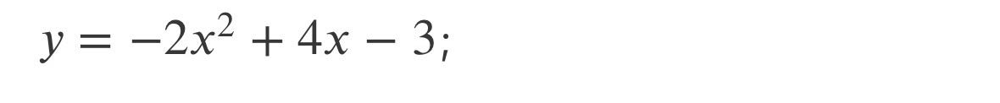

-- Number of words: 22


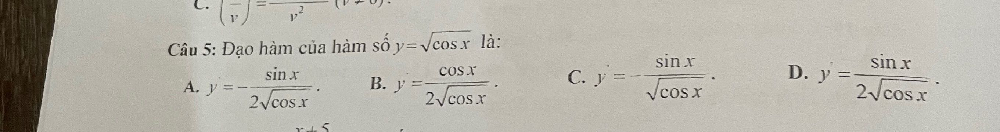

-- Number of words: 22


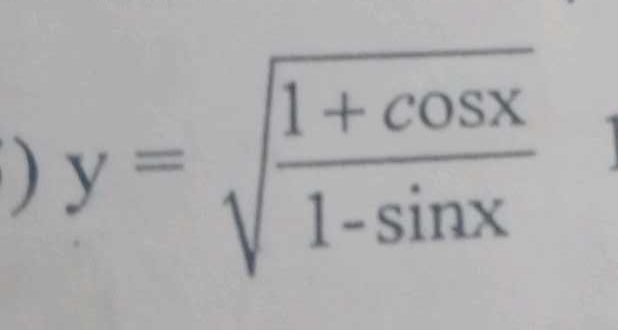

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


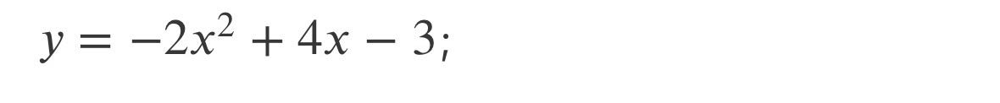

-- Number of words: 22


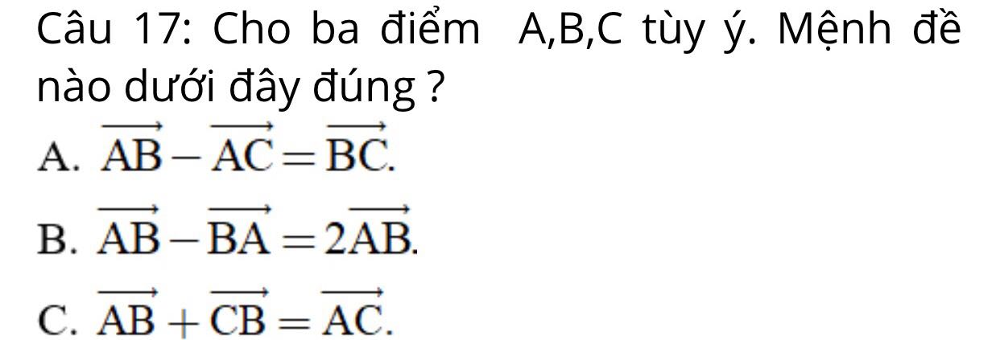

-- Number of words: 22


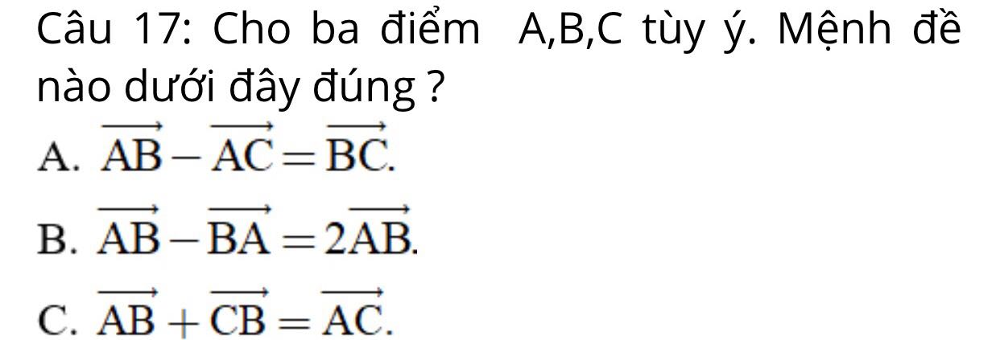

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


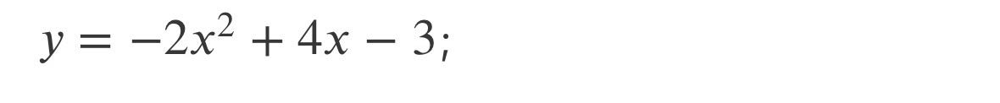

-- Number of words: 22


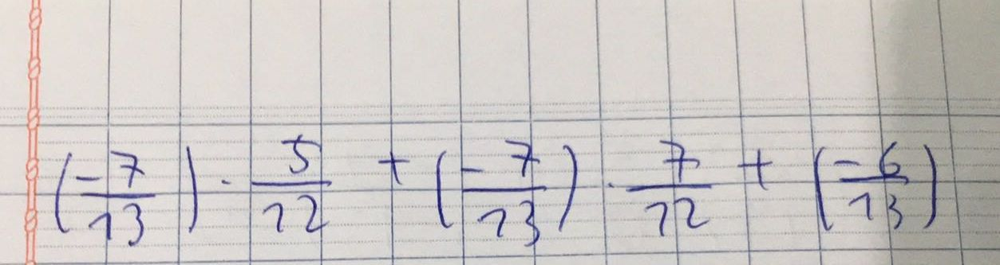

-- Number of words: 22


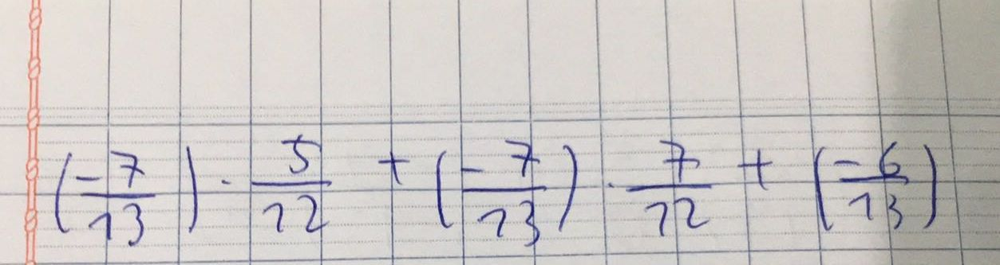

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


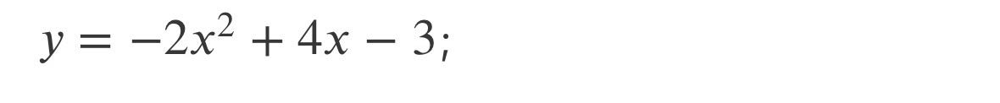

-- Number of words: 22


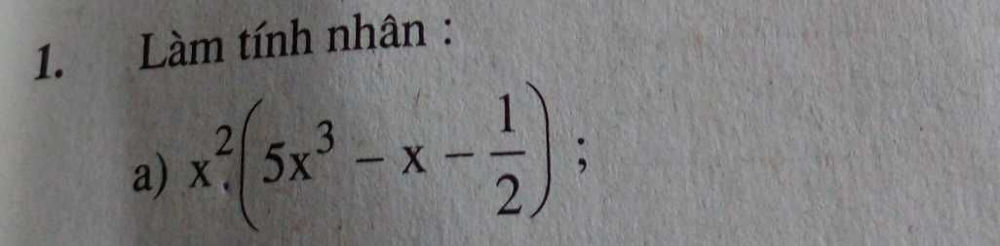

-- Number of words: 22


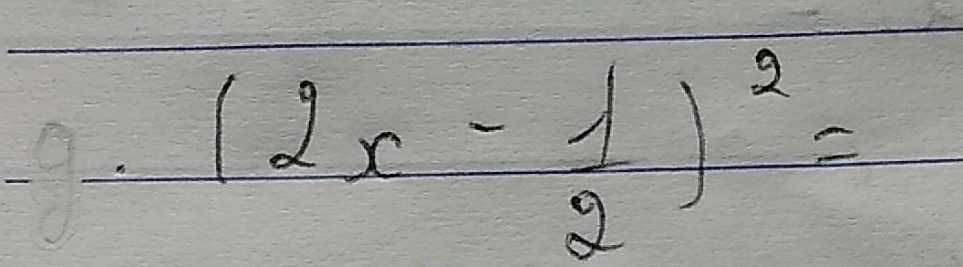

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


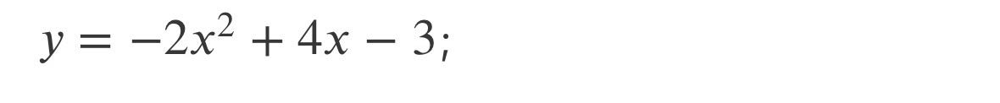

-- Number of words: 22


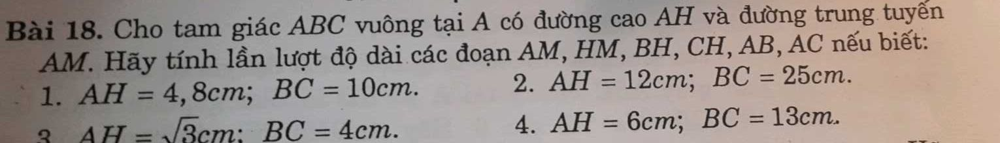

-- Number of words: 22


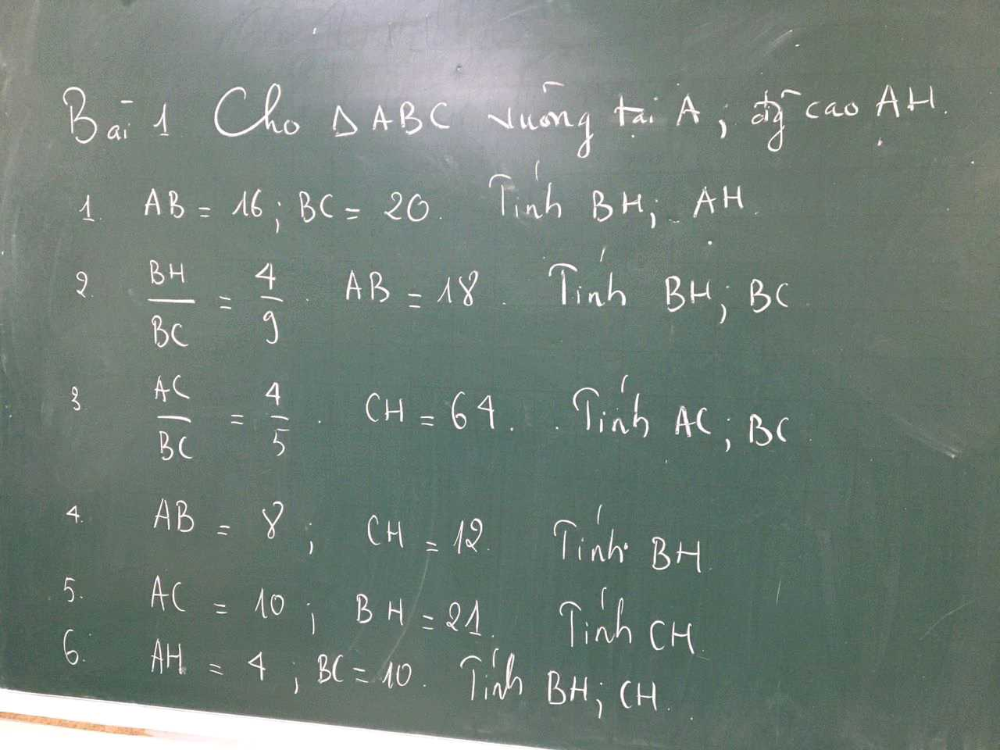

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


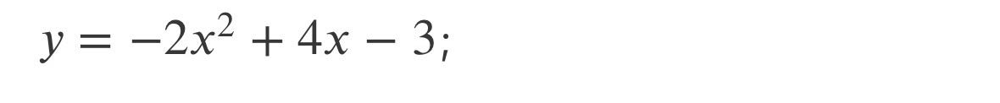

-- Number of words: 22


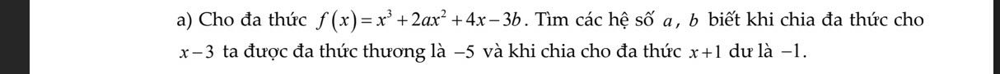

-- Number of words: 22


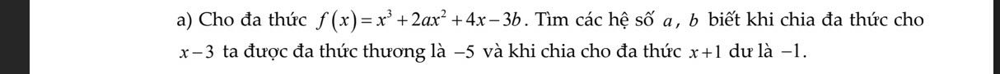

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


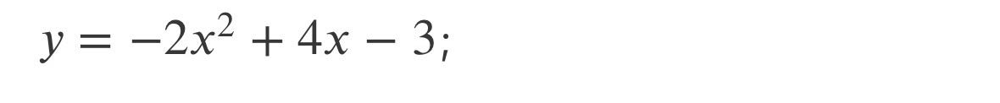

-- Number of words: 22


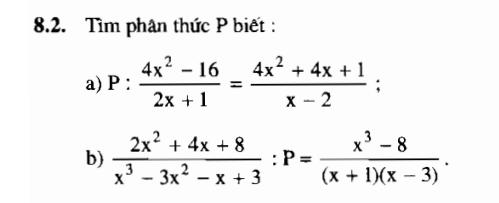

-- Number of words: 22


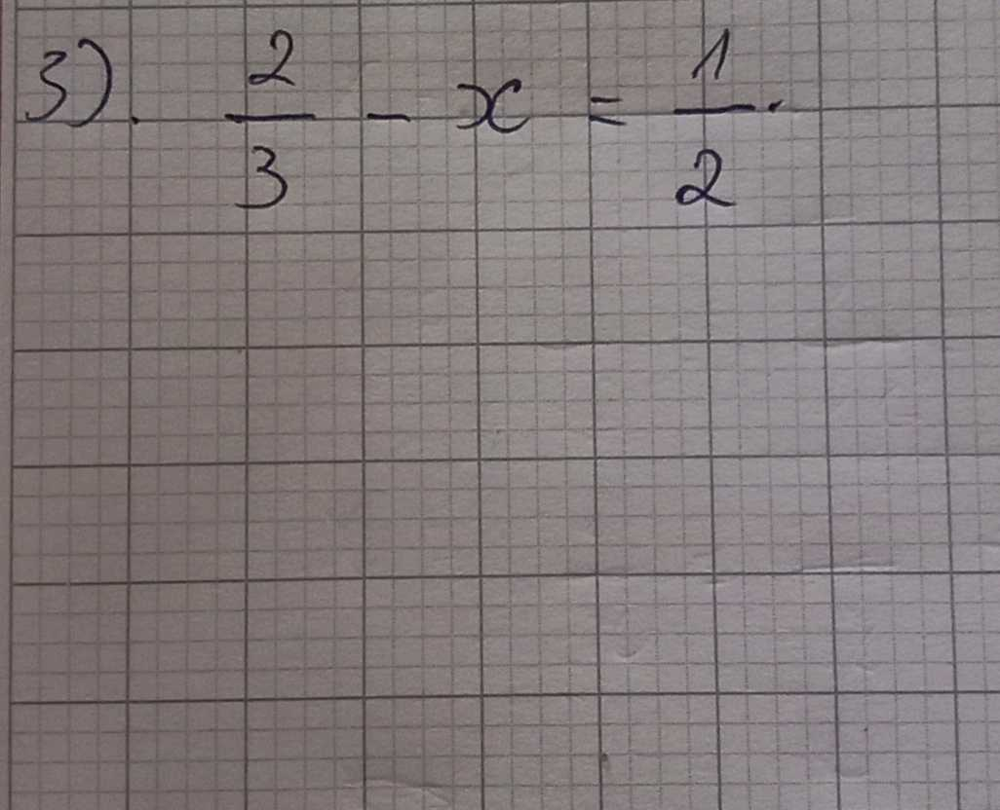

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


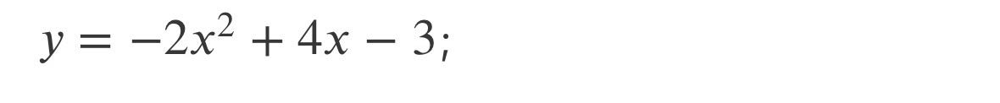

-- Number of words: 22


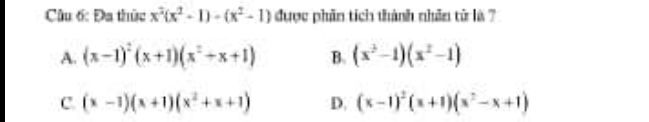

-- Number of words: 22


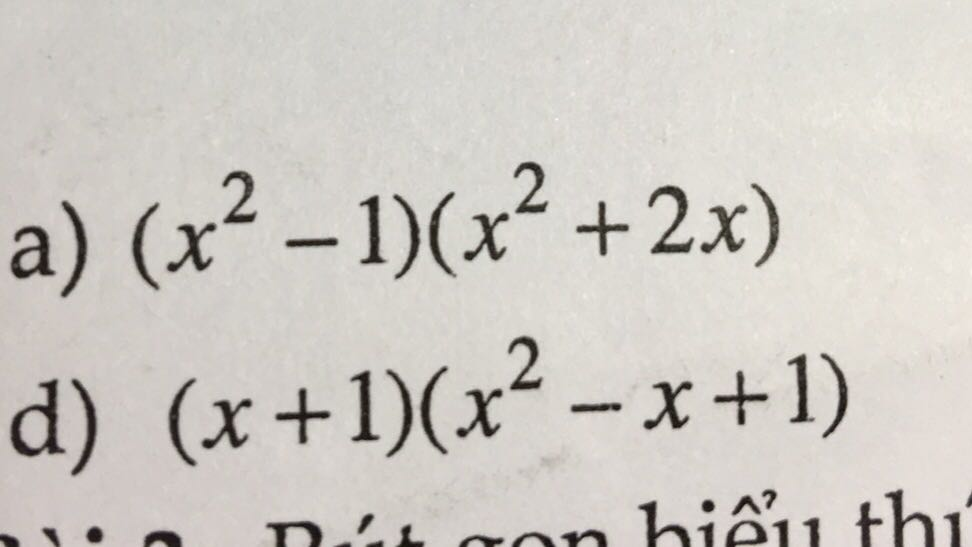

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


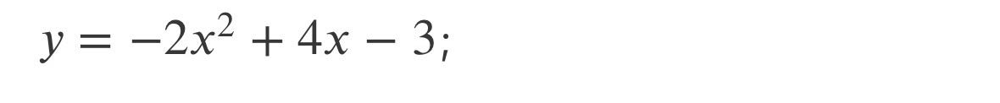

-- Number of words: 22


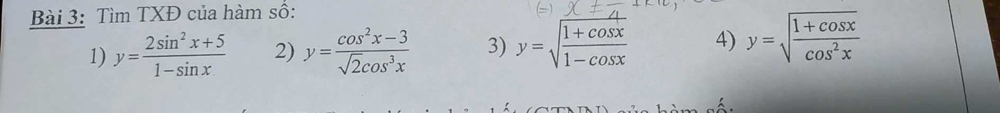

-- Number of words: 22


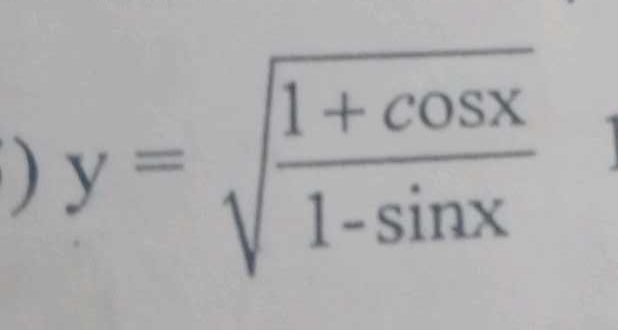

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


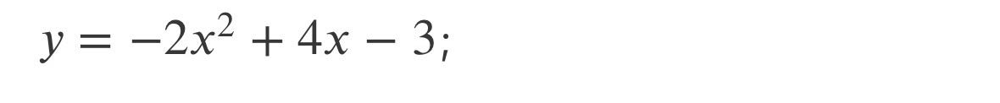

-- Number of words: 22


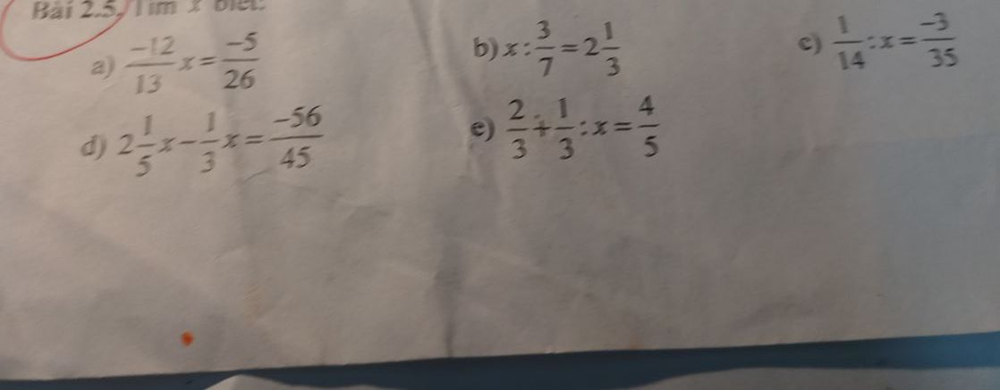

-- Number of words: 22


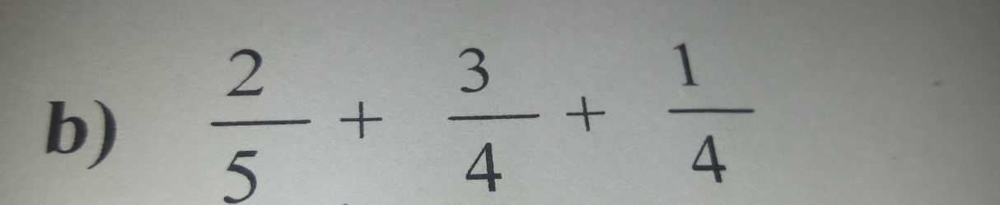

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


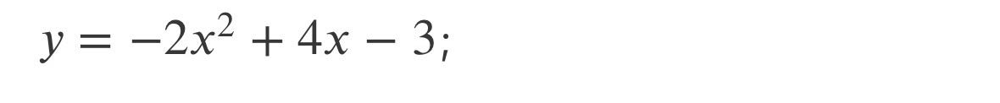

-- Number of words: 22


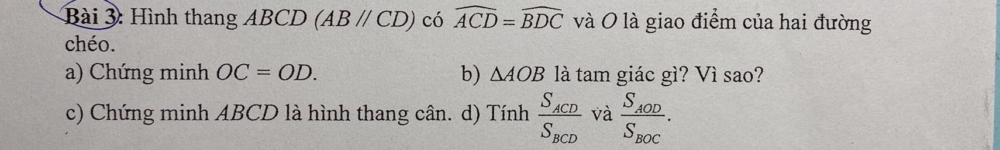

-- Number of words: 22


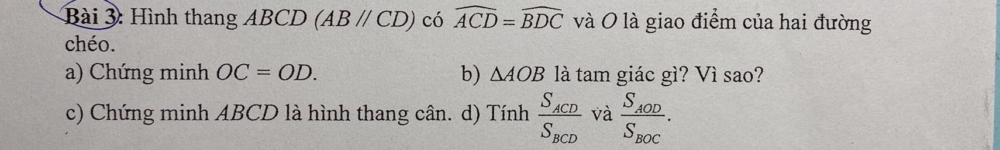

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


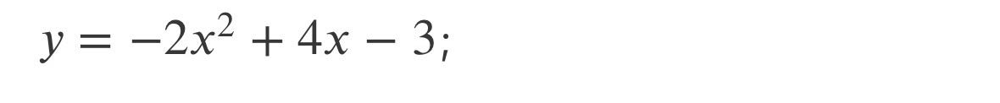

-- Number of words: 22


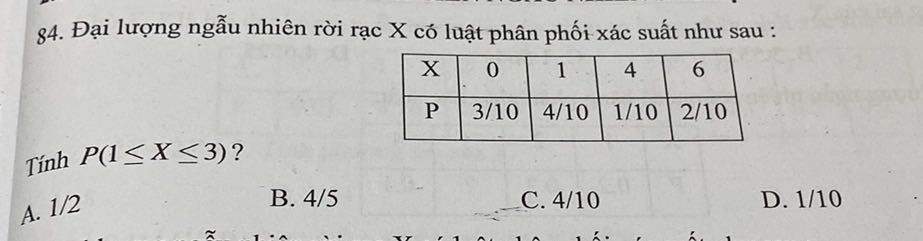

-- Number of words: 22


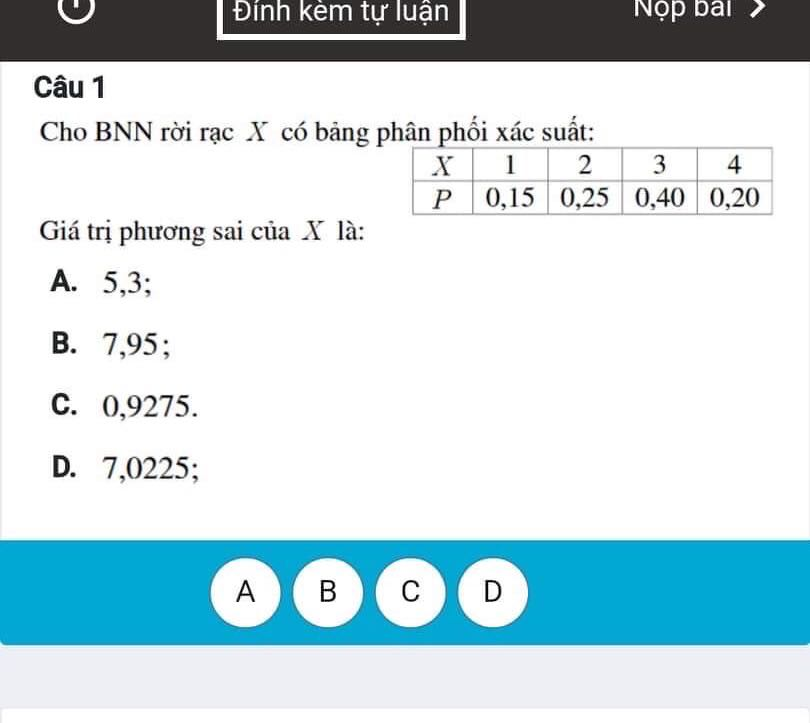

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


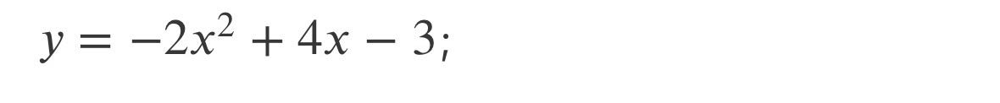

-- Number of words: 22


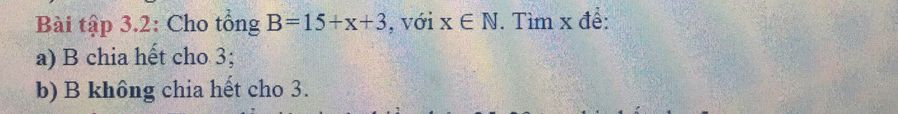

-- Number of words: 22


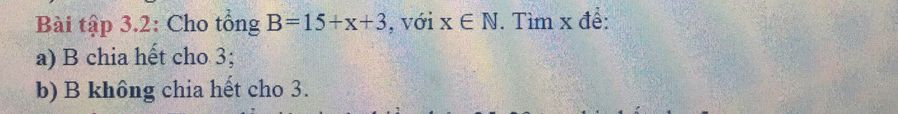

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


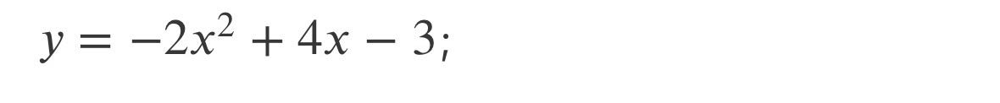

-- Number of words: 22


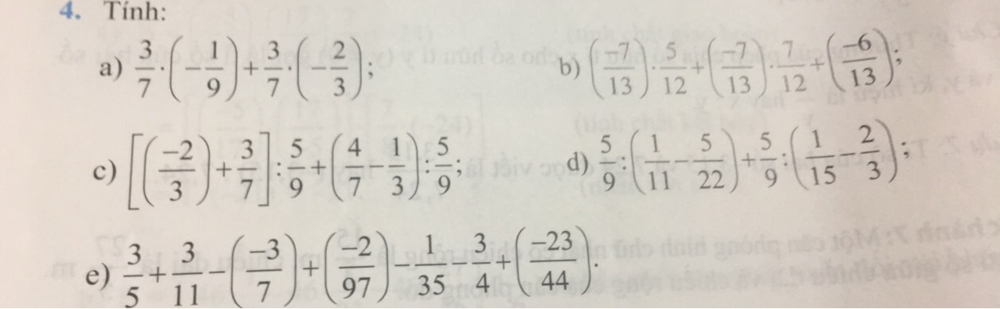

-- Number of words: 22


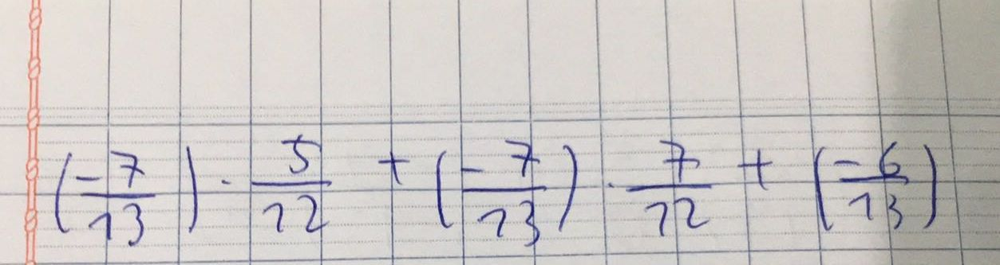

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


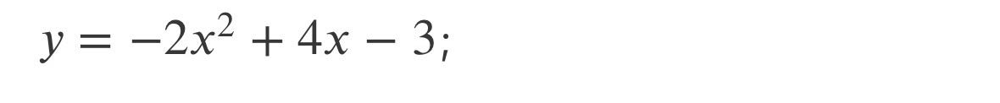

-- Number of words: 22


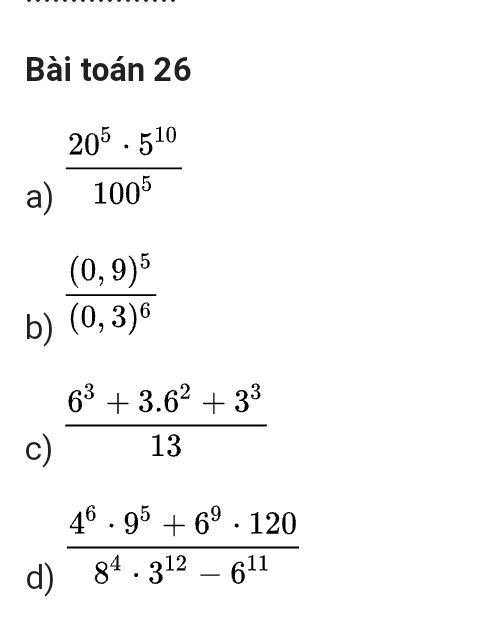

-- Number of words: 22


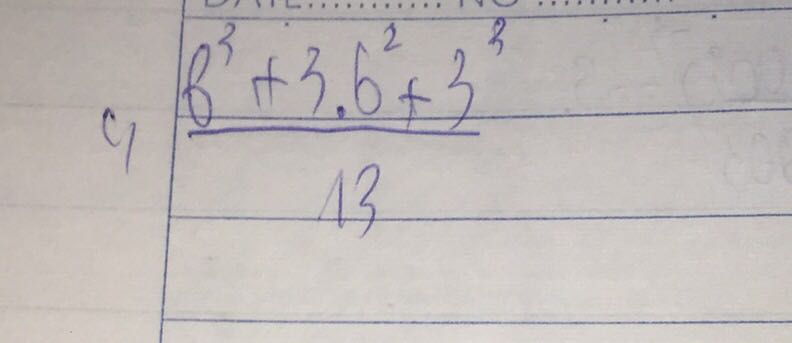

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


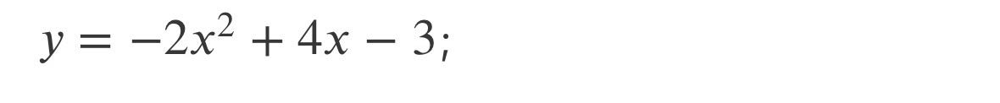

-- Number of words: 22


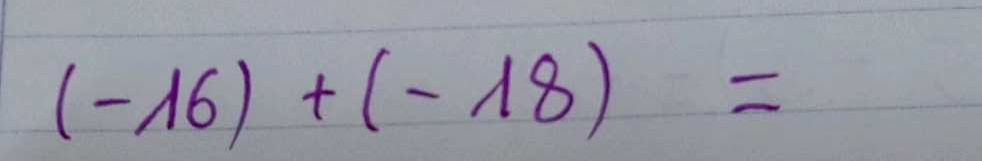

-- Number of words: 22


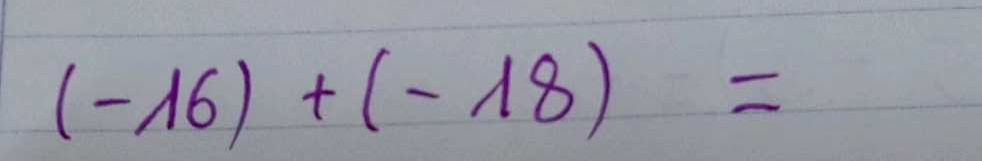

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


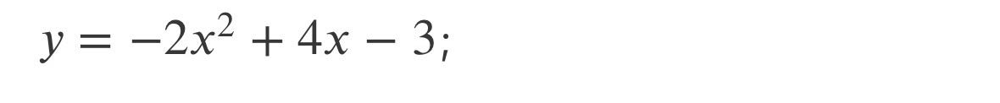

-- Number of words: 22


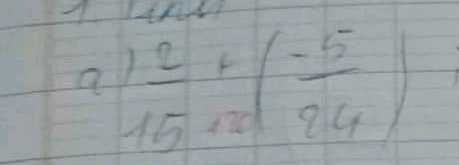

-- Number of words: 22


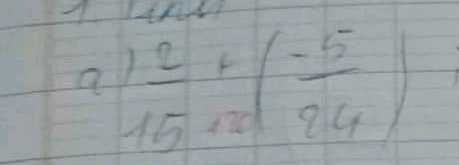

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


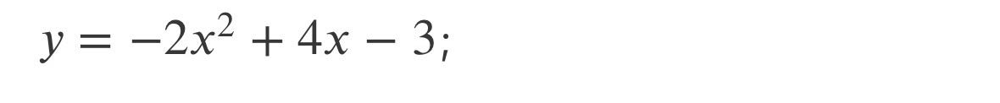

-- Number of words: 22


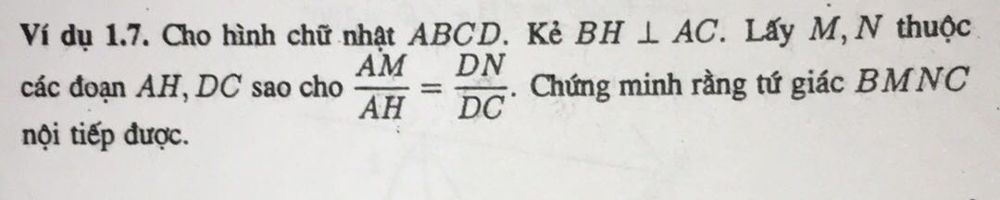

-- Number of words: 22


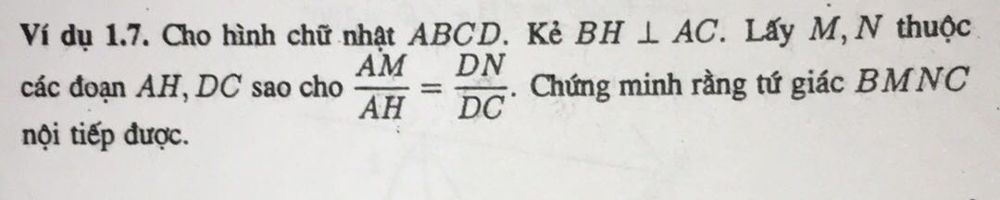

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


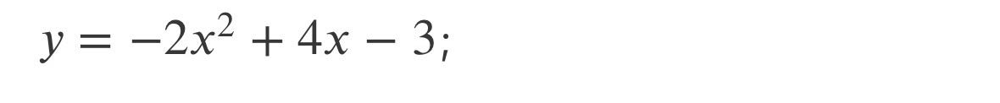

-- Number of words: 22


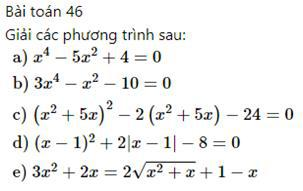

-- Number of words: 22


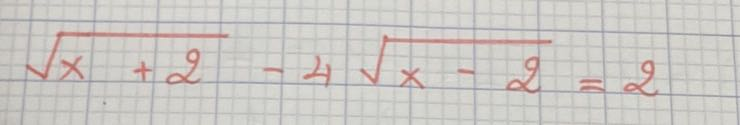

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


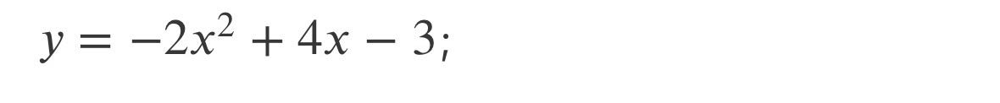

-- Number of words: 22


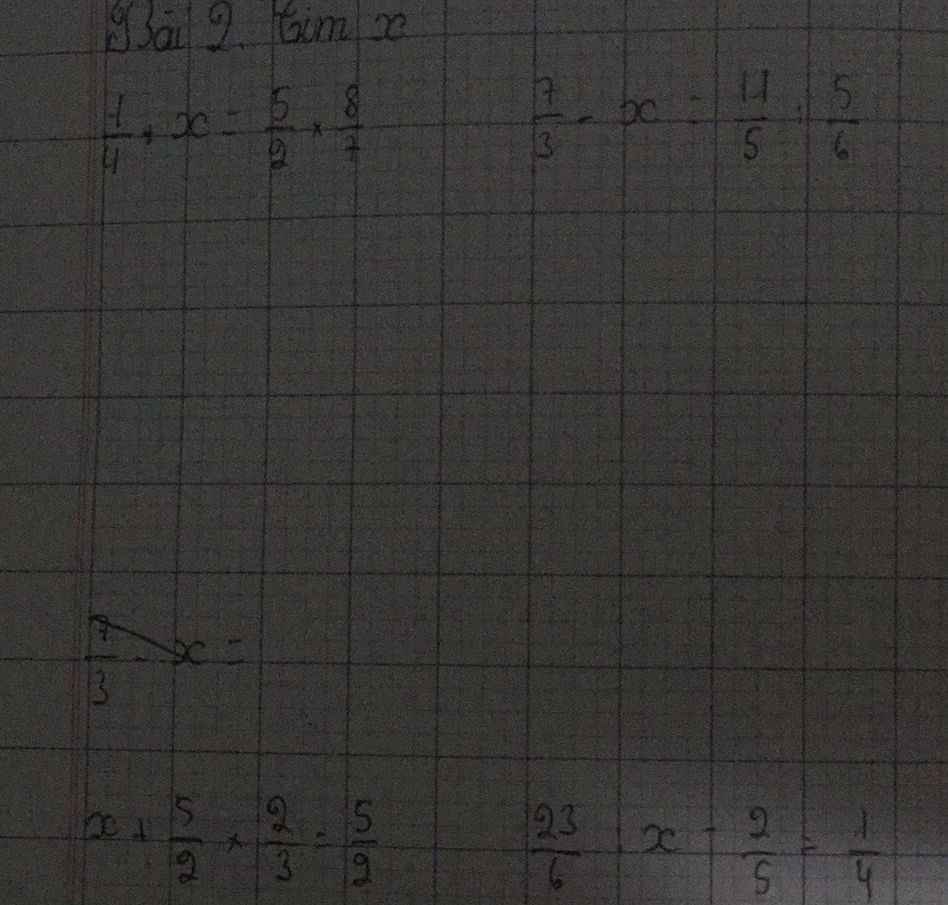

-- Number of words: 22


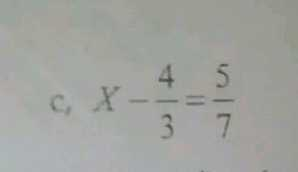

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


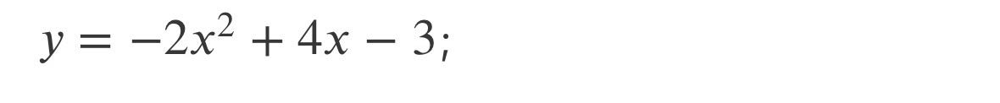

-- Number of words: 22


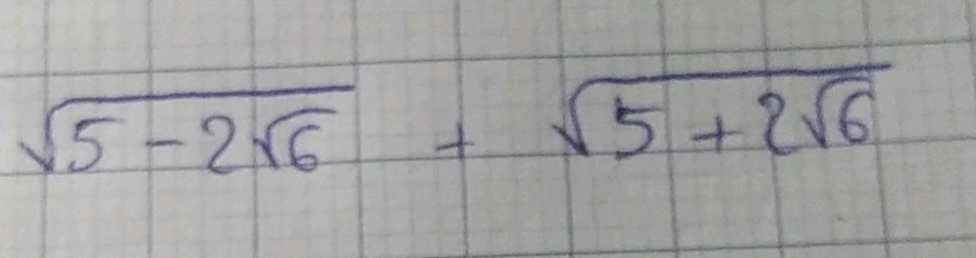

-- Number of words: 22


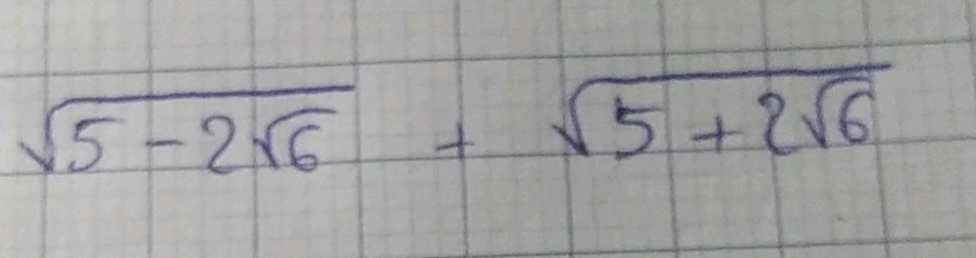

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


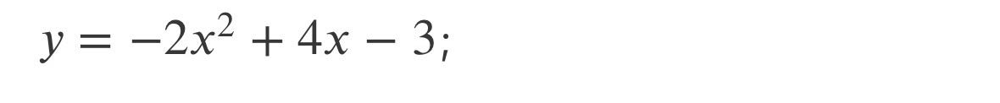

-- Number of words: 22


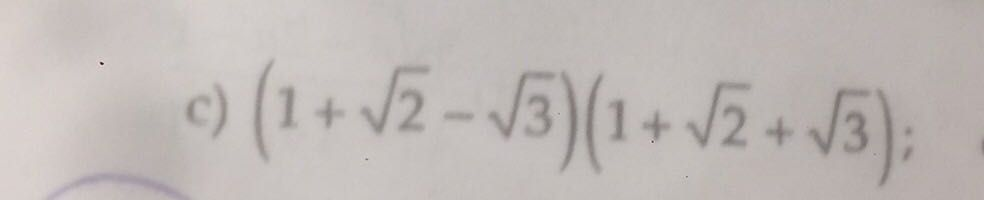

-- Number of words: 22


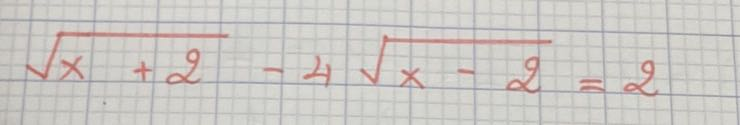

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


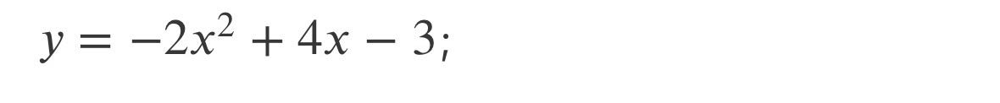

-- Number of words: 22


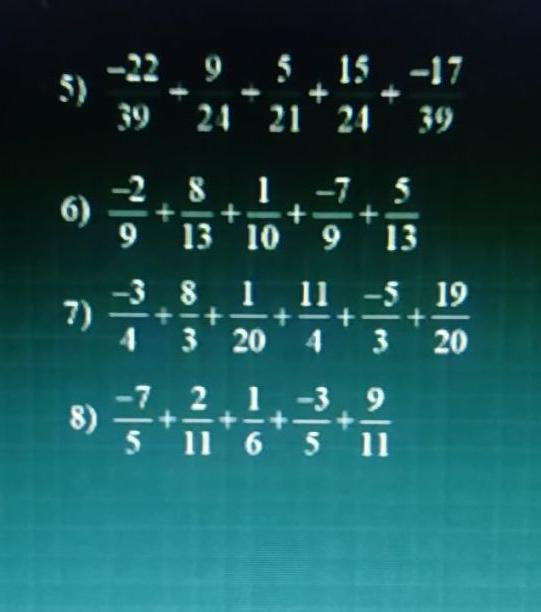

-- Number of words: 22


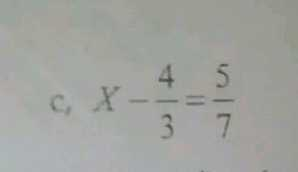

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


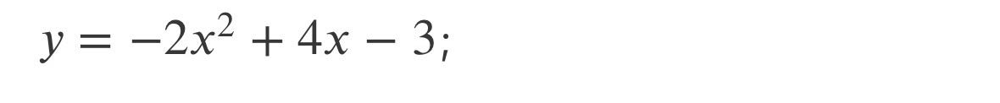

-- Number of words: 22


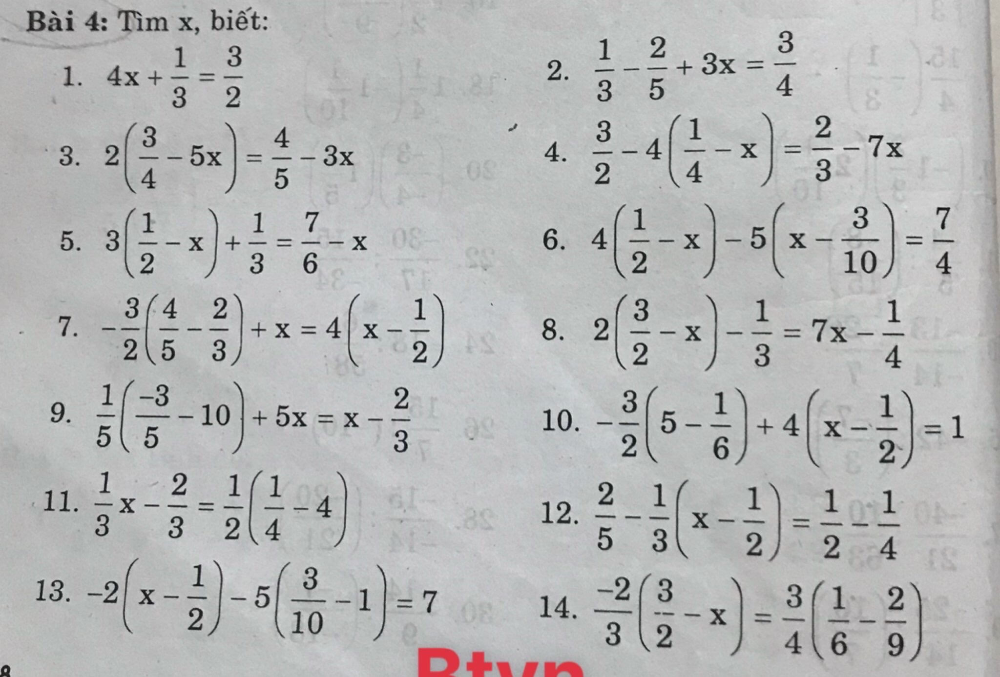

-- Number of words: 22


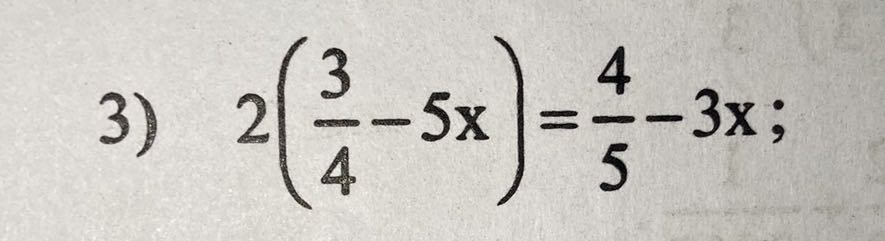

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


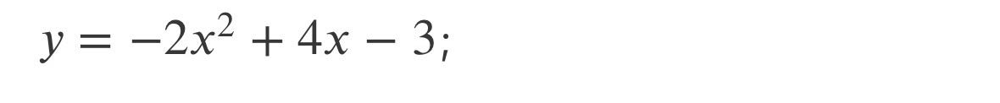

-- Number of words: 22


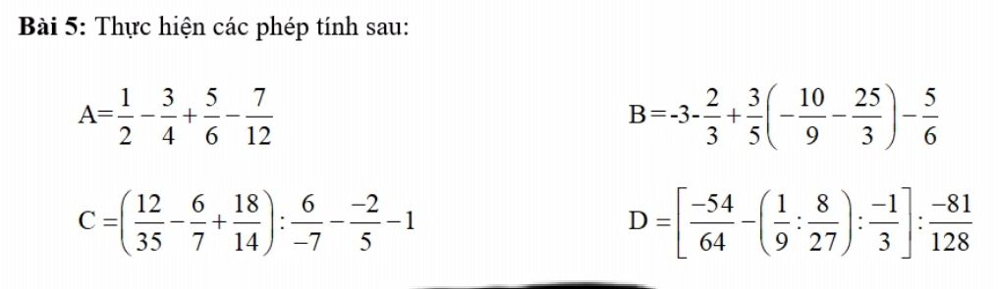

-- Number of words: 22


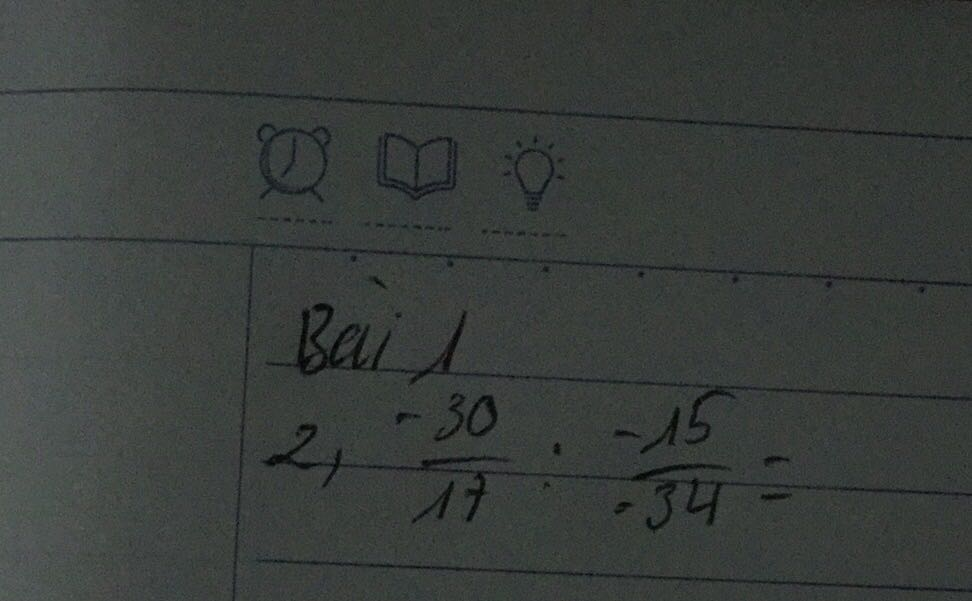

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


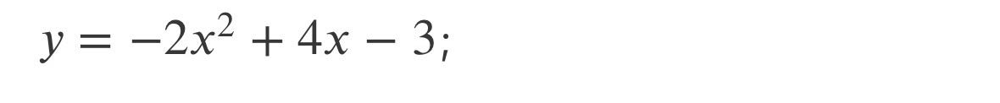

-- Number of words: 22


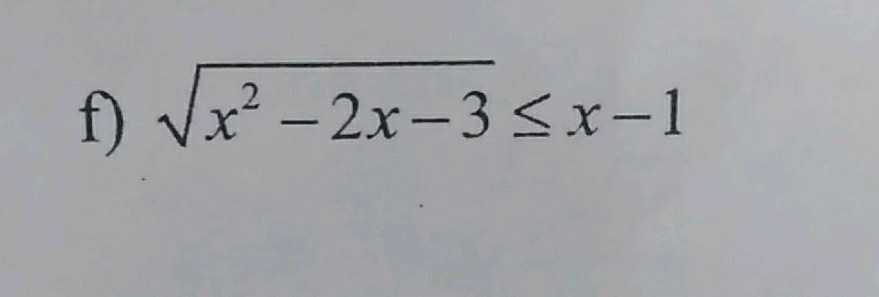

-- Number of words: 22


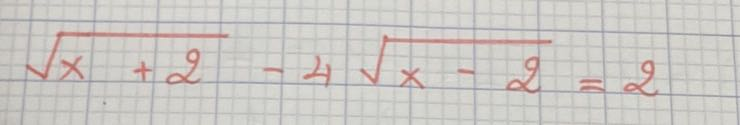

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


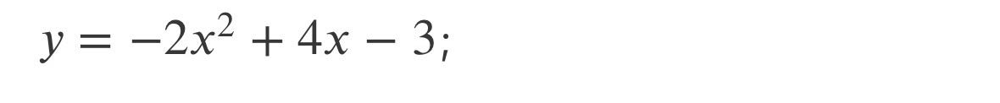

-- Number of words: 22


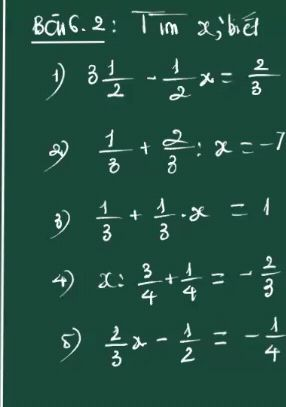

-- Number of words: 22


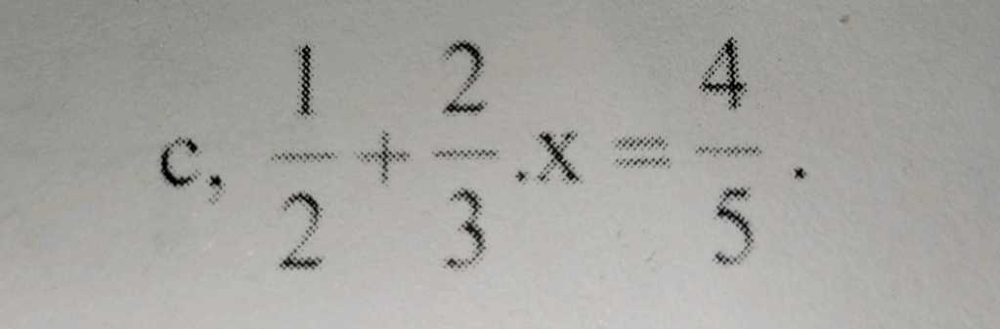

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


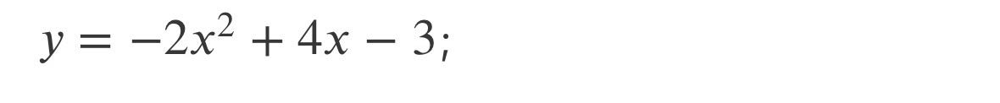

-- Number of words: 22


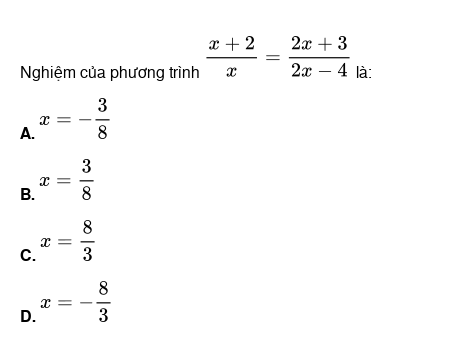

-- Number of words: 22


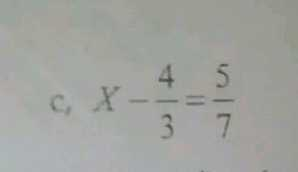

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


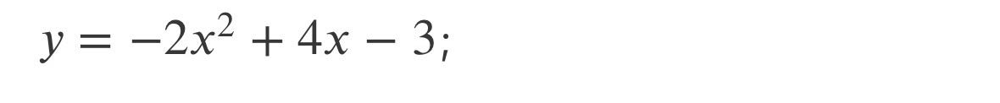

-- Number of words: 22


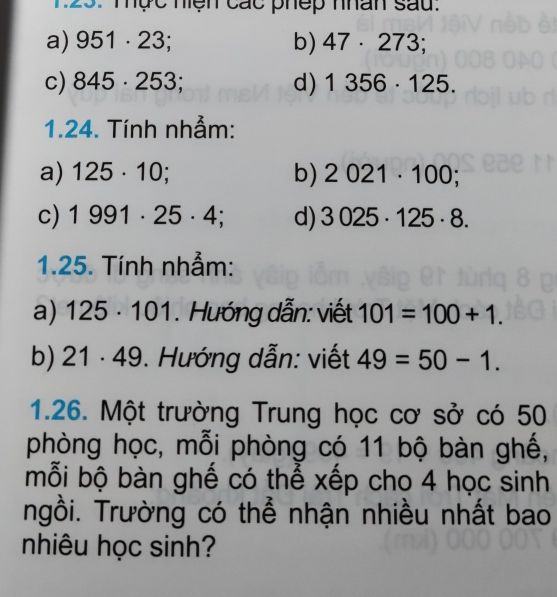

-- Number of words: 22


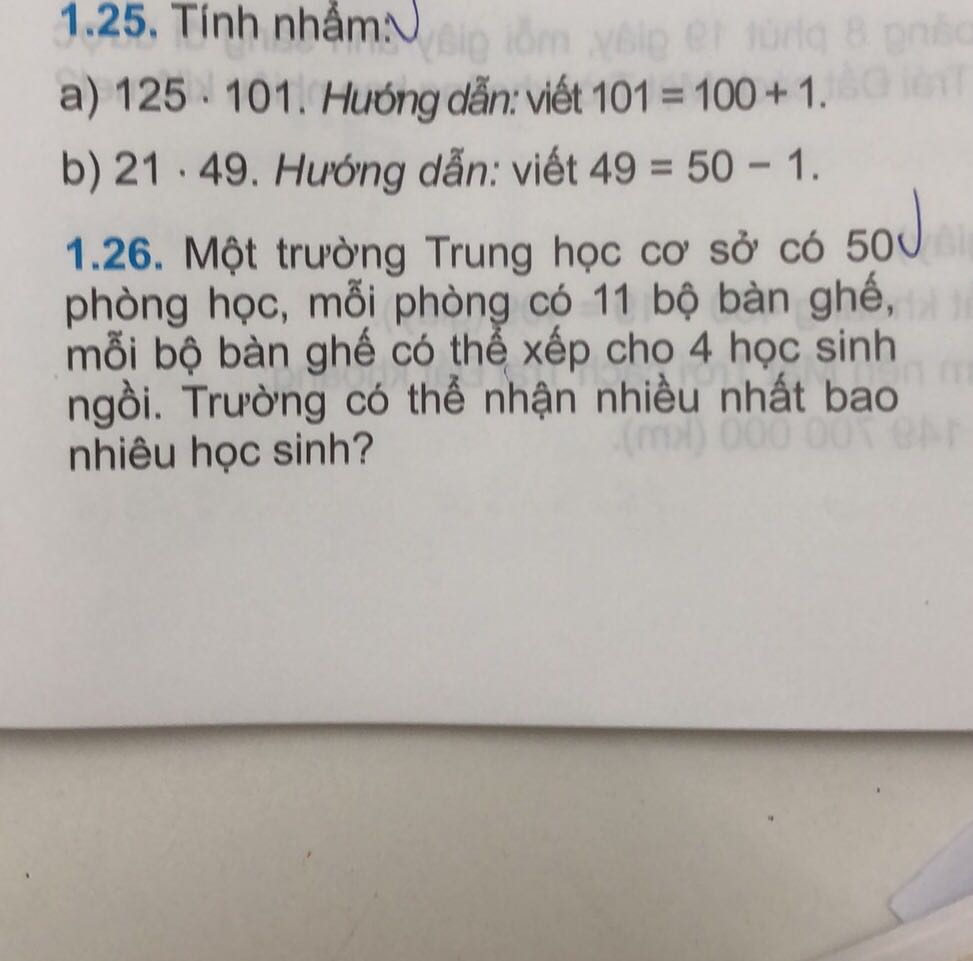

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


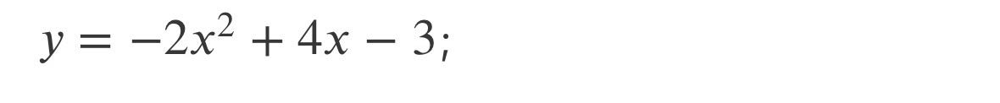

-- Number of words: 22


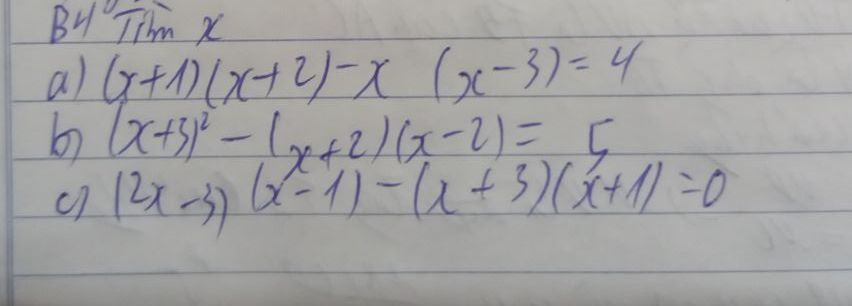

-- Number of words: 22


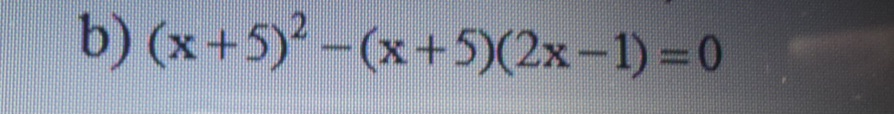

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


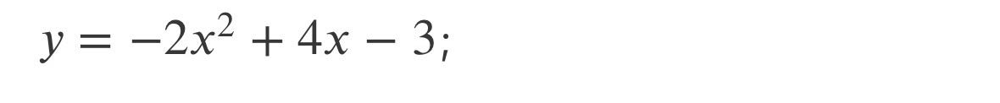

-- Number of words: 22


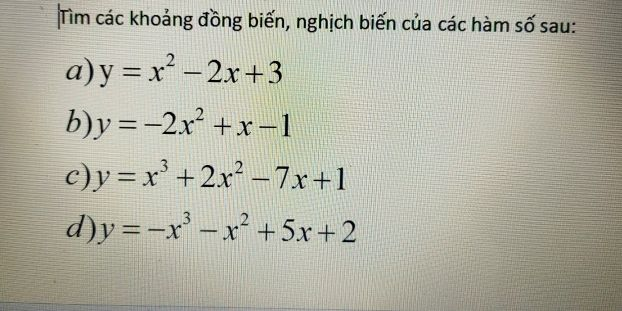

-- Number of words: 22


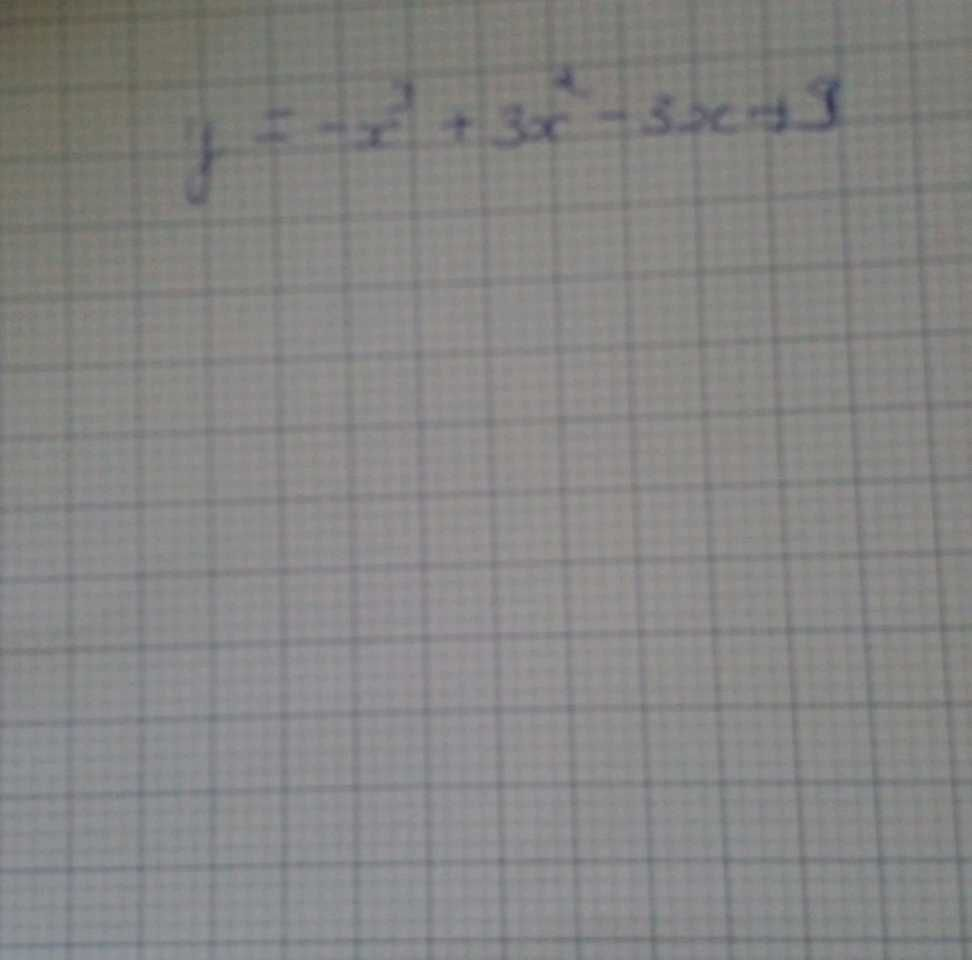

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


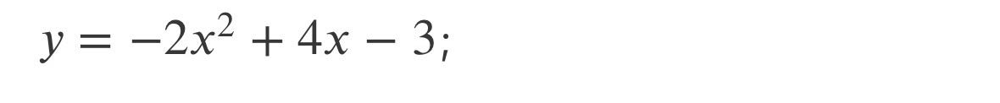

-- Number of words: 22


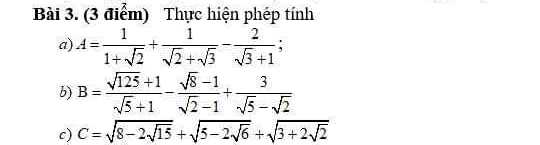

-- Number of words: 22


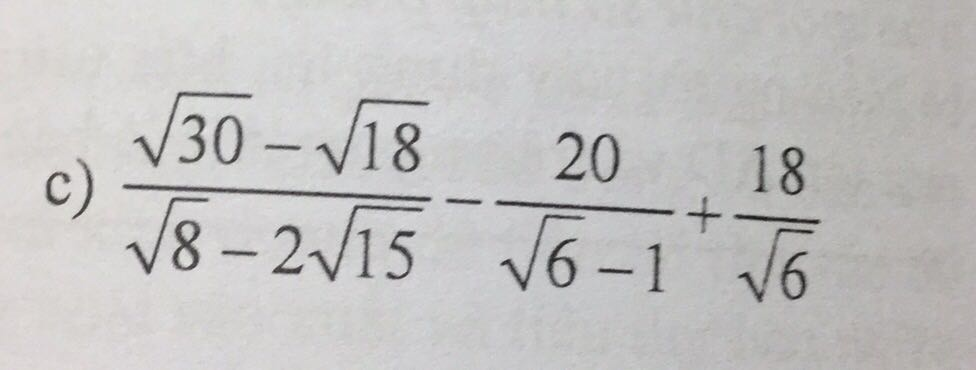

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


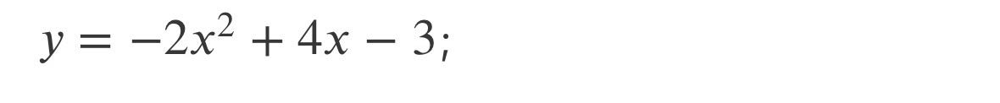

-- Number of words: 22


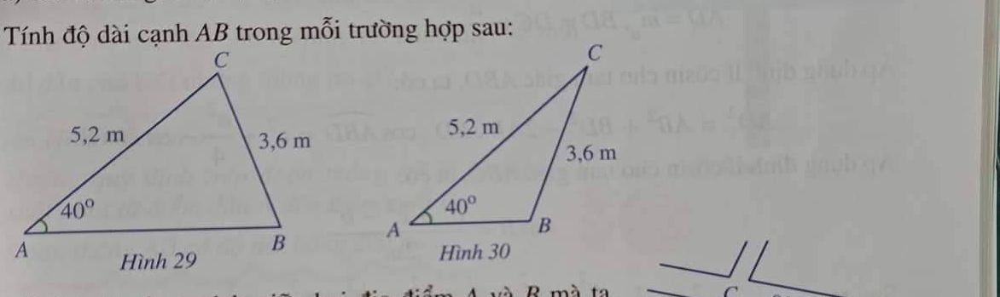

-- Number of words: 22


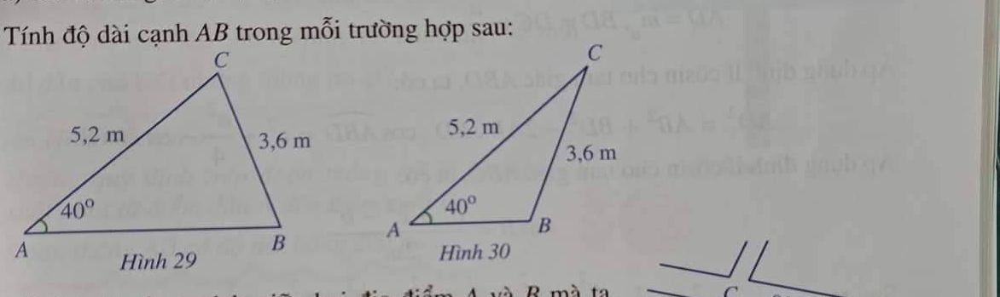

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


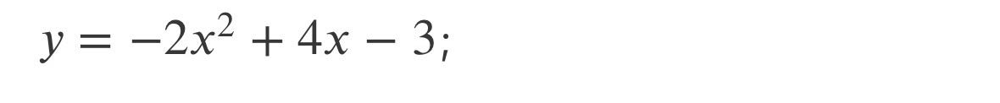

-- Number of words: 22


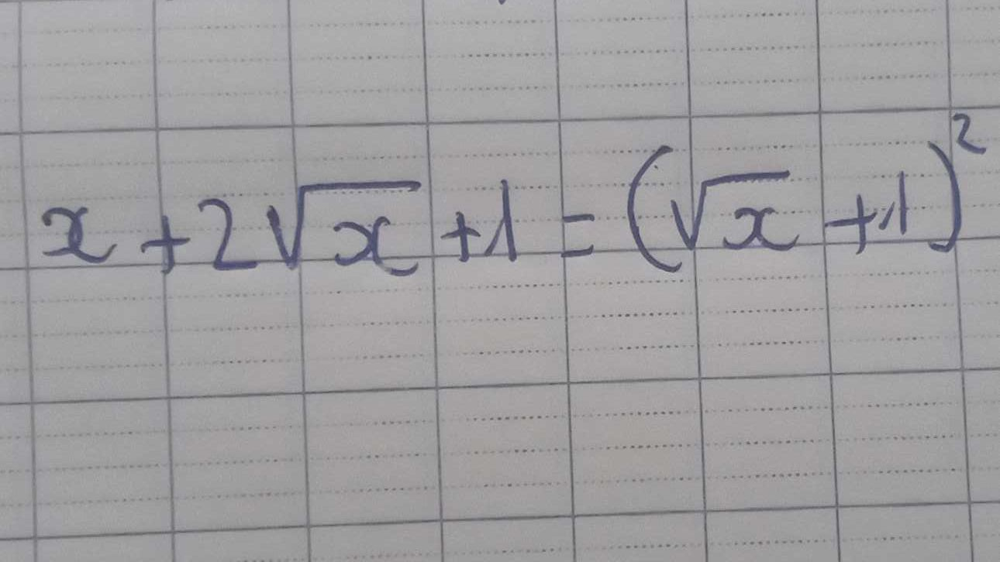

-- Number of words: 22


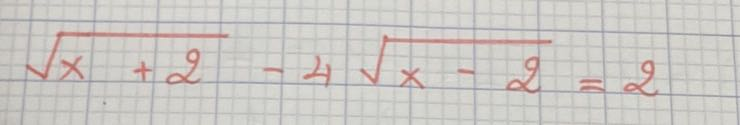

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


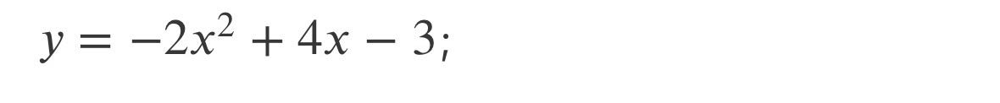

-- Number of words: 22


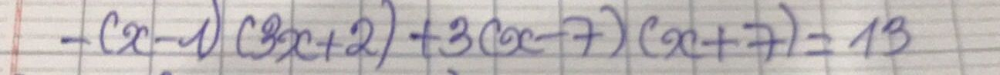

-- Number of words: 22


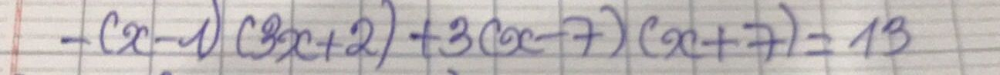

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


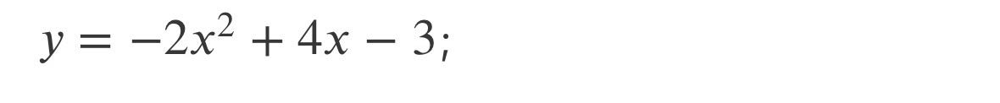

-- Number of words: 22


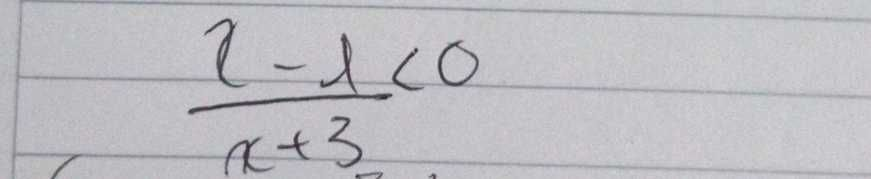

-- Number of words: 22


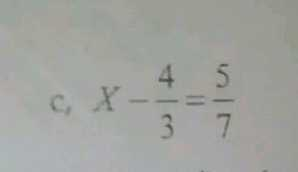

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


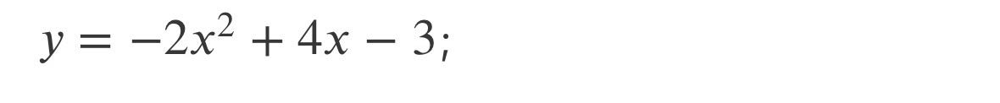

-- Number of words: 22


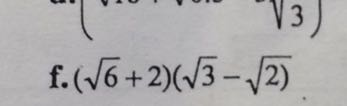

-- Number of words: 22


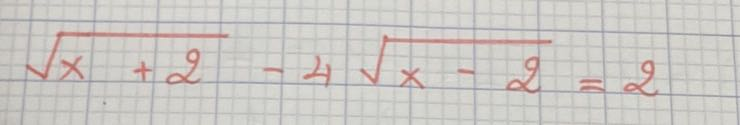

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


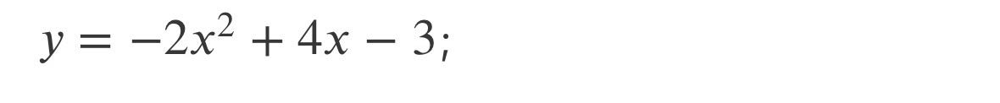

-- Number of words: 22


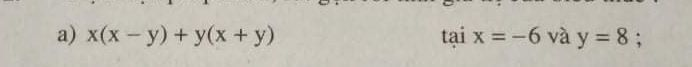

-- Number of words: 22


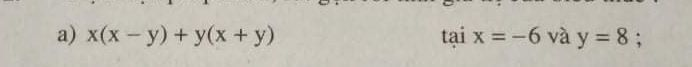

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


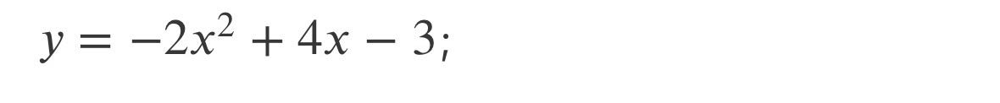

-- Number of words: 22


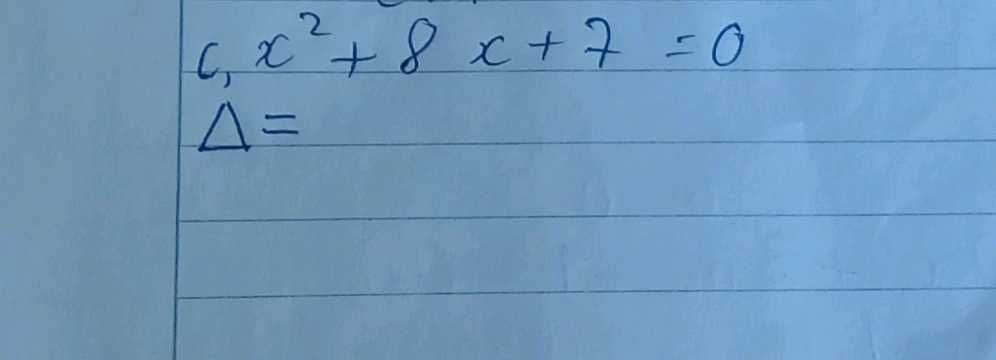

-- Number of words: 22


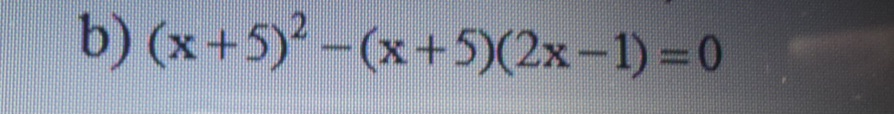

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


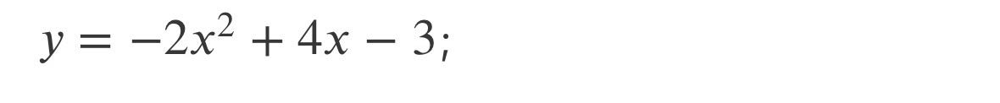

-- Number of words: 22


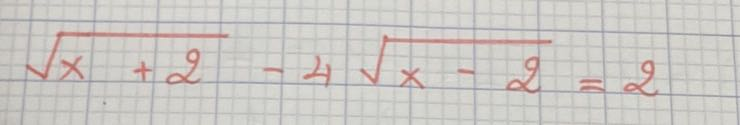

-- Number of words: 22


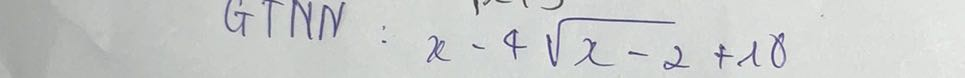

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


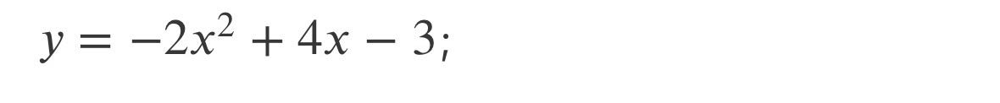

-- Number of words: 22


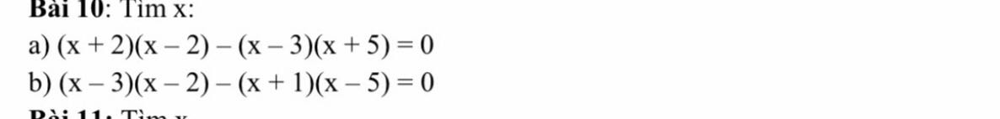

-- Number of words: 22


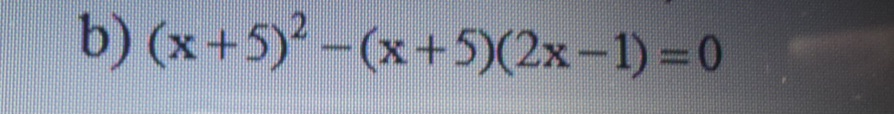

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


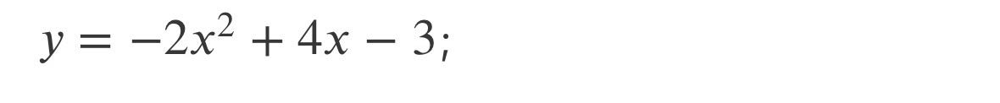

-- Number of words: 22


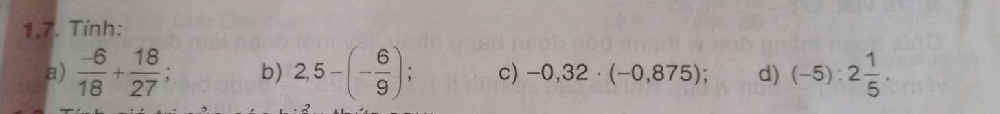

-- Number of words: 22


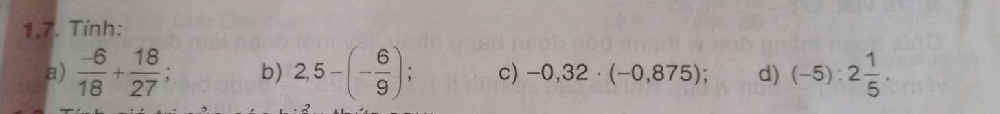

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


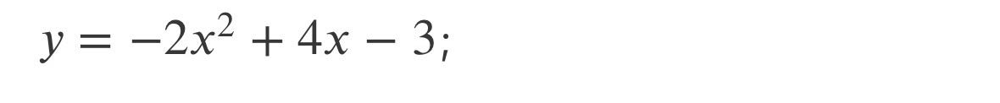

-- Number of words: 22


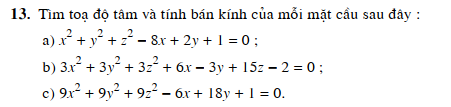

-- Number of words: 22


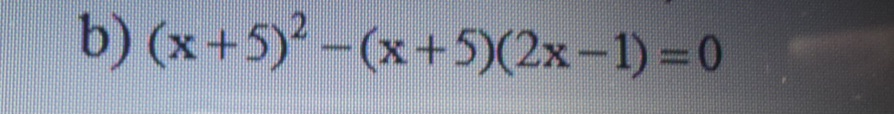

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


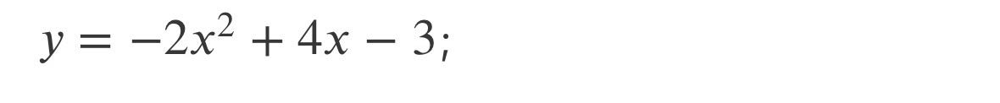

-- Number of words: 22


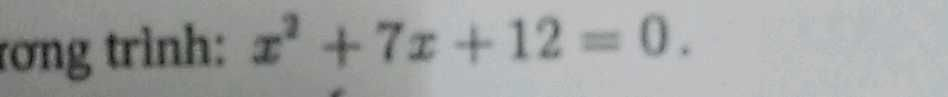

-- Number of words: 22


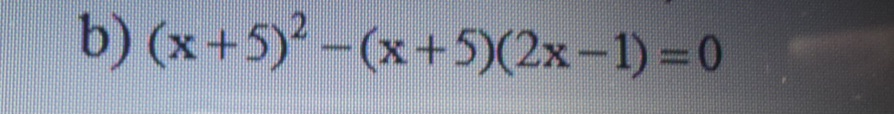

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


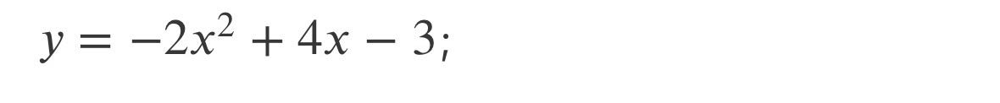

-- Number of words: 22


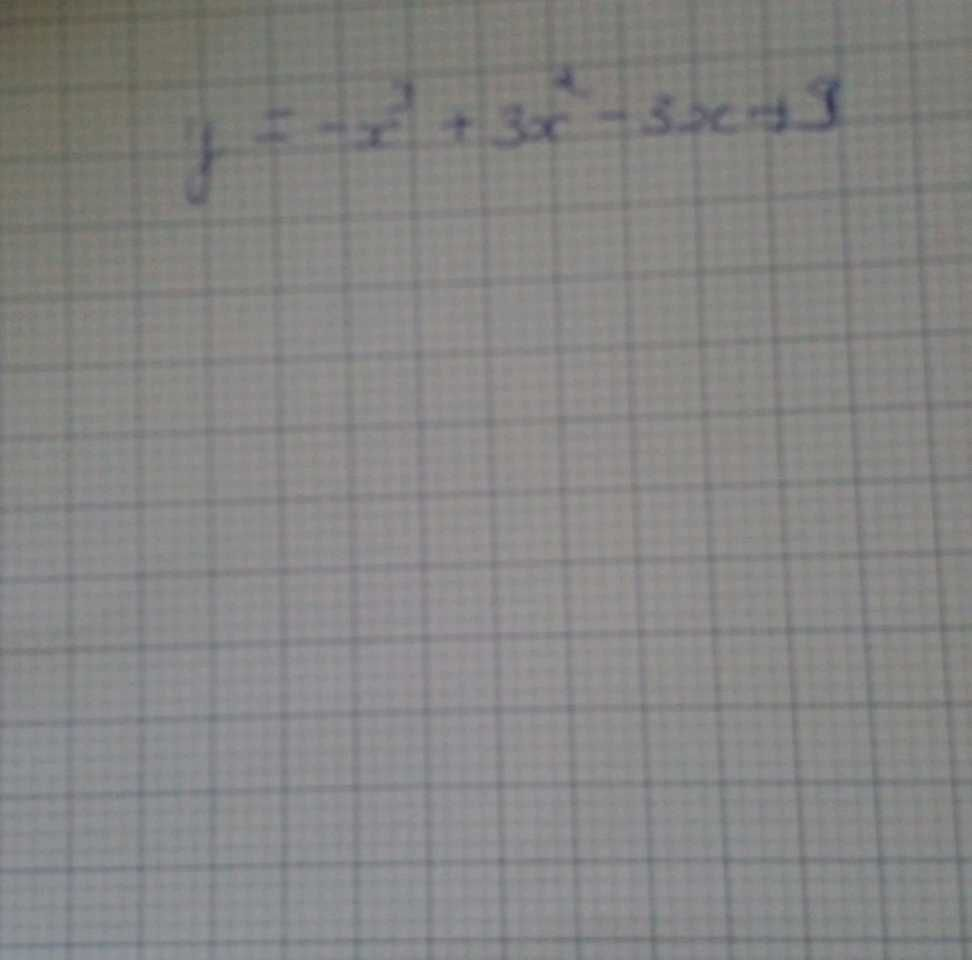

-- Number of words: 22


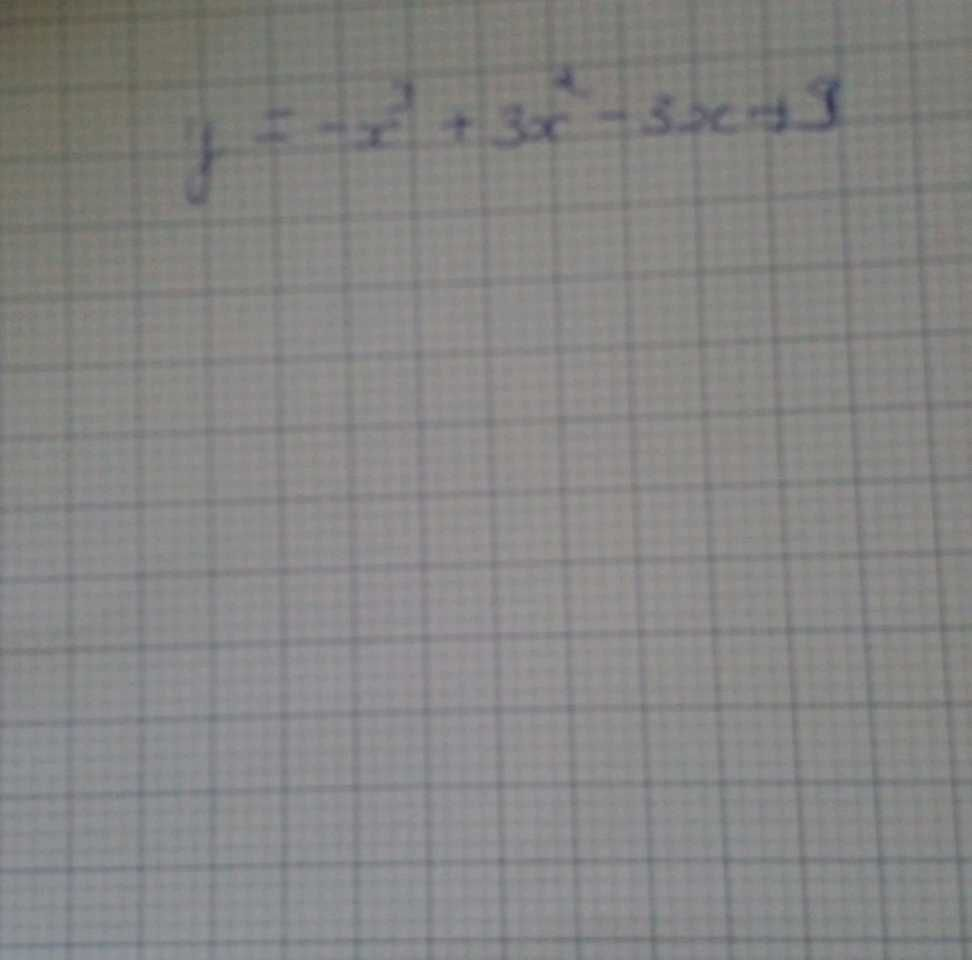

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


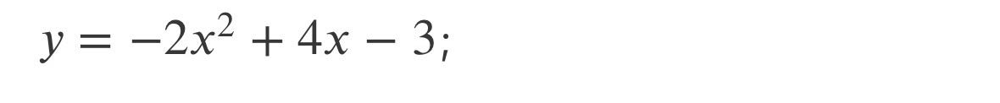

-- Number of words: 22


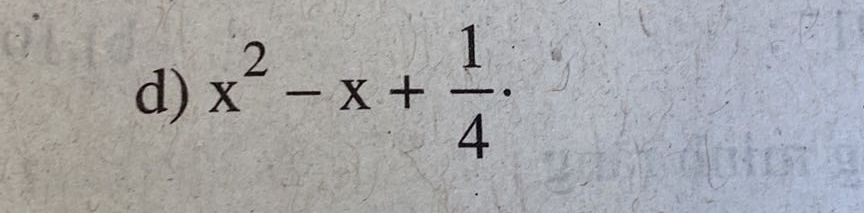

-- Number of words: 22


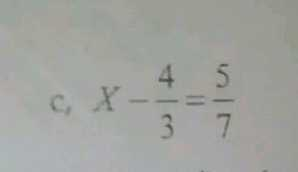

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


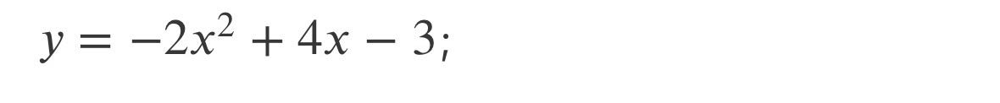

-- Number of words: 22


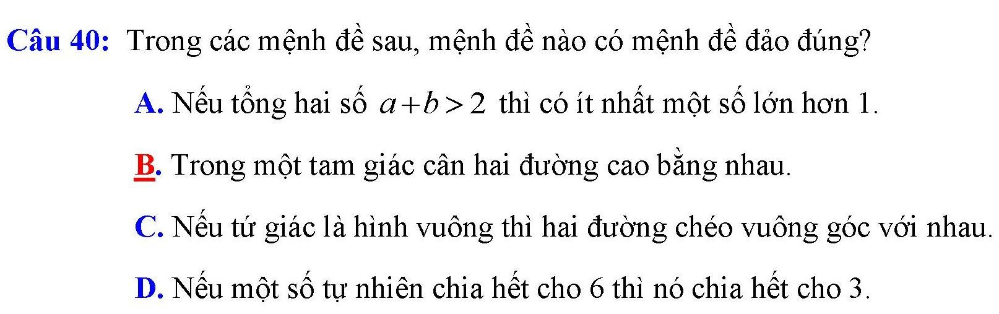

-- Number of words: 22


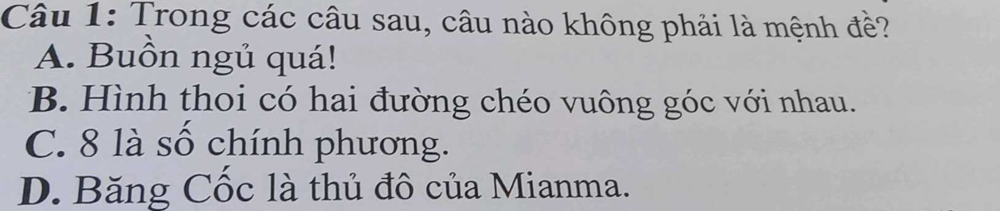

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


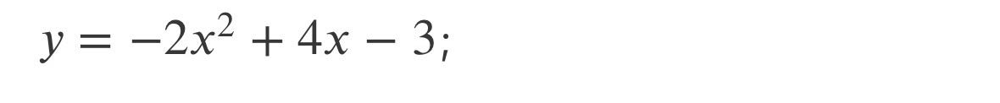

-- Number of words: 22


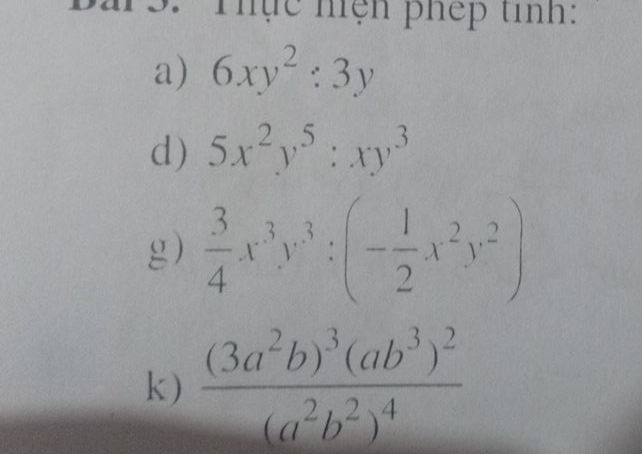

-- Number of words: 22


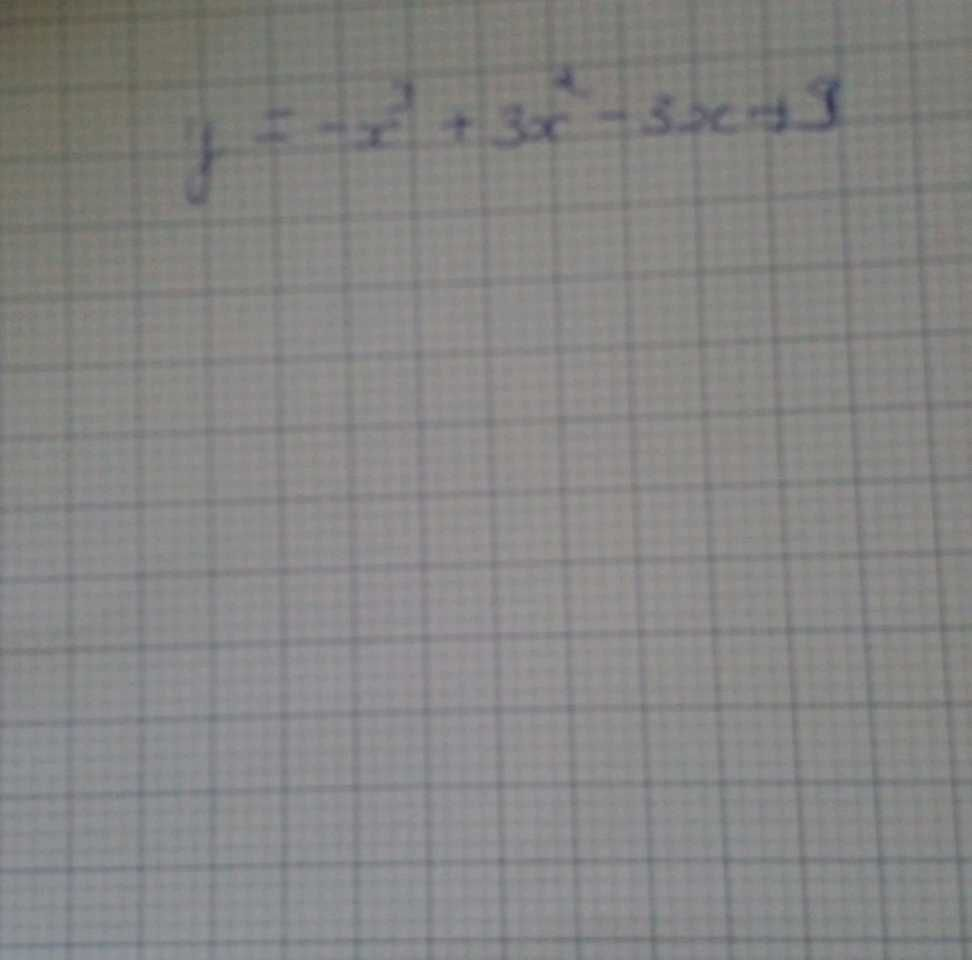

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


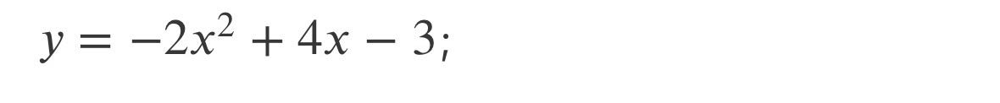

-- Number of words: 22


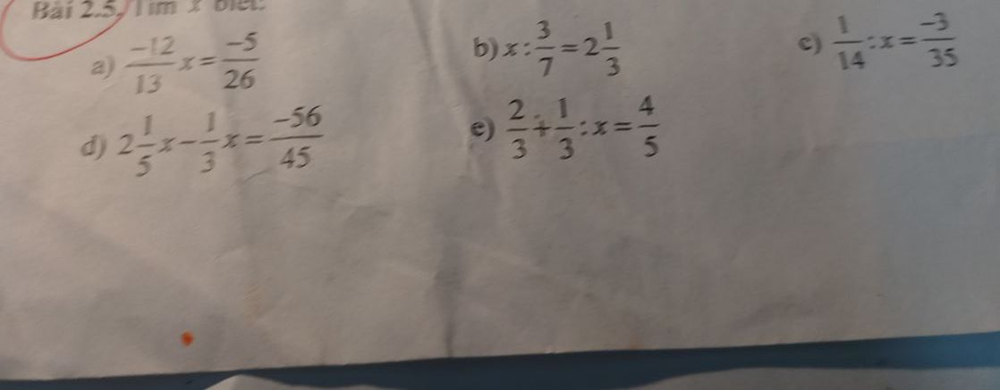

-- Number of words: 22


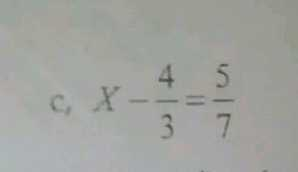

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


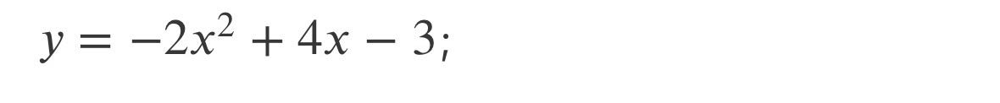

-- Number of words: 22


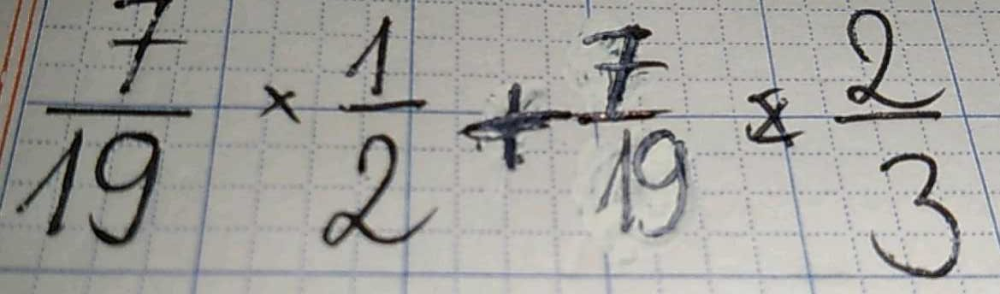

-- Number of words: 22


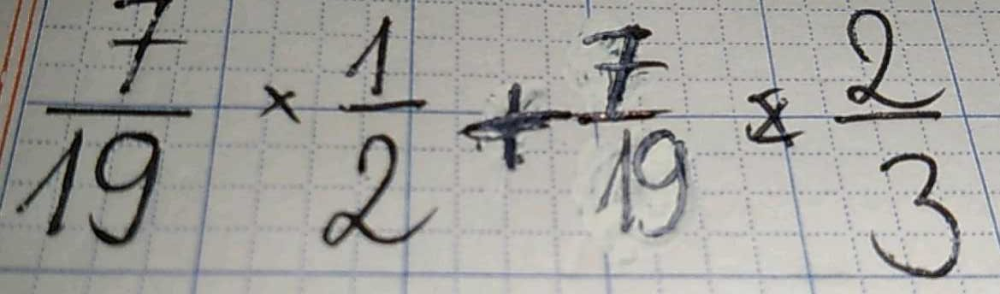

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


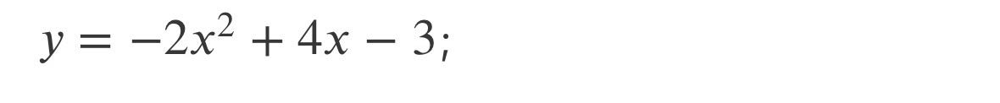

-- Number of words: 22


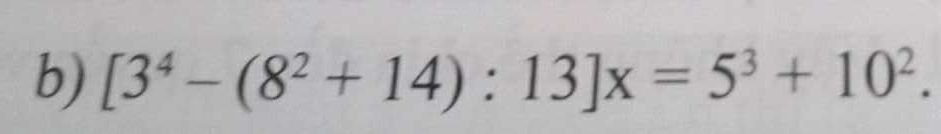

-- Number of words: 22


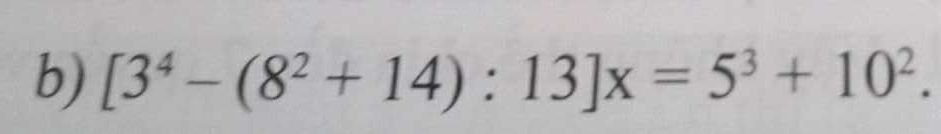

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


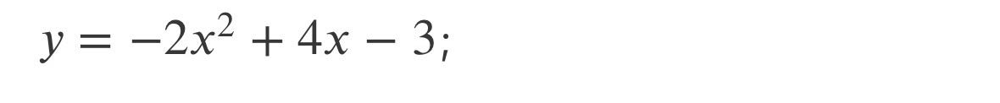

-- Number of words: 22


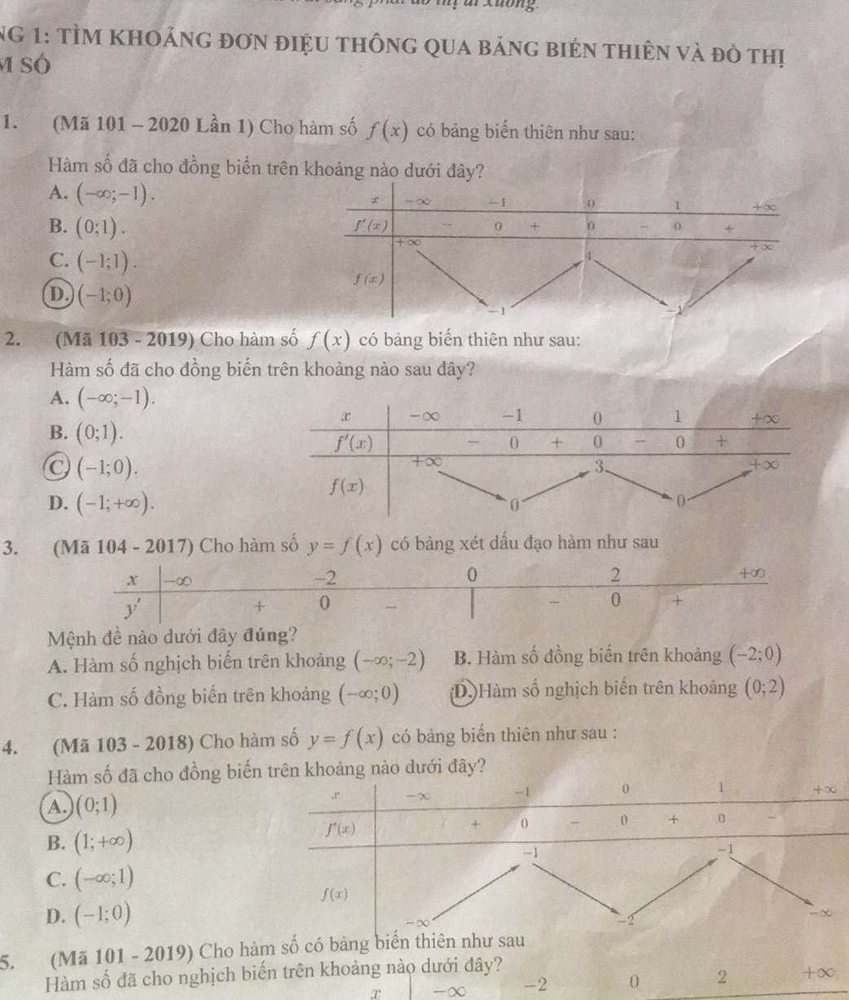

-- Number of words: 22


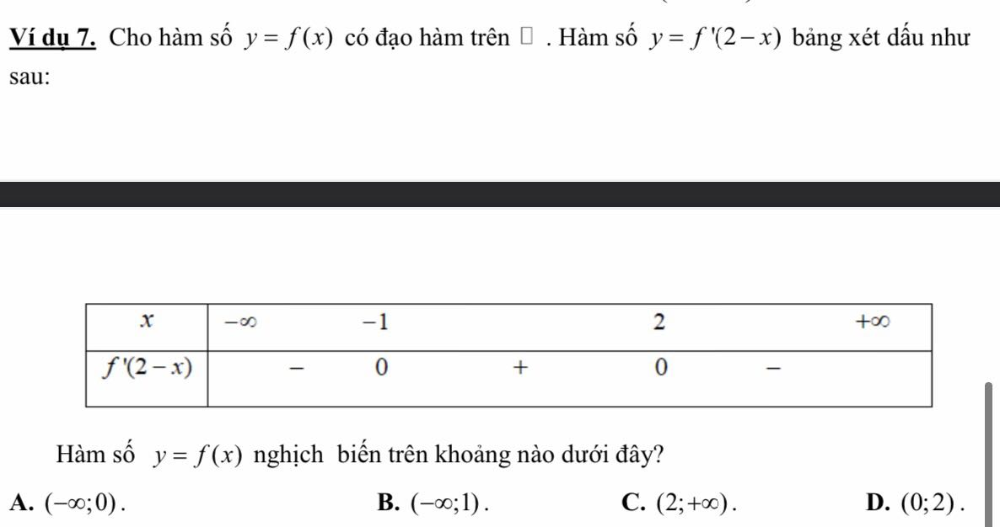

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


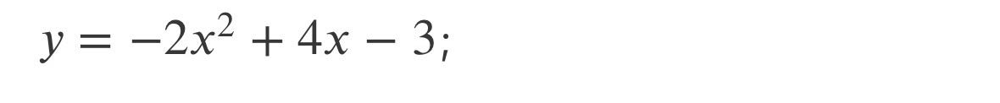

-- Number of words: 22


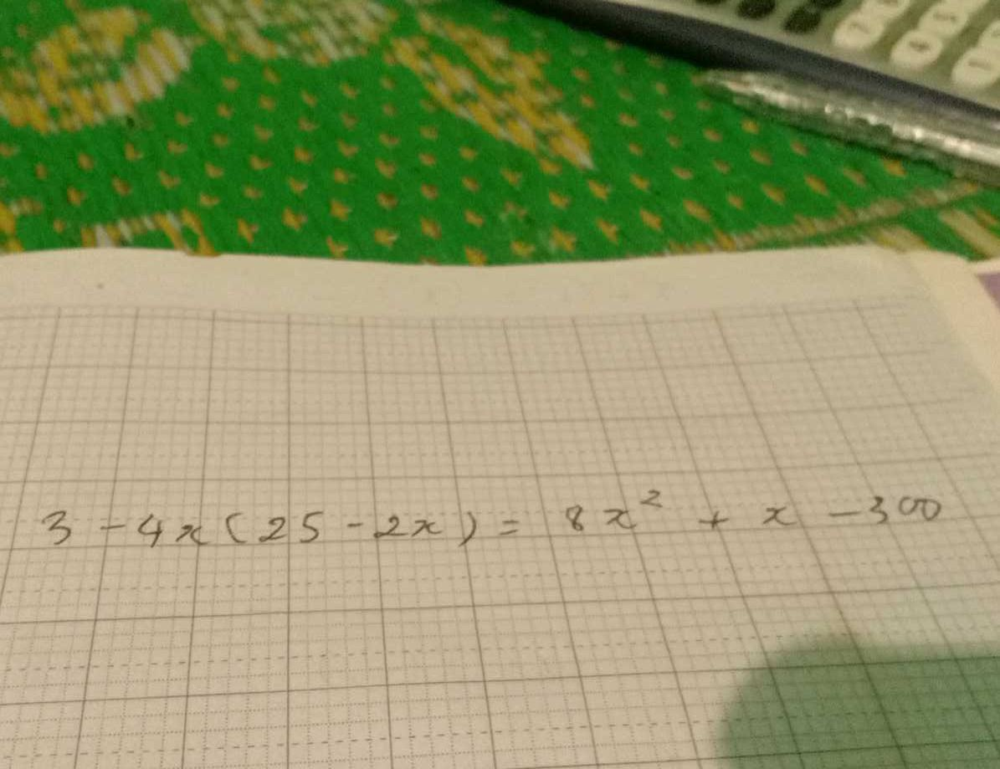

-- Number of words: 22


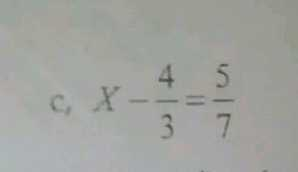

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


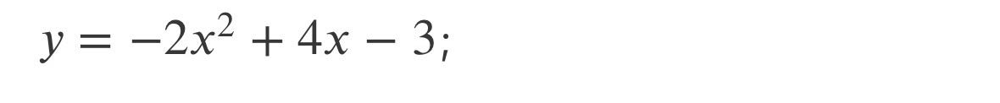

-- Number of words: 22


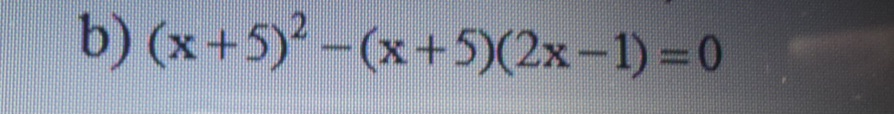

-- Number of words: 22


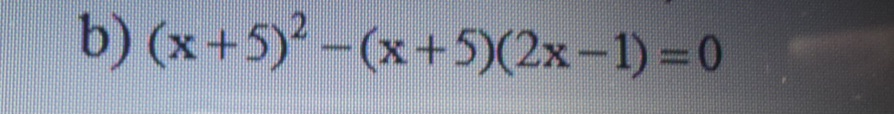

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


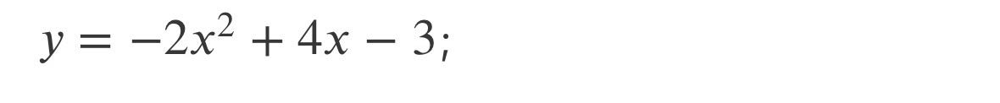

-- Number of words: 22


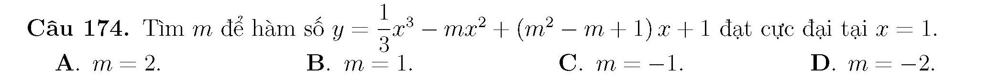

-- Number of words: 22


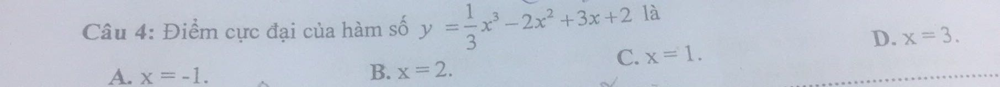

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


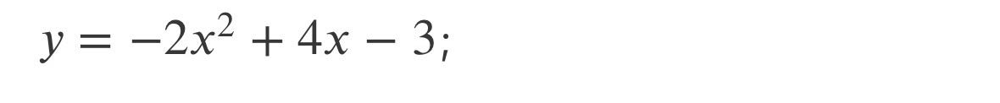

-- Number of words: 22


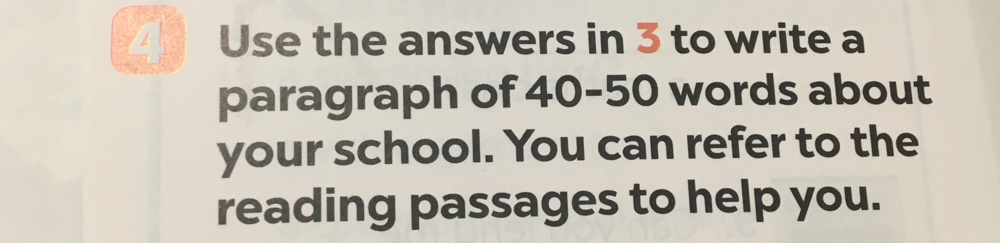

-- Number of words: 22


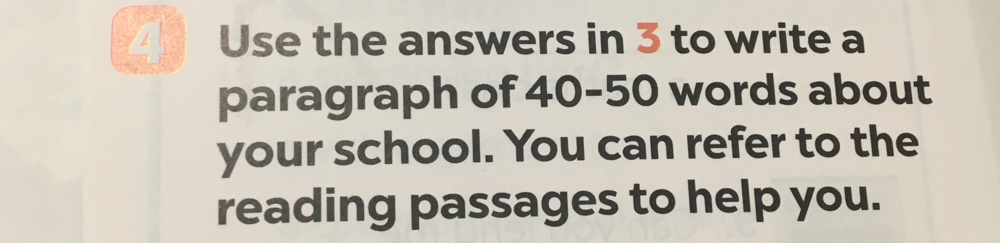

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


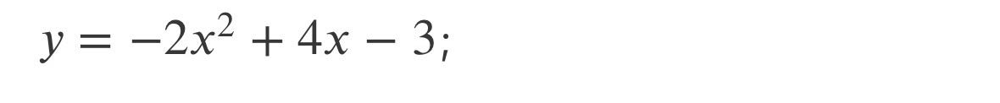

-- Number of words: 22


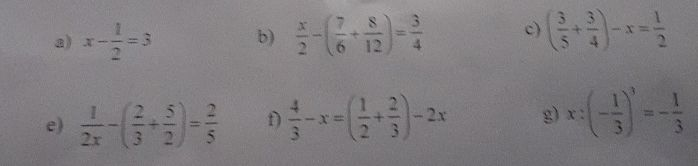

-- Number of words: 22


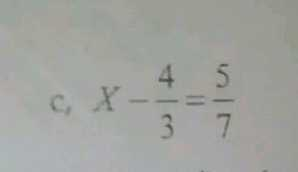

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


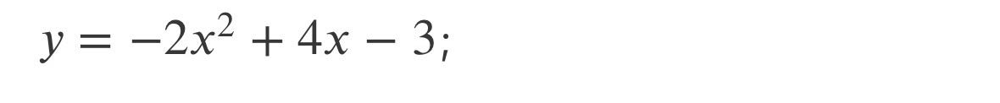

-- Number of words: 22


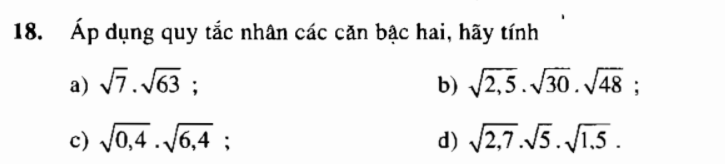

-- Number of words: 22


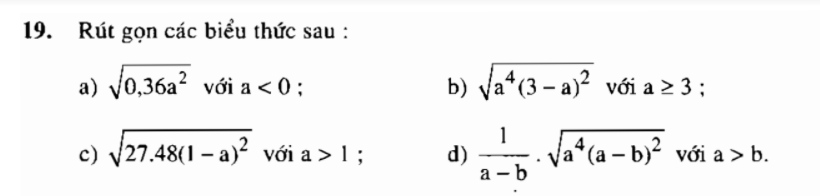

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


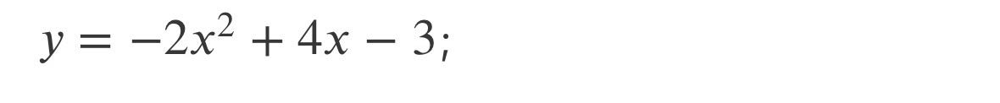

-- Number of words: 22


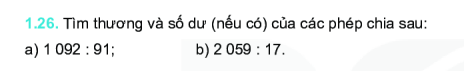

-- Number of words: 22


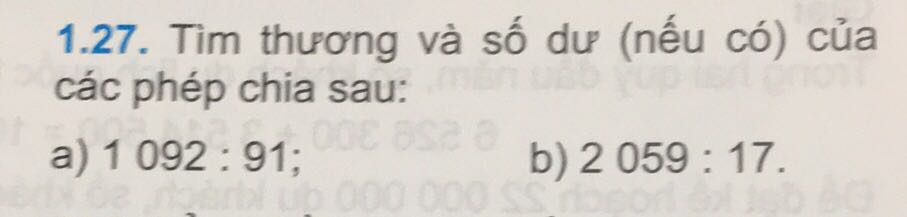

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


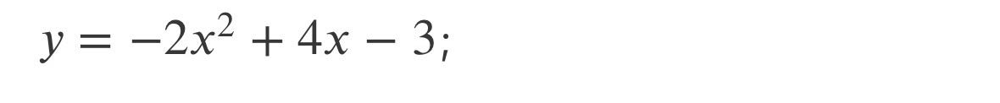

-- Number of words: 22


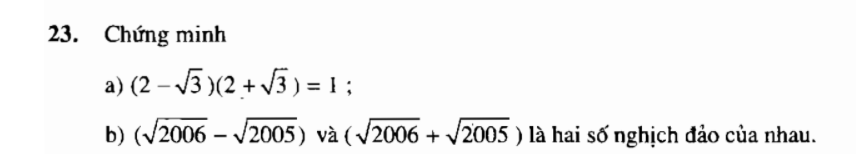

-- Number of words: 22


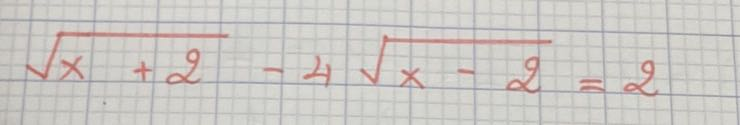

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


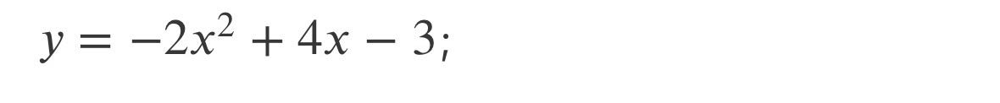

-- Number of words: 22


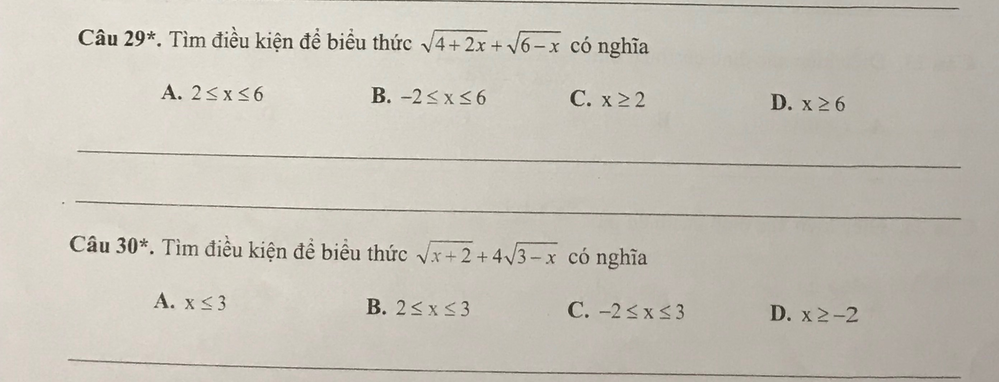

-- Number of words: 22


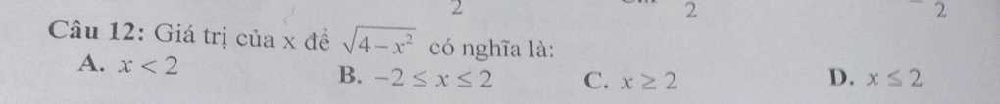

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


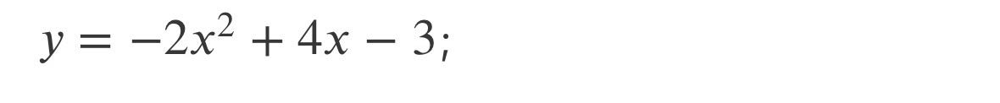

-- Number of words: 22


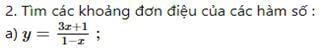

-- Number of words: 22


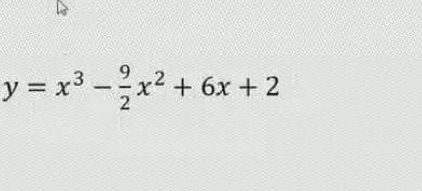

************

PAIRS: 52 - Cosine score: 1.0
-- Number of words: 14


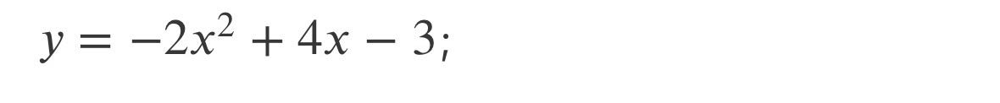

-- Number of words: 22


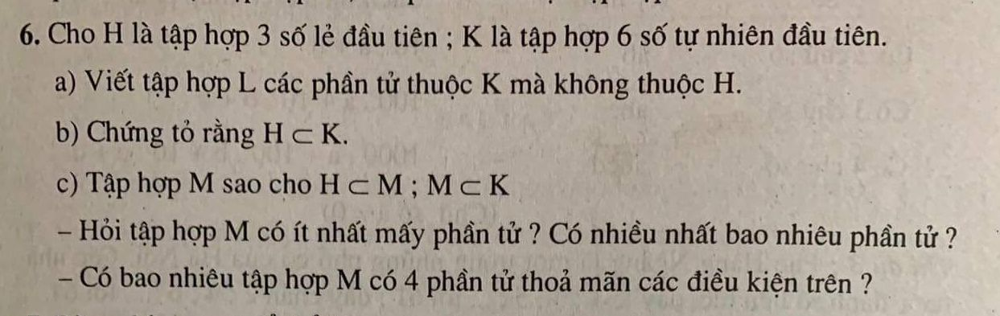

-- Number of words: 22


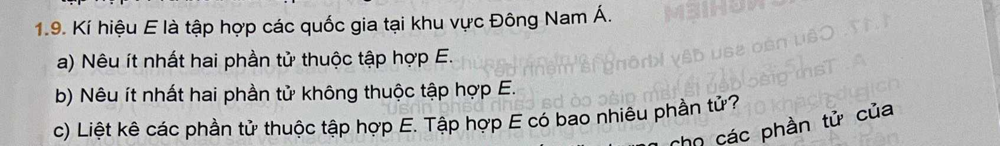

************



In [83]:
for url1, url2 in zip(df_a['Question Image'].values, df_a['cosine_image'].values):
    print('PAIRS: {} - Cosine score: {}'.format(idx + 1, df_a['score'].values[idx]))
    print('-- Number of words:', df_a['word_count_lookup'].values[idx])
    img0 = Disp.Image(requests.get(df_a['Lookup Image'].values[idx]).content)
    display(img0)
    print('-- Number of words:', df_a['word_count_question'].values[idx])
    img1 = Disp.Image(requests.get(url1).content)
    display(img1)
    print('-- Number of words:', df_a['cosine_word_count_question'].values[idx])
    img2 = Disp.Image(requests.get(url2).content)
    display(img2)
    print('************')
    print()

In [104]:
df

,Feedback ID,Lookup Text,Question Text,Feedback Type,Feedback Result,Human Feedback,Lookup Image,Question Image,index_org,clean_lookup,...,char_count_question,word_count_question,average_word_length_question,diff_word,diff_bin,search_result,score,cosine_word_count_question,cosine_diff_bin,cosine_image
0,4416.0,b) \( \left(\frac{-4}{15}-\frac{18}{19}\right)-\left(\frac{20}{19}-\frac{11}{15}\right) \),a) \( \frac{2}{3}+\frac{-1}{3}+\frac{7}{15} \)\nd) \( \frac{3}{5}+\frac{1}{5} \cdot \frac{-17}{9} \)\nb) \( \left(\frac{-4}{15}-\frac{18}{19}\right)-\left(\frac{20}{19}-\frac{11}{15}\right) \)\nc) \( \left(\frac{9}{10}-\frac{15}{16}\right) \cdot\left(\frac{5}{12}-\frac{11}{15}-\frac{7}{20}\right) \)\ne) \( \left(\frac{-3}{4}+\frac{2}{5}\right): \frac{3}{7}+\left(\frac{3}{5}+\frac{-1}{4}\right): \frac{3}{7} \),NEGATIVE,MATCH,NOT MATCH,https://s3.icankid.io/uploads/question/9a7aa760-2952-11ed-8671-9785b1571c36,https://s3.icankid.io/uploads/question/41bf56d0-2929-11ed-8671-9785b1571c36,0,b ) \ ( \_left ( \ frac { - 4 } { 15 } - \ frac { 18 }_{ 19 }_\_right ) - \_left ( \ frac { 20 }_{ 19 } - \ frac { 11 } { 15 }_\_right ) \ ),...,640,217,2.949309,171,Very high,a) \( \frac{2}{3}+\frac{-1}{3}+\frac{7}{15} \)\nd) \( \frac{3}{5}+\frac{1}{5} \cdot \frac{-17}{9} \)\nb) \( \left(\frac{-4}{15}-\frac{18}{19}\right)-\left(\frac{20}{19}-\frac{11}{15}\right) \)\nc) \( \left(\frac{9}{10}-\frac{15}{16}\right) \cdot\left(\frac{5}{12}-\frac{11}{15}-\frac{7}{20}\right) \)\ne) \( \left(\frac{-3}{4}+\frac{2}{5}\right): \frac{3}{7}+\left(\frac{3}{5}+\frac{-1}{4}\right): \frac{3}{7} \),0.856083,217,Very high,https://s3.icankid.io/uploads/question/41bf56d0-2929-11ed-8671-9785b1571c36
1,4419.0,Đề số \( 1 . \)\n1. Tính\nb) \( \sqrt{25} \)\nc) \( \sqrt{-36} \)\na) \( \sqrt{64} \)\ne) \( \sqrt{(-5)^{2}} \)\nd) \( \sqrt{5^{2}} \)\nf) \( \frac{2}{3} \sqrt{81}-\left(-\frac{3}{4}\right): \sqrt{\frac{9}{64}}+\left(\frac{\sqrt{2}}{\sqrt{3}}\right)^{0}-(\sqrt{3})^{2} \),b) \( \sqrt{25} \)\nc) \( \sqrt{-36} \)\na) \( \sqrt{64} \)\n\( 0=\frac{2 s}{\partial s} \) e) \( \sqrt{(-5)^{2}} \)\nd) \( \sqrt{5^{2}} \)\nf) \( \frac{2}{3} \sqrt{81}-\left(-\frac{3}{4}\right): \sqrt{\frac{9}{64}}+\left(\frac{\sqrt{2}}{3}\right)^{0}-(\sqrt{3})^{2} \),NEGATIVE,MATCH,MATCH,https://s3.icankid.io/uploads/question/03980200-298b-11ed-8671-9785b1571c36,https://s3.icankid.io/uploads/question/5a47b890-2529-11ed-8671-9785b1571c36,1,s \ ( 1_._\ ) 1_._tnh b ) \ ( \ sqrt { 25 }_\ ) c ) \ ( \ sqrt { - 36 }_\ ) a ) \ ( \ sqrt { 64 }_\ ) e ) \ ( \_sqrt { ( - 5 ) ^ { 2 }_}_\ ) d ) \ ( \ sqrt { 5 ^ { 2 }_}_\ ) f ) \ ( \_frac { 2 } { 3_}_\ sqrt { 81 } - \_left ( - \ frac { 3 }_{ 4 }_\_right ) : \ sqrt {_\ frac { 9 }_{ 64 }_}_+_\_left ( \ frac {_\_sqrt { 2 }_}_{_\ sqrt { 3 }_}_\_right ) ^_{ 0 } - ( \ sqrt { 3 } ) ^ { 2 }_\ ),...,400,131,3.053435,2,Very low,b) \( \sqrt{25} \)\nc) \( \sqrt{-36} \)\na) \( \sqrt{64} \)\n\( 0=\frac{2 s}{\partial s} \) e) \( \sqrt{(-5)^{2}} \)\nd) \( \sqrt{5^{2}} \)\nf) \( \frac{2}{3} \sqrt{81}-\left(-\frac{3}{4}\right): \sqrt{\frac{9}{64}}+\left(\frac{\sqrt{2}}{3}\right)^{0}-(\sqrt{3})^{2} \),0.913726,131,Very low,https://s3.icankid.io/uploads/question/5a47b890-2529-11ed-8671-9785b1571c36
2,4420.0,1. Tính: \( \sqrt{\frac{25}{4}}+\left(\sqrt{\frac{1}{2}}\right)^{2}:\left(\frac{-\sqrt{9}}{4}\right) \cdot \sqrt{\frac{16}{81}}-3^{2}-(-2)^{2} \),Đề số \( 3 . \)\n1. Tính: \( \sqrt{\frac{25}{4}}+\left(\sqrt{\frac{1}{2}}\right)^{2}:\left(\frac{-\sqrt{9}}{4}\right) \cdot \sqrt{\frac{16}{81}}-3^{2}-(-2)^{2} \),POSITIVE,MATCH,MATCH,https://s3.icankid.io/uploads/question/a81b0750-298b-11ed-8671-9785b1571c36,https://s3.icankid.io/uploads/question/2d3358a0-2529-11ed-8671-9785b1571c36,2,1_._tnh : \ ( \ sqrt {_\ frac { 25 }_{ 4 } }_+_\_left ( \ sqrt {_\ frac { 1 } { 2 }_}_\_right ) ^ { 2 } : \_left ( \ frac { - \ sqrt { 9 } }_{ 4 }_\_right ) \ cdot \ sqrt {_\ frac { 16 }_{ 81 }_} - 3 ^ { 2 } - ( - 2 ) ^ { 2 }_\ ),...,243,80,3.037500,7,Low,Đề số \( 3 . \)\n1. Tính: \( \sqrt{\frac{25}{4}}+\l